# **West the Mozzies Nile? (Part 2)**

## **Contents**  
### **Overview**
### **Exploratory Data Analysis: Graphical Visualisations**
- **Distribution of Target Variable WnvPresent** 
- **Distribution of Variable NumMosquitos**
- **Visualise Total number of mosquitoes (All Species) in Years 2007, 2009, 2011, 2013**
- **Visualise Number of Mosquitoes Across Species Type and Year**
- **Visualise Number of Mosquitoes from Species that Carry and do not Carry WNV across Year-Month**
- **Visualise Number of Mosquitoes from Species that Carry and do not Carry WNV across Year**
- **Visualise Number of Mosquitoes from Species that Carry and do not Carry WNV across Month**
- **Visualise Number of Mosquitoes from Species that Carry and do not Carry WNV across Day of Month**
- **Visualise Weather Parameters and Number of WNV Mosquitoes in Each Year at Each Station**


### Exploratory Data Analysis Using Spatial Visualisations**](#spatialeda)
- **Visualise Frequency (in Days) of Each Trap Trapping At Least One Mosquito in 4 years (Years 2007, 2009, 2011 and 2013)**
- **Visualise Number of Mosquitoes (All Species) Trapped by Each Trap over 4 Years (Years 2007, 2009, 2011 and 2013)**
- **Visualise Locations of Traps with WNV Presence/Absence over Years 2007, 2009, 2011 and 2013**
- **Visualise Trap Locations with Presence/Absence of WNV and Number of Mosquitoes from Species that Carry/Do Not Carry WNV in Year 2007**
- **Visualise Trap Locations with Presence/Absence of WNV and Number of Mosquitoes from Species that Carry/Do Not Carry WNV in Year 2009**
- **Visualise Trap Locations with Presence/Absence of WNV and Number of Mosquitoes from Species that Carry/Do Not Carry WNV in Year 2011**
- **Visualise Trap Locations with Presence/Absence of WNV and Number of Mosquitoes from Species that Carry/Do Not Carry WNV in Year 2013**

### **Check for Multicollinearity between Predictor Variables**

### **Summary**
---

<div id="overview"></div>

## Overview
In Part 1 (Notebook 1), data cleaning on datasets train, test, weather and spray were performed. In this notebook (Part 2), we will seek to conduct exploratory data analysis by understanding the distributions of variables in the datasets and discover any relationships between the predictor variables and the absence/presence of the West Nile Virus (hereafter "WNV").

## Import Libraries and Datasets

In [1]:
# Import libraries 
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import skew

# import files for mapping
import geopandas as gpd
from shapely.geometry import Point, Polygon
import contextily as cx

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Import datasets
train = pd.read_csv('datasets/train_clean.csv')
test = pd.read_csv('datasets/test_clean.csv')
weather = pd.read_csv('datasets/weather_roll.csv')
spray = pd.read_csv('datasets/spray_clean.csv')

In [3]:
# Create a copy of train, weather, spray and test dataframes
# for EDA and visualisations
train1 = train.copy()
weather1 = weather.copy()
spray1 = spray.copy()
test1 = test.copy()

In [4]:
# Display train1 dataframe (1st 5 rows), columns and datatypes 
print(f"Dataframe train1")
display(train1.head())
print(train1.dtypes)

Dataframe train1


,date,species,trap,latitude,longitude,wnvpresent,dayofmonth,month,year,species_encode,...,wetbulb,heat,cool,preciptotal,stnpressure,sealevel,resultspeed,resultdir,avgspeed,humidity
0,2007-05-29,CULEX PIPIENS,T096,41.731922,-87.677512,0,29,5,2007,1,...,57.4,1.8,4.8,0.056,29.451,30.102,7.54,13.5,9.23,0.53668
1,2007-05-29,CULEX PIPIENS/RESTUANS,T048,41.867108,-87.654224,0,29,5,2007,3,...,57.4,1.8,4.8,0.056,29.451,30.102,7.54,13.5,9.23,0.53668
2,2007-05-29,CULEX PIPIENS/RESTUANS,T050,41.919343,-87.694259,0,29,5,2007,3,...,57.4,1.8,4.8,0.056,29.451,30.102,7.54,13.5,9.23,0.53668
3,2007-05-29,CULEX PIPIENS/RESTUANS,T054,41.921965,-87.632085,0,29,5,2007,3,...,57.4,1.8,4.8,0.056,29.451,30.102,7.54,13.5,9.23,0.53668
4,2007-05-29,CULEX PIPIENS/RESTUANS,T086,41.688324,-87.676709,0,29,5,2007,3,...,57.4,1.8,4.8,0.056,29.451,30.102,7.54,13.5,9.23,0.53668


date               object
species            object
trap               object
latitude          float64
longitude         float64
wnvpresent          int64
dayofmonth          int64
month               int64
year                int64
species_encode      int64
nummosquitos        int64
date_station       object
station             int64
tmax              float64
tmin              float64
tavg              float64
dewpoint          float64
wetbulb           float64
heat              float64
cool              float64
preciptotal       float64
stnpressure       float64
sealevel          float64
resultspeed       float64
resultdir         float64
avgspeed          float64
humidity          float64
dtype: object


In [5]:
# Display test1 dataframe (1st 5 rows), columns and datatypes 
print(f"Dataframe test1")
display(test1.head())
print(test1.dtypes)

Dataframe test1


,id,date,species,trap,latitude,longitude,dayofmonth,month,year,species_encode,...,wetbulb,heat,cool,preciptotal,stnpressure,sealevel,resultspeed,resultdir,avgspeed,humidity
0,1,2008-06-11,CULEX PIPIENS/RESTUANS,T002,41.95469,-87.800991,11,6,2008,3,...,65.5,0.3,7.1,0.265,29.093,29.803,8.93,15.8,10.74,0.719088
1,2,2008-06-11,CULEX RESTUANS,T002,41.95469,-87.800991,11,6,2008,2,...,65.5,0.3,7.1,0.265,29.093,29.803,8.93,15.8,10.74,0.719088
2,3,2008-06-11,CULEX PIPIENS,T002,41.95469,-87.800991,11,6,2008,1,...,65.5,0.3,7.1,0.265,29.093,29.803,8.93,15.8,10.74,0.719088
3,4,2008-06-11,CULEX SALINARIUS,T002,41.95469,-87.800991,11,6,2008,0,...,65.5,0.3,7.1,0.265,29.093,29.803,8.93,15.8,10.74,0.719088
4,5,2008-06-11,CULEX TERRITANS,T002,41.95469,-87.800991,11,6,2008,0,...,65.5,0.3,7.1,0.265,29.093,29.803,8.93,15.8,10.74,0.719088


id                  int64
date               object
species            object
trap               object
latitude          float64
longitude         float64
dayofmonth          int64
month               int64
year                int64
species_encode      int64
date_station       object
station             int64
tmax              float64
tmin              float64
tavg              float64
dewpoint          float64
wetbulb           float64
heat              float64
cool              float64
preciptotal       float64
stnpressure       float64
sealevel          float64
resultspeed       float64
resultdir         float64
avgspeed          float64
humidity          float64
dtype: object


In [6]:
# Display weather1 dataframe (1st 5 rows), columns and datatypes 
print(f"Dataframe weather1")
display(weather1.head())
print(weather1.dtypes)

Dataframe weather1


,date,station,tmax,tmin,tavg,dewpoint,wetbulb,heat,cool,preciptotal,stnpressure,sealevel,resultspeed,resultdir,avgspeed,dayofmonth,month,year,humidity,date_station
0,2007-05-10,1,73.4,50.7,62.05,45.2,53.5,4.1,1.4,0.013,29.323,30.048,7.88,11.9,9.89,5.5,5.0,2007.0,0.552441,2007-05-10_1
1,2007-05-11,1,72.1,50.8,61.45,44.3,53.0,4.5,1.2,0.013,29.346,30.070,8.84,9.5,10.26,6.5,5.0,2007.0,0.545472,2007-05-11_1
2,2007-05-12,1,72.6,51.2,61.90,43.7,52.9,4.1,1.2,0.013,29.357,30.081,8.78,9.4,10.21,7.5,5.0,2007.0,0.521589,2007-05-12_1
3,2007-05-13,1,72.9,50.9,61.90,43.0,52.7,4.1,1.2,0.013,29.367,30.093,8.27,10.1,9.83,8.5,5.0,2007.0,0.508340,2007-05-13_1
4,2007-05-14,1,75.3,51.6,63.45,43.6,53.6,3.4,2.0,0.013,29.359,30.085,8.92,11.4,10.48,9.5,5.0,2007.0,0.493916,2007-05-14_1


date             object
station           int64
tmax            float64
tmin            float64
tavg            float64
dewpoint        float64
wetbulb         float64
heat            float64
cool            float64
preciptotal     float64
stnpressure     float64
sealevel        float64
resultspeed     float64
resultdir       float64
avgspeed        float64
dayofmonth      float64
month           float64
year            float64
humidity        float64
date_station     object
dtype: object


In [7]:
# Display spray1 dataframe (1st 5 rows), columns and datatypes 
print(f"Dataframe spray1")
display(spray1.head())
print(spray1.dtypes)

Dataframe spray1


,date,latitude,longitude
0,2011-08-29,42.391623,-88.089163
1,2011-08-29,42.391348,-88.089163
2,2011-08-29,42.391022,-88.089157
3,2011-08-29,42.390637,-88.089158
4,2011-08-29,42.390410,-88.088858


date          object
latitude     float64
longitude    float64
dtype: object


In [8]:
# Convert date from string to datetime object in train1, weather1 and spray1 dataframes
train1['date']= pd.to_datetime(train1['date'])
weather1['date']= pd.to_datetime(weather1['date'])
spray1['date']= pd.to_datetime(spray1['date'])

<div id="eda"></div>

## Exploratory Data Analysis: Graphical Visualisations

<div id="distributionwnvpresent"></div>

### Distribution of Target Variable WnvPresent

We will view the distribution of value counts of the target variable WnvPresent and to check for imbalanced data.

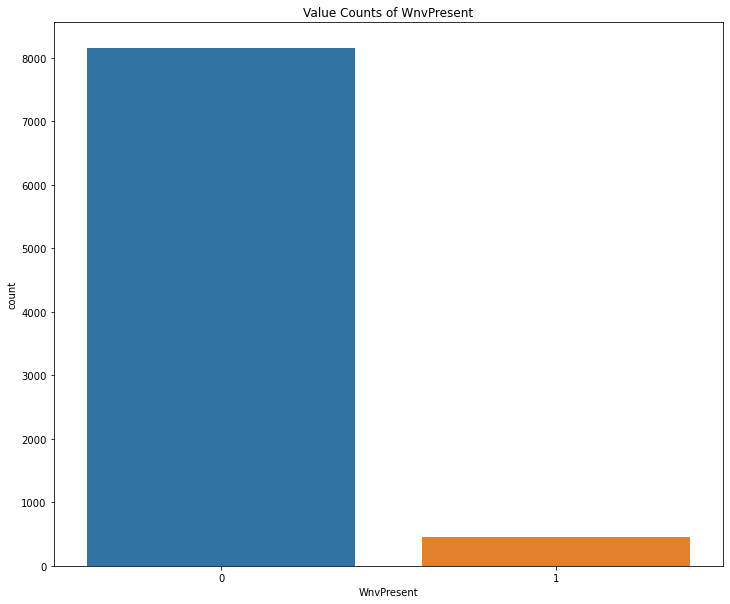

0    8153
1     457
Name: wnvpresent, dtype: int64
0    0.946922
1    0.053078
Name: wnvpresent, dtype: float64


In [9]:
# Plot the value counts of the target variable wnvpresent
plt.figure(figsize = (12, 10))
sns.countplot(x="wnvpresent", data = train1)
plt.title('Value Counts of WnvPresent')
plt.xlabel('WnvPresent')
plt.show()

# Show value counts (unnormalized and normalized) for variable wnvpresent
print(train1['wnvpresent'].value_counts())
print(train1['wnvpresent'].value_counts(normalize = True))

From the histogram plot of WnvPresent:
- This is a heavily imbalanced dataset as there is a very unequal distribution of WnvPresent (94.7% of the observations have WnvPresent value of 0 and 5.3% of the observations have WnvPresent value of 1).
- In order to deal with this imbalanced dataset, we will adopt SMOTE, an oversampling technique, when modelling in Notebook 3.

<div id="distnummosquitos"></div>

### Distribution of Variable NumMosquitos

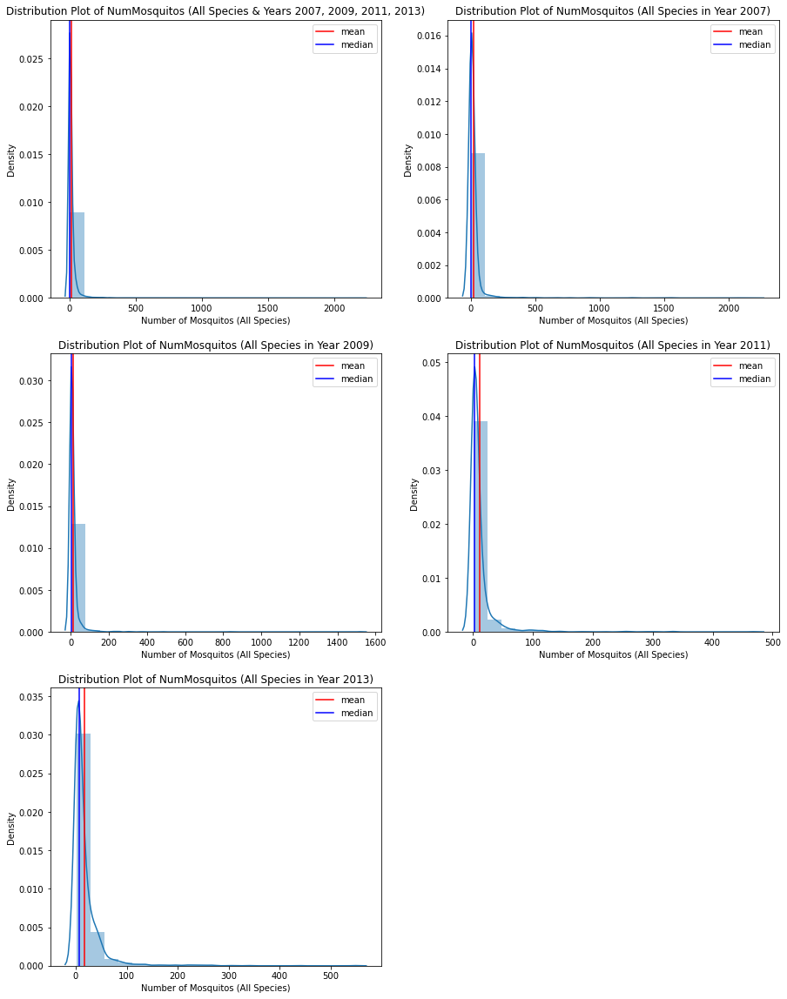

In [10]:
# Plot distribution of nummosquitos (all species) in years
# (1) Over 4 years (years 2007, 2009, 2011, 2013)
# (2) in year 2007
# (3) in year 2009
# (4) in year 2011
# (5) in year 2013

plt.figure(figsize = (15,20))
# 1st subplot: distribution of numnosquitos (all species) over 4 years (years 2007, 2009, 2011, 2013)
ax0 = plt.subplot(3, 2, 1)
sns.distplot(train1['nummosquitos'], bins = 20, kde = True)
plt.axvline(x = np.mean(train1['nummosquitos']), color = 'red', label = 'mean')
plt.axvline(x = np.median(train1['nummosquitos']), color = 'blue', label = 'median')
plt.title('Distribution Plot of NumMosquitos (All Species & Years 2007, 2009, 2011, 2013)')
plt.xlabel('Number of Mosquitos (All Species)')
plt.legend()

# 2nd subplot: distribution of numnosquitos (all species) in year 2007
ax1 = plt.subplot(3, 2, 2)
sns.distplot(train1.loc[train1['year']==2007, 'nummosquitos'], bins = 20, kde = True)
plt.axvline(x = np.mean(train1.loc[train1['year']==2007, 'nummosquitos']), color = 'red', label = 'mean')
plt.axvline(x = np.median(train1.loc[train1['year']==2007, 'nummosquitos']), color = 'blue', label = 'median')
plt.title('Distribution Plot of NumMosquitos (All Species in Year 2007)')
plt.xlabel('Number of Mosquitos (All Species)')
plt.legend()

# 3rd subplot: distribution of numnosquitos (all species) in year 2009
ax2 = plt.subplot(3, 2, 3)
sns.distplot(train1.loc[train1['year']==2009, 'nummosquitos'], bins = 20, kde = True)
plt.axvline(x = np.mean(train1.loc[train1['year']==2009, 'nummosquitos']), color = 'red', label = 'mean')
plt.axvline(x = np.median(train1.loc[train1['year']==2009, 'nummosquitos']), color = 'blue', label = 'median')
plt.title('Distribution Plot of NumMosquitos (All Species in Year 2009)')
plt.xlabel('Number of Mosquitos (All Species)')
plt.legend()

# 4th subplot: distribution of numnosquitos (all species) in year 2011
ax3 = plt.subplot(3, 2, 4)
sns.distplot(train1.loc[train1['year']==2011, 'nummosquitos'], bins = 20, kde = True)
plt.axvline(x = np.mean(train1.loc[train1['year']==2011, 'nummosquitos']), color = 'red', label = 'mean')
plt.axvline(x = np.median(train1.loc[train1['year']==2011, 'nummosquitos']), color = 'blue', label = 'median')
plt.title('Distribution Plot of NumMosquitos (All Species in Year 2011)')
plt.xlabel('Number of Mosquitos (All Species)')
plt.legend()

# 5th subplot: distribution of numnosquitos in year 2013
ax4 = plt.subplot(3, 2, 5)
sns.distplot(train1.loc[train1['year']==2013, 'nummosquitos'], bins = 20, kde = True)
plt.axvline(x = np.mean(train1.loc[train1['year']==2013, 'nummosquitos']), color = 'red', label = 'mean')
plt.axvline(x = np.median(train1.loc[train1['year']==2013, 'nummosquitos']), color = 'blue', label = 'median')
plt.title('Distribution Plot of NumMosquitos (All Species in Year 2013)')
plt.xlabel('Number of Mosquitos (All Species)')
plt.legend()
plt.show()

In [11]:
# Display summary statistics of number of mosquitos (all species) 
# (1) Over 4 years (years 2007, 2009, 2011, 2013)
# (2) in year 2007
# (3) in year 2009
# (4) in year 2011
# (5) in year 2013
print ("Summary statistics of number of mosquitos (all species) over 4 years (years 2007, 2009, 2011, 2013):")
print(train1['nummosquitos'].describe())
print ("Summary statistics of  number of mosquitos (all species) in year 2007:")
print(train1.loc[train1['year']==2007, 'nummosquitos'].describe())
print ("Summary statistics of  number of mosquitos (all species) in year 2009:")
print(train1.loc[train1['year']==2009, 'nummosquitos'].describe())
print ("Summary statistics of  number of mosquitos (all species) in year 2011:")
print(train1.loc[train1['year']==2011, 'nummosquitos'].describe())
print ("Summary statistics of  number of mosquitos (all species) in year 2013:")
print(train1.loc[train1['year']==2013, 'nummosquitos'].describe())

Summary statistics of number of mosquitos (all species) over 4 years (years 2007, 2009, 2011, 2013):
count    8610.000000
mean       15.683972
std        68.560634
min         1.000000
25%         2.000000
50%         4.000000
75%        11.000000
max      2206.000000
Name: nummosquitos, dtype: float64
Summary statistics of  number of mosquitos (all species) in year 2007:
count    2837.000000
mean       20.686641
std       106.819514
min         1.000000
25%         1.000000
50%         3.000000
75%        10.000000
max      2206.000000
Name: nummosquitos, dtype: float64
Summary statistics of  number of mosquitos (all species) in year 2009:
count    1921.000000
mean       10.988027
std        47.463466
min         1.000000
25%         1.000000
50%         3.000000
75%         8.000000
max      1520.000000
Name: nummosquitos, dtype: float64
Summary statistics of  number of mosquitos (all species) in year 2011:
count    1794.000000
mean       10.478818
std        27.419158
min         1.

In [12]:
# Calculate and print the mean, median and skewness of nummosquitos in training set
print(f" Mean of nummosquitos in years 2007, 2009, 2011 and 2013 is {np.mean(train1['nummosquitos']):.2f}, median is \
{np.median(train['nummosquitos']):.2f} and skewness is {skew(train['nummosquitos']):.2f}.")

print(f" Mean of nummosquitos in year 2007 is {np.mean(train1.loc[train1['year']==2007, 'nummosquitos']):.2f}, median is \
{np.median(train1.loc[train1['year']==2007, 'nummosquitos']):.2f} and skewness is \
{skew(train1.loc[train1['year']==2007, 'nummosquitos']):.2f}.")

print(f" Mean of nummosquitos in year 2009 is {np.mean(train1.loc[train1['year']==2009, 'nummosquitos']):.2f}, median is \
{np.median(train1.loc[train1['year']==2009, 'nummosquitos']):.2f} and skewness is \
{skew(train1.loc[train1['year']==2009, 'nummosquitos']):.2f}.")

print(f" Mean of nummosquitos in year 2011 is {np.mean(train1.loc[train1['year']==2011, 'nummosquitos']):.2f}, median is \
{np.median(train1.loc[train1['year']==2011, 'nummosquitos']):.2f} and skewness is \
{skew(train1.loc[train1['year']==2011, 'nummosquitos']):.2f}.")

print(f" Mean of nummosquitos in year 2013 is {np.mean(train1.loc[train1['year']==2013, 'nummosquitos']):.2f}, median is \
{np.median(train1.loc[train1['year']==2013, 'nummosquitos']):.2f} and skewness is \
{skew(train1.loc[train1['year']==2013, 'nummosquitos']):.2f}.")

 Mean of nummosquitos in years 2007, 2009, 2011 and 2013 is 15.68, median is 4.00 and skewness is 18.89.
 Mean of nummosquitos in year 2007 is 20.69, median is 3.00 and skewness is 13.57.
 Mean of nummosquitos in year 2009 is 10.99, median is 3.00 and skewness is 20.98.
 Mean of nummosquitos in year 2011 is 10.48, median is 3.00 and skewness is 8.22.
 Mean of nummosquitos in year 2013 is 17.71, median is 7.00 and skewness is 6.45.


From the distribution plots and summary statistics of NumMosquitos for all years 2007, 2009, 2011 and 2013,
- The distributions of NumMosquitos in  all years 2007, 2009, 2011 and 2013 do not follow a normal distribution (the histogram plot shows a skewed bell shape curve and it has a unimodal distribution (as depicted by the one peak).
- The distributions of NumMosquitos in  all years 2007, 2009, 2011 and 2013 are positively skewed (as shown from the skewness calculated) and the median is less than the mean.

<div id="nummosquitos4years"></div>

### Visualise Total number of mosquitoes (All Species) in Years 2007, 2009, 2011, 2013

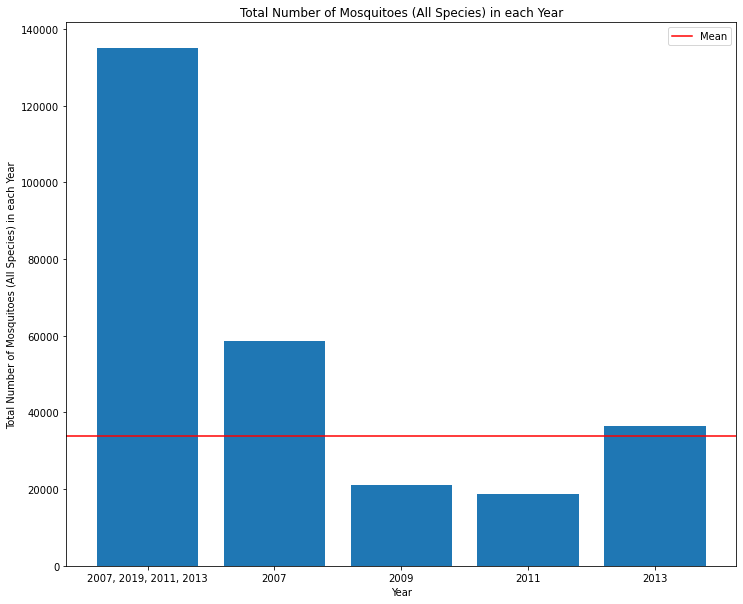

,year,nummosquitosinyear
0,"2007, 2019, 2011, 2013",135039
1,2007,58688
2,2009,21108
3,2011,18799
4,2013,36444


Mean Total Number of Mosquitoes (All Species) in each Year (2007, 2009, 2011, 2013) is 33760


In [13]:
# Display a dataframe containing total number of mosquitoes (all species) in (1) years 2007, 2009, 2011, 2013,
# (2) 2007, (3) 2009, (4) 2011, (5) 2013
allmos2007to2013 = train1['nummosquitos'].sum()
allmos2007 = train1.loc[train1['year'] == 2007, 'nummosquitos'].sum()
allmos2009 = train1.loc[train1['year'] == 2009, 'nummosquitos'].sum()
allmos2011 = train1.loc[train1['year'] == 2011, 'nummosquitos'].sum()
allmos2013 = train1.loc[train1['year'] == 2013, 'nummosquitos'].sum()

viz0 = pd.DataFrame({
    'year': ['2007, 2019, 2011, 2013', '2007', '2009', '2011', '2013'],
    'nummosquitosinyear': [allmos2007to2013, allmos2007, allmos2009, allmos2011, allmos2013]
})

plt.figure(figsize = (12,10))
plt.bar(viz0['year'], viz0['nummosquitosinyear'])
plt.axhline(y = (allmos2007to2013)/4, color = 'r', linestyle = '-', label = 'Mean')
plt.title('Total Number of Mosquitoes (All Species) in each Year')
plt.xlabel('Year')
plt.ylabel('Total Number of Mosquitoes (All Species) in each Year')
plt.legend()
plt.show()

# Display dataframe showing total number of mosquitoes (all species) in (1) years 2007, 2009, 2011, 2013,
# (2) 2007, (3) 2009, (4) 2011, (5) 2013
display(viz0)
print(f"Mean Total Number of Mosquitoes (All Species) in each Year (2007, 2009, 2011, 2013) is {round((allmos2007to2013)/4)}")



From the bar charts of Total Number of Mosquitos (All Species) in each Year:
- Total number of mosquitos (all species) in all years 2007, 2009, 2011 and 2013 is 135039, with the mean total number of mosquitos (all species) in all years of 33760.
- The The total number of mosquitos (all species) in a year was the highest in year 2007 (58688 mosquitos), dropped in year 2009 (21108 mosquitos) and dropped further in year 2011 (18799 mosquitos) and rose in year 2013 (36444 mosquitos).

<div id="nummosquitosbytypeyear"></div>

###  Visualise Number of Mosquitoes Across Species Type and Year

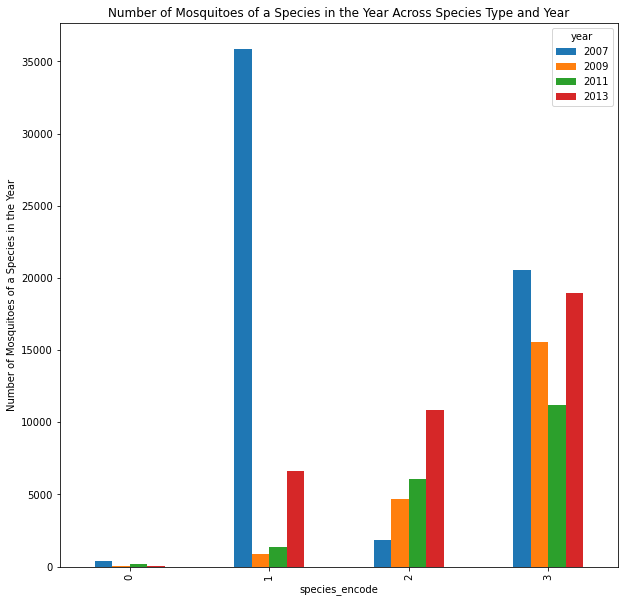

nummosquitos
year species_encode              
2007 0                        405
     1                      35871
     2                       1847
     3                      20565
2009 0                         53
     1                        867
     2                       4657
     3                      15531
2011 0                        189
     1                       1336
     2                       6068
     3                      11206
2013 0                         22
     1                       6597
     2                      10859
     3                      18966

In [14]:
# Display a dataframe containing Plot Number of Mosquitoes of a Species in the Year Across Species Type and Year
# Across Species Type and Year
viz1 = train1[['year','species_encode', 'nummosquitos']].groupby(by=['year','species_encode']).sum()

# Visualise Number of Mosquitoes of a Species in the Year Across Species Type and Year Across Species Type and Year
viz1.unstack(level = 0)['nummosquitos'].plot(kind='bar', figsize = (10,10))
plt.title('Number of Mosquitoes of a Species in the Year Across Species Type and Year')
plt.ylabel('Number of Mosquitoes of a Species in the Year')
plt.show()

# Display viz1 dataframe
display(viz1)

In [15]:
train1[['species', 'wnvpresent']].value_counts()

species                 wnvpresent
CULEX PIPIENS/RESTUANS  0             3674
CULEX RESTUANS          0             2361
CULEX PIPIENS           0             1812
CULEX PIPIENS/RESTUANS  1              225
CULEX TERRITANS         0              216
CULEX PIPIENS           1              184
CULEX SALINARIUS        0               83
CULEX RESTUANS          1               48
CULEX TARSALIS          0                6
CULEX ERRATICUS         0                1
dtype: int64

From the graph of Number of Mosquitoes of a Species in the Year Across Species Type and Year Across Species Type and Year:

1.  Species CULEX ERRATICUS, CULEX SALINARIUS, CULEX TARSALIS, CULEX TERRITANS (mosquito species that did not carry the West Nile Virus and has Species_Encode 0)
*   There is generally a low total number of all these 4 species in each of the years (years 2007, 2009, 2011 and 2013). 
*   The average total number of these 4 species in 1 year (averaging over years 2007, 2009, 2011 and 2013) is 167.
*   The total number of these 4 species in each year ranged from 22 to 405 in each year (years 2007, 2009, 2011 and 2013). 



2.   CULEX PIPIENS (mosquito species that can carry the West Nile Virus and has Species_Encode 1)
*   The total number of CULEX PIPIENS mosquitoes in all 4 years (years 2007, 2009, 2011 and 2013) was 44671
*   The average total number of CULEX PIPIENS mosquitoes in 1 year (averaging over years 2007, 2009, 2011 and 2013) is 11168.
*   The total number of these 4 species in each year ranged from 867 to 35871 in each year (years 2007, 2009, 2011 and 2013). 


3.   CULEX RESTUANS (mosquito species that can carry the West Nile Virus and has Species_Encode 2)
*   The total number of CULEX RESTUANS mosquitoes in all 4 years (years 2007, 2009, 2011 and 2013) was 23431
*   The average total number of CULEX RESTUANS mosquitoes in 1 year (averaging over years 2007, 2009, 2011 and 2013) is 5858.
*   The total number of of CULEX RESTUANS mosquitoes in each year (averaging over years 2007, 2009, 2011 and 2013) ranged from 1847 to 10859 in one year.

4.   CULEX PIPIENS/RESTUANS (mosquito species that can carry the West Nile Virus and has Species_Encode 3)
*   The total number of CULEX PIPIENS/RESTUANS mosquitoes in all 4 years (years 2007, 2009, 2011 and 2013) was 66268
*   The average total number of CULEX PIPIENS/RESTUANS mosquitoes in 1 year (averaging over years 2007, 2009, 2011 and 2013) is 16567.
*   The total number of of CULEX PIPIENS/RESTUANS mosquitoes in each year (averaging over years 2007, 2009, 2011 and 2013) ranged from 11206 to 20565 in one year.

<div id="nummosquitosyearmths"></div>

### Visualise Number of Mosquitoes from Species that Carry and do not Carry WNV across Year-Month

Species that do not carry the WNV (species_encode = 0): 
- CULEX ERRATICUS
- CULEX SALINARIUS
- CULEX TARSALIS
- CULEX TERRITANS

Species that can carry the WNV (species_encode >= 0):
- CULEX PIPIENS (species_encode = 1 )
- CULEC RESTUANS (species_encode = 2 )
- CULEX PIPIENS/RESTUANS (species_encode = 3 )


In [16]:
# Create a column year_month in train and weather dataframe containing year and month
train1['year_month'] = (train1['date'].dt.strftime('%Y-%m'))
weather1['year_month'] = (weather1['date'].dt.strftime('%Y-%m'))

# Check if there is data for mosquitoes species that carry and do not carry the WNV for all 
# year-months 
display(train1[train1['species_encode']==0]['year_month'].unique())
display(train1[train1['species_encode']!=0]['year_month'].unique())

array(['2007-06', '2007-07', '2007-08', '2007-09', '2007-10', '2009-06',
       '2009-07', '2009-08', '2009-09', '2009-10', '2011-06', '2011-07',
       '2011-08', '2011-09', '2013-06', '2013-07', '2013-08', '2013-09'],
      dtype=object)

array(['2007-05', '2007-06', '2007-07', '2007-08', '2007-09', '2007-10',
       '2009-05', '2009-06', '2009-07', '2009-08', '2009-09', '2009-10',
       '2011-06', '2011-07', '2011-08', '2011-09', '2013-06', '2013-07',
       '2013-08', '2013-09'], dtype=object)

For May 2007 and May 2009, there is data on the number of mosquitoes from species that carry the west nile virus, but not on the number of mosquitoes from species that do not carry the West Nile Virus.

In [17]:
# Append one row to show there are no mosquitoes from species that do not carry the West Nile Virus in May 2007 and
# another row to show there are no mosquitoes from species that do not carry the West Nile Virus in May 2009

# Create a dataframe containing the rows to be added
may20072009 = pd.DataFrame({'year_month': pd.to_datetime(pd.Series(['20070501', '20090501'])),
                            'year': [2007, 2009],
                            'month': [5, 5],
                            'nummosquitos': [0, 0]})
may20072009['year_month'] = (may20072009['year_month'].dt.strftime('%Y-%m'))
may20072009

# Create dataframe viz2 to contain the number of mosquitoes from species that do not carry the West Nile Virus
# and year month
# Create dataframe viz3 to contain the number of mosquitoes from species that carry the West Nile Virus
# and year month
viz2 = train1.loc[train1['species_encode']==0][['year_month', 'year', 'month', 'nummosquitos']]
viz3 = train1.loc[train1['species_encode']!=0][['year_month', 'year', 'month', 'nummosquitos']]

# Concatenate dataframe viz2 and may20072009
viz2 = pd.concat([viz2, may20072009])
viz2 = viz2.reset_index()


# Display the number of mosquitoes from species that do not carry the West Nile Virus across year month
viz4 = viz2.groupby('year_month')['year_month', 'nummosquitos'].sum()
display(viz4)
# Display the number of mosquitoes from species that carry the West Nile Virus across year month
viz5 = viz3.groupby('year_month')['year_month', 'nummosquitos'].sum()
display(viz5)

print(f"Average number of mosquitoes from species that do not carry WNV in a month: {round(np.mean(viz4['nummosquitos']))}")
print(f"Average number of mosquitoes from species that do not carry WNV in a month: {round(np.mean(viz5['nummosquitos']))}")

,nummosquitos
year_month,
2007-05,0
2007-06,1
2007-07,29
2007-08,292
2007-09,61
2007-10,22
2009-05,0
2009-06,13
2009-07,23


,nummosquitos
year_month,
2007-05,40
2007-06,427
2007-07,7170
2007-08,39723
2007-09,9239
2007-10,1684
2009-05,190
2009-06,7377
2009-07,8810


Average number of mosquitoes from species that do not carry WNV in a month: 33
Average number of mosquitoes from species that do not carry WNV in a month: 6718


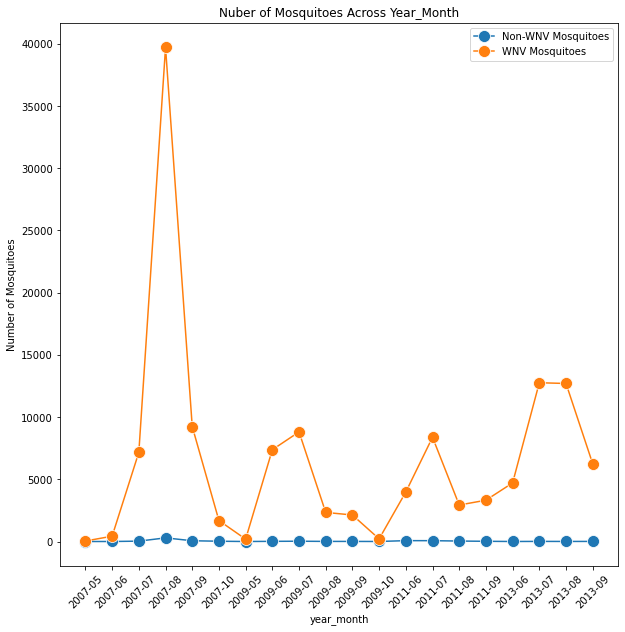

In [18]:
# Visualise Number of Mosquitoes from Species Carrying the West Nile Virus and
# Number of Mosquitoes from Species not Carrying the West Nile Virus across Year-Month
# in a same graph
plt.figure(figsize=(10,10))
sns.lineplot(data = viz4, x = 'year_month', y = 'nummosquitos', marker='o', markersize=12, label = 'Non-WNV Mosquitoes')
sns.lineplot(data = viz5, x = 'year_month', y = 'nummosquitos', marker='o', markersize=12, label = 'WNV Mosquitoes')
plt.title('Nuber of Mosquitoes Across Year_Month')
plt.xlabel('year_month')
plt.ylabel('Number of Mosquitoes')
plt.legend()
plt.xticks(rotation=45)
plt.show()

As the number of mosquitoes from species not carrying the WNV are much lower than those that carry the WNV (as seen in the above graph), we will plot the number of mosquitoes from species not carrying the WNV and those that carry the WNV in 2 separate subplots for better visualisation of fluctuations.

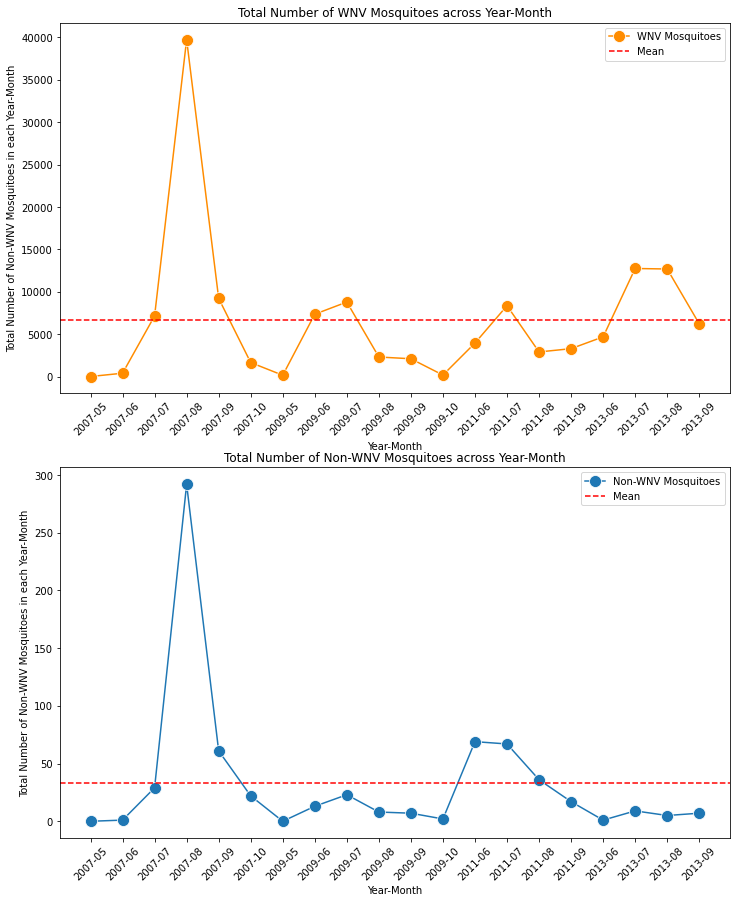

In [19]:
# Visualise Number of Mosquitoes from Species Carrying the West Nile Virus and
# Number of Mosquitoes from Species not Carrying the West Nile Virus across Year-Month
# in two separate subplots to better visualise the fluctuations
plt.figure(figsize = (12, 15))
ax0 = plt.subplot(2, 1, 1)
sns.lineplot(data = viz5, x = 'year_month', y = 'nummosquitos', marker='o', markersize=12, label = 'WNV Mosquitoes', 
             color = 'darkorange')
plt.axhline(y = np.mean(viz5['nummosquitos']), color = 'r', linestyle = '--', label = 'Mean')
plt.title('Total Number of WNV Mosquitoes across Year-Month')
plt.legend()
ax0.set_ylabel('Total Number of Non-WNV Mosquitoes in each Year-Month')
ax0.set_xlabel('Year-Month')
plt.xticks(rotation=45)

ax1 = plt.subplot(2, 1, 2)
sns.lineplot(data = viz4, x = 'year_month', y = 'nummosquitos', marker='o', markersize=12, label = 'Non-WNV Mosquitoes')
plt.axhline(y = np.mean(viz4['nummosquitos']), color = 'r', linestyle = '--', label = 'Mean')
plt.title('Total Number of Non-WNV Mosquitoes across Year-Month')
plt.legend()
ax1.set_ylabel('Total Number of Non-WNV Mosquitoes in each Year-Month')
ax1.set_xlabel('Year-Month')
plt.xticks(rotation=45)

plt.show()

From individual subplots and table output above:
*   The number of WNV mosquitoes in each Year-Month is generally always higher than that of non-WNV mosquitoes.
*   The mean number of WNV mosquitoes in a month is 6719 while the mean number of Non-WNV mosquitoes in a month is 33.
*   The number of WNV mosquitoes in each Year-Month ranges from 0 (in May 2007 and May 2009) to 292 (in Aug 2007).
*   The number of non-WNV mosquitoes in each Year-Month ranges from 40 (in May 2007) to 39723 (in Aug 2007).
*   The number of non-WNV mosquitoes and WNV mosquitoes generally increases in May/June, reaches the highest in July/August and remains at the highest for one to two months. After August, the number of non-WNV mosquitoes and WNV mosquitoes decreases until it plateaus in September/October.


<div id="nummosquitoswnvyear"></div>

### Visualise Number of Mosquitoes from Species that Carry and do not Carry WNV across Year

Visualise Number of Mosquitoes from Species that Carry and do not Carry WNV across Year, to see if there is any trend across years.

In [20]:
# Display the number of mosquitoes from species that do not carry the West Nile Virus across year 
viz6 = pd.DataFrame(viz2.groupby('year')['nummosquitos'].sum())
viz6 = viz6.reset_index()

# Display the number of mosquitoes from species that carry the West Nile Virus across year 
viz7 =  pd.DataFrame(viz3.groupby('year')['nummosquitos'].sum())
viz7 = viz7.reset_index()

# Display the number of mosquitoes from all species across year 
viz8 =  pd.DataFrame(train1.groupby('year')['nummosquitos'].sum())
viz8 = viz8.reset_index()

print("number of mosquitoes from all species across year:")
display(viz8) 
print("number of mosquitoes from species that can carry the West Nile Virus across year:")
display(viz7) 
print("number of mosquitoes from species that do not carry the West Nile Virus across year:")
display(viz6) 

number of mosquitoes from all species across year:


,year,nummosquitos
0,2007,58688
1,2009,21108
2,2011,18799
3,2013,36444


number of mosquitoes from species that can carry the West Nile Virus across year:


,year,nummosquitos
0,2007,58283
1,2009,21055
2,2011,18610
3,2013,36422


number of mosquitoes from species that do not carry the West Nile Virus across year:


,year,nummosquitos
0,2007,405
1,2009,53
2,2011,189
3,2013,22


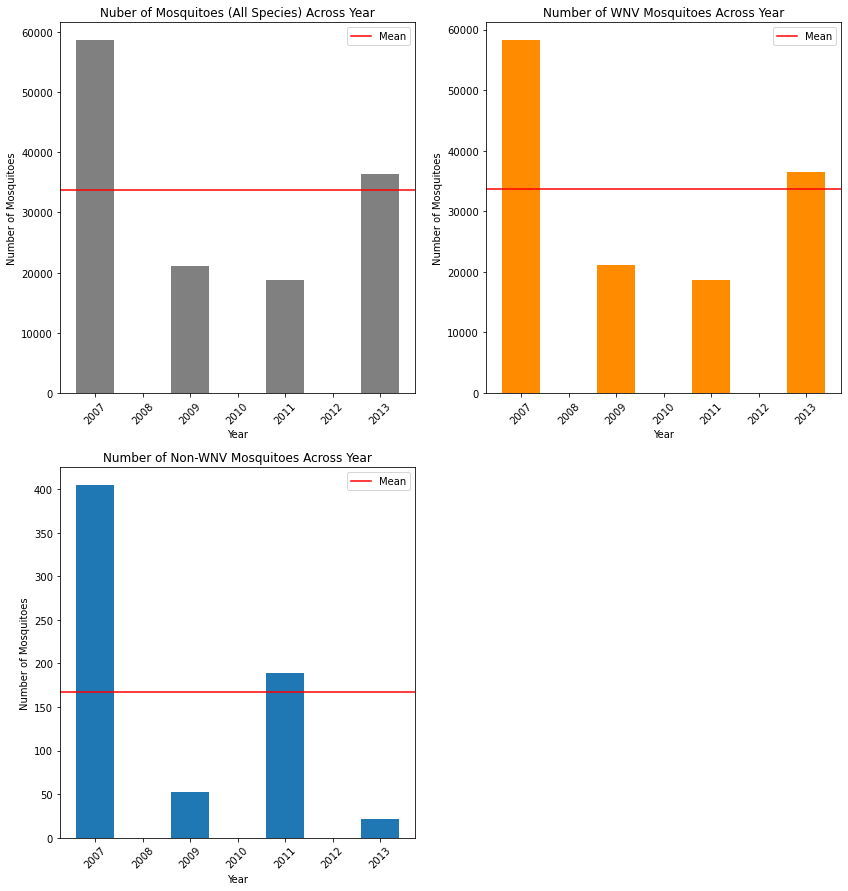

In [21]:
# Visualise Number of Mosquitoes from Species Carrying the West Nile Virus and
# Number of Mosquitoes from Species not Carrying the West Nile Virus across Year
# in a same graph
plt.figure(figsize=(14,15))
# 1st subplot: number of mosquitoes from all species across year:
ax0 = plt.subplot(2, 2, 1)
plt.bar(viz8['year'], viz8['nummosquitos'], color = 'grey')
plt.axhline(y = np.mean(viz8['nummosquitos']), color = 'r', linestyle = '-', label = 'Mean')
plt.title('Nuber of Mosquitoes (All Species) Across Year')
plt.xlabel('Year')
plt.ylabel('Number of Mosquitoes')
plt.legend()
plt.xticks(rotation=45)

# 2nd subplot: number of mosquitoes from species that can carry the West Nile Virus across year
ax1 = plt.subplot(2, 2, 2)
plt.bar(viz7['year'], viz7['nummosquitos'], color = 'darkorange')
plt.axhline(y = np.mean(viz7['nummosquitos']), color = 'r', linestyle = '-', label = 'Mean')
plt.title('Number of WNV Mosquitoes Across Year')
plt.xlabel('Year')
plt.ylabel('Number of Mosquitoes')
plt.legend()
plt.xticks(rotation=45)

# 3rd subplot: number of mosquitoes from species that do not carry the West Nile Virus across year
ax2 = plt.subplot(2, 2, 3)
plt.bar(viz6['year'], viz6['nummosquitos'])
plt.axhline(y = np.mean(viz6['nummosquitos']), color = 'r', linestyle = '-', label = 'Mean')
plt.title('Number of Non-WNV Mosquitoes Across Year')
plt.xlabel('Year')
plt.ylabel('Number of Mosquitoes')
plt.legend()
plt.xticks(rotation=45)
plt.show()

From the bar chart of Number of Mosquitoes (Species that do not carry WNV) in each Year:
- Total number of mosquitoes in species not carrying WNV in a year (in ascending order): Year 2013	(22 mosquitoes), year 2009 (53 mosquitoes), year 2011 (189 mosquitoes), year 2007 (405 mosquitoes)
- Total number of mosquitoes in species not carrying WNV in a year was the highest in year 2007 (405 mosquitoes), dropped in 2009 (53 mosquitoes), and rose in year 2011 (189 mosquitoes) and in Year 2013 (22 mosquitoes). 

From the bar chart of Number of Mosquitoes (Species that can carry WNV) in each Year:
- Total number of mosquitoes in species carrying WNV in a year (in ascending order): Year 2011	(18610 mosquitoes), year 2009 (21055 mosquitoes), year 2013 (36422 mosquitoes), year 2007 (58283 mosquitoes)
- Total number of mosquitoes in species carrying WNV in a year was the highest in year 2007 (58283 mosquitoes), drop in 2009 (21055 mosquitoes), and dropped further in year 2011 (18610 mosquitoes) but increased in  year 2013 (36422 mosquitoes)

From the bar chart of Number of Mosquitoes (All Species) in each Year:
- Total number of mosquitoes in all species in a year (in ascending order): Year 2011 (18799 mosquitoes), year 2009 (21108 mosquitoes), year 2013 (36444 mosquitoes), year 2007 (58688 mosquitoes)
- Total number of mosquitoes in all species in a year was the highest in year 2007 (58688 mosquitoes), drop in 2009 (21108 mosquitoes), and dropped further in year 2011 (18799 mosquitoes) but increased in  year 2013 (36444 mosquitoes)

<div id="nummosquitoswnvmth"></div>

### Visualise Number of Mosquitoes from Species that Carry and do not Carry WNV across Month

In [22]:
# Display the number of mosquitoes from species that do not carry WNV across month
viz9 = pd.DataFrame(viz2.groupby('month')['nummosquitos'].sum())
viz9 = viz9.reset_index()

# Display the number of mosquitoes from species that carry WNV across month 
viz10 =  pd.DataFrame(viz3.groupby('month')['nummosquitos'].sum())
viz10 = viz10.reset_index()

# Display the number of mosquitoes from all species across month
viz11 =  pd.DataFrame(train1.groupby('month')['nummosquitos'].sum())
viz11 = viz11.reset_index()

print("number of mosquitoes from all species across month:")
display(viz11) 
print("number of mosquitoes from species that can carry the West Nile Virus across month:")
display(viz10) 
print("number of mosquitoes from species that do not carry the West Nile Virus across month:")
display(viz9) 

number of mosquitoes from all species across month:


,month,nummosquitos
0,5,230
1,6,16578
2,7,37248
3,8,58036
4,9,21029
5,10,1918


number of mosquitoes from species that can carry the West Nile Virus across month:


,month,nummosquitos
0,5,230
1,6,16494
2,7,37120
3,8,57695
4,9,20937
5,10,1894


number of mosquitoes from species that do not carry the West Nile Virus across month:


,month,nummosquitos
0,5,0
1,6,84
2,7,128
3,8,341
4,9,92
5,10,24


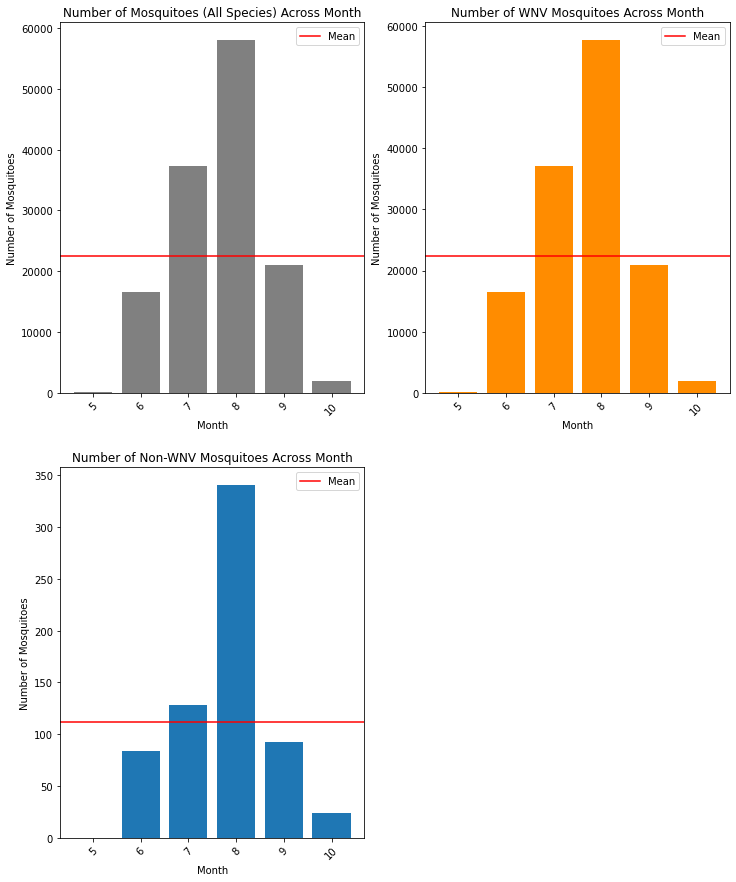

In [23]:
# Visualise Number of Mosquitoes from Species Carrying the West Nile Virus and
# Number of Mosquitoes from Species not Carrying the West Nile Virus across month
# in a same graph
plt.figure(figsize=(12,15))
# Visualise the number of mosquitoes from all species across month
ax0 = plt.subplot(2, 2, 1)
plt.bar(viz11['month'], viz11['nummosquitos'], color = 'grey')
plt.axhline(y = np.mean(viz11['nummosquitos']), color = 'r', linestyle = '-', label = 'Mean')
plt.title('Number of Mosquitoes (All Species) Across Month')
plt.xlabel('Month')
plt.ylabel('Number of Mosquitoes')
plt.legend()
plt.xticks(rotation=45)

# Visualise the number of mosquitoes from species that can carry WNV across month
ax1 = plt.subplot(2, 2, 2)
plt.bar(viz10['month'], viz10['nummosquitos'], color = 'darkorange')
plt.axhline(y = np.mean(viz10['nummosquitos']), color = 'r', linestyle = '-', label = 'Mean')
plt.title('Number of WNV Mosquitoes Across Month')
plt.xlabel('Month')
plt.ylabel('Number of Mosquitoes')
plt.legend()
plt.xticks(rotation=45)

# Visualise the number of mosquitoes from species that do not carry WNV across month
ax2 = plt.subplot(2, 2, 3)
plt.bar(viz9['month'], viz9['nummosquitos'])
plt.axhline(y = np.mean(viz9['nummosquitos']), color = 'r', linestyle = '-', label = 'Mean')
plt.title('Number of Non-WNV Mosquitoes Across Month')
plt.xlabel('Month')
plt.ylabel('Number of Mosquitoes')
plt.legend()
plt.xticks(rotation=45)
plt.show()

From the bar chart of Number of Mosquitoes (Species that do not carry WNV) in each Month:
- Total number of mosquitoes in all  species in a month (in ascending order): May (0 mosquitoes), October (24 mosquitoes), June (84 mosquitoes), September (92 mosquitoes),July (128 mosquitoes), August (341 mosquitoes).
- Total number of mosquitoes in all species in a month increased from May (0 mosquitoes) to August (341 mosquitoes), and dropped from September (92 mosquitoes) and October (24 mosquitoes).

From the bar chart of Number of Mosquitoes (Species that can carry WNV) in each Month:
- Total number of mosquitoes in all  species in a month (in ascending order): May (230 mosquitoes), October (1894 mosquitoes), June (16494 mosquitoes), September (20937 mosquitoes),July (37120 mosquitoes), August (57695 mosquitoes).
- Total number of mosquitoes in all species in a month increased from May (230 mosquitoes) to August (57695 mosquitoes), and dropped from September (20937 mosquitoes) and October (1894 mosquitoes).

From the bar chart of Number of Mosquitoes (All Species) in each Month:
- Total number of mosquitoes in all  species in a month (in ascending order): May (230 mosquitoes), October (1918 mosquitoes), June (16578 mosquitoes), September (21029 mosquitoes),July (37248 mosquitoes), August (58036 mosquitoes).
- Total number of mosquitoes in all species in a month increased from May (230 mosquitoes) to August (58036 mosquitoes), and dropped from September (21029 mosquitoes) and October (1918 mosquitoes).

For all species/species that carry WNV/species that do not carry WNV, there is the same trend in number of mosquitoes across months:
- The number of mosquitoes generally increases in May, reaches high levels in July and remains high for one to two months. After August, the number of mosquitoes decreases.

<div id="nummosquitoswnvday"></div>

### Visualise Number of Mosquitoes from Species that Carry and do not Carry WNV across Day of Month

In [24]:
# Check if there is data for mosquitoes species that carry and do not carry the WNV for all 
# days of month 
display(train1[train1['species_encode']==0]['dayofmonth'].unique())
display(train1[train1['species_encode']!=0]['dayofmonth'].unique())

array([26,  2, 11, 18, 19, 25,  1,  7,  9, 15, 17, 21, 22, 24, 28,  4,  5,
        6, 12, 10, 13, 27, 31,  3, 30, 29, 16, 23,  8], dtype=int64)

array([29,  5, 26,  2, 11, 18, 19, 25, 27,  1,  3,  7,  8,  9, 15, 16, 17,
       21, 22, 24, 28,  4,  6, 12, 10, 13, 31, 14, 30, 23], dtype=int64)

For day 14, there is data on the number of mosquitoes from species that carry the west nile virus, but not on the number of mosquitoes from species that do not carry the WNV.

For day 20, there is no data on both the number of mosquitoes from species that carry the west nile virus, and the number of mosquitoes from species that do not carry the WNV.

In [25]:
# Create dataframe viz12 to contain the number of mosquitoes from species that do not carry the West Nile Virus
# and day of month
# Create dataframe viz13 to contain the number of mosquitoes from species that carry the West Nile Virus
# and day of month
viz12 = train1.loc[train1['species_encode']==0][['dayofmonth', 'nummosquitos']]
viz13 = train1.loc[train1['species_encode']!=0][['dayofmonth', 'nummosquitos']]

# Create a dataframe containing the rows to be added to viz12
day1420 = pd.DataFrame({'dayofmonth': [14, 20],
                      'nummosquitos': [0, 0]})
# Create a dataframe containing the rows to be added to viz13
day20 = pd.DataFrame({'dayofmonth': 20,
                      'nummosquitos': [0]})

# Concatenate dataframe viz12 and day1420
viz12 = pd.concat([viz12, day1420])
viz12 = viz12.reset_index()

# Concatenate dataframe viz13 and day20
viz13 = pd.concat([viz13, day20])
viz13 = viz13.reset_index()

# Display the number of mosquitoes from species that do not carry the West Nile Virus across day of month
viz14 = pd.DataFrame(viz12.groupby('dayofmonth')['nummosquitos'].sum())
viz14 = viz14.reset_index()

# Display the number of mosquitoes from species that carry the West Nile Virus across day of month
viz15 =  pd.DataFrame(viz13.groupby('dayofmonth')['nummosquitos'].sum())
viz15 = viz15.reset_index()

# Display the number of mosquitoes from all species across day of month
viz16 = pd.DataFrame(train1.groupby('dayofmonth')['nummosquitos'].sum())
viz16 = viz16.reset_index()

print("number of mosquitoes from all species across day of month:")
display(viz16.sort_values(by = 'nummosquitos', ascending = False)) 
print("number of mosquitoes from species that can carry the West Nile Virus across day of month:")
display(viz15.sort_values(by = 'nummosquitos', ascending = False)) 
print("number of mosquitoes from species that do not carry the West Nile Virus across day of month:")
display(viz14.sort_values(by = 'nummosquitos', ascending = False)) 

number of mosquitoes from all species across day of month:


,dayofmonth,nummosquitos
11,12,10961
0,1,10300
23,25,10218
14,15,9449
7,8,9207
18,19,8931
20,22,8746
26,28,5861
16,17,5381
15,16,5376


number of mosquitoes from species that can carry the West Nile Virus across day of month:


,dayofmonth,nummosquitos
11,12,10935
0,1,10265
24,25,10188
14,15,9421
7,8,9206
18,19,8895
21,22,8728
27,28,5851
15,16,5371
16,17,5299


number of mosquitoes from species that do not carry the West Nile Virus across day of month:


,dayofmonth,nummosquitos
1,2,119
16,17,82
8,9,42
10,11,38
18,19,36
0,1,35
24,25,30
23,24,29
14,15,28
3,4,27


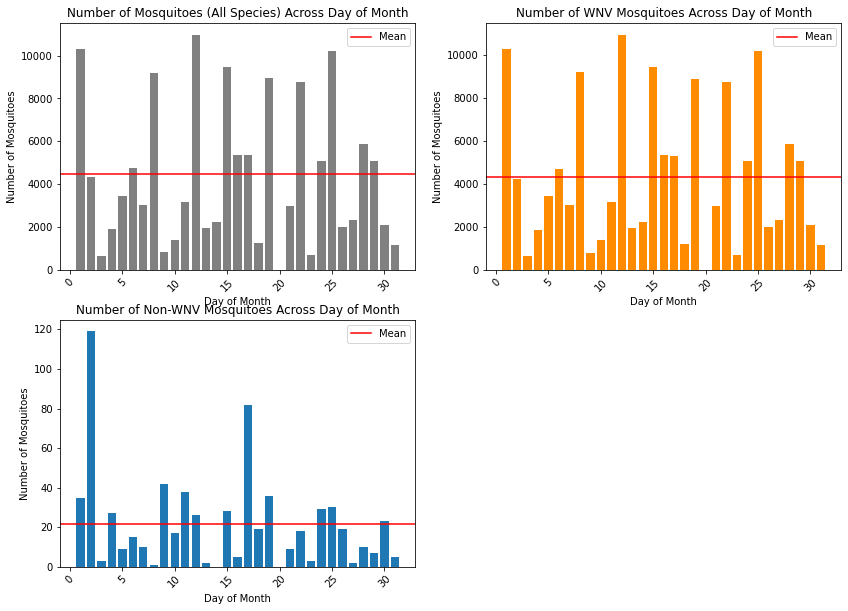

In [26]:
# Visualise Number of Mosquitoes from Species Carrying the West Nile Virus and
# Number of Mosquitoes from Species not Carrying the West Nile Virus across dayofmonth
# in a same graph
plt.figure(figsize=(14,10))

# Visualise the number of mosquitoes from all species across day of month
ax0 = plt.subplot(2, 2, 1)
plt.bar(viz16['dayofmonth'], viz16['nummosquitos'], color = 'grey')
plt.axhline(y = np.mean(viz16['nummosquitos']), color = 'r', linestyle = '-', label = 'Mean')
plt.title('Number of Mosquitoes (All Species) Across Day of Month')
plt.xlabel('Day of Month')
plt.ylabel('Number of Mosquitoes')
plt.legend()
plt.xticks(rotation=45)

# Visualise the number of mosquitoes from species that can carry WNV across day of month
ax1 = plt.subplot(2, 2, 2)
plt.bar(viz15['dayofmonth'], viz15['nummosquitos'], color = 'darkorange')
plt.axhline(y = np.mean(viz15['nummosquitos']), color = 'r', linestyle = '-', label = 'Mean')
plt.title('Number of WNV Mosquitoes Across Day of Month')
plt.xlabel('Day of Month')
plt.ylabel('Number of Mosquitoes')
plt.legend()
plt.xticks(rotation=45)

# Visualise the number of mosquitoes from species that do not carry WNV across day of month
ax2 = plt.subplot(2, 2, 3)
plt.bar(viz14['dayofmonth'], viz14['nummosquitos'])
plt.axhline(y = np.mean(viz14['nummosquitos']), color = 'r', linestyle = '-', label = 'Mean')
plt.title('Number of Non-WNV Mosquitoes Across Day of Month')
plt.xlabel('Day of Month')
plt.ylabel('Number of Mosquitoes')
plt.legend()
plt.xticks(rotation=45)
plt.show()

From the bar chart of Number of Mosquitoes (Species that do not carry WNV) in each Day of Month:
- The 3 days of the month with the highest total number of mosquitoes in all species: 2th (119 mosquitoes), 17th (82 mosquitoes) and 9th (42 mosquitoes)
- The 3 days of the month with the lowest total number of mosquitoes in all species: 8th (1 mosquito), 20th (0 mosquitoes) and 14th (0 mosquitoes)

From the bar chart of Number of Mosquitoes (Species that can carry WNV) in each Day of Month:
- The 3 days of the month with the highest total number of mosquitoes in all species: 12th (10935 mosquitoes), 1st (10265 mosquitoes) and 25th (10188 mosquitoes)
- The 3 days of the month with the lowest total number of mosquitoes in all species: 23rd (725 mosquitoes), 3rd (678 mosquitoes) and 20th (0 mosquitoes)

From the bar chart of Number of Mosquitoes (All Species) in each Day of Month:
- The 3 days of the month with the highest total number of mosquitoes in all species: 12th (10961 mosquitoes), 1st (10300 mosquitoes) and 25th (10218 mosquitoes)
- The 3 days of the month with the lowest total number of mosquitoes in all species: 9th (840 mosquitoes), 23rd (728 mosquitoes) and 3rd (681 mosquitoes)

<div id="wnvweather"></div>

### Visualise Weather Parameters and Number of WNV Mosquitoes in Each Year at Each Station

Visualise Weather Parameters and Number of WNV Mosquitoes in Each Year at Each Station. We will be focusing on the number of mosquitos of species that can carry the WNV as we want to see if weather parameters can affect the absence/presence of WNV.

The green lineplots represent the number of mosquitoes (from species that can carry the WNV) across a year/years. The blue lineplots represent the weather parameter value across a year/years. The green axis applies to the green lineplots while the blue axis applies to the blue lineplots.

#### Visualise Daily Average Temperature and Number of WNV Mosquitoes in Each Year at Each Station


We will be plotting daily average temperature (tavg) only out of all other temperature features as tavg is the average of daily minimum temperature (tmin) and daily maximum temperature (tmax).

In [27]:
# Define a function to plot weather parameters and number of WNV mosquitoes across months of each year
# at each station
# 4 subplots on the left shows weather parameters and number of WNV mosquitoes across each year (year 2007,
# 2009, 2011, 2013) at station 1 
# 4 subplots on the right shows weather parameters and number of WNV mosquitoes across each year (year 2007,
# 2009, 2011, 2013) at station 2

def weatherplot(feature, years, subplotrow, subplotcolumn):
    subplotno = 1
    for year in years:
        viz4_station1 = train1[((train1['species_encode']!=0) & (train1['station']==1) & 
                            (train1['year']==year))].groupby(['date', 'station'])['date', 'nummosquitos'].sum()
        viz5_station1 = weather1[((weather1['date'].dt.year==year) & (weather1['station']==1))]
        # ax1 = ax0.twinx()
        plt.figure(figsize = (12,12))
        ax0 = plt.subplot(subplotrow, subplotcolumn,subplotno)
        ax1 = ax0.twinx()
        
        sns.lineplot(data = viz4_station1, x = 'date', y = 'nummosquitos', markersize=12, 
                     label = 'Daily WNV Mosquitoes at Station 1', ax = ax0, color = 'green', legend = False)
        sns.lineplot(data = viz5_station1, x = 'date', y = feature, 
                     label = 'Daily {} at Station 1'.format(feature), ci = False, ax = ax1, color = 'blue',  legend = False)

        ax0.set_ylabel('Daily WNV Mosquitoes at Station 1', color='green')
        ax1.set_ylabel('Daily {} at station 1'.format(feature), color='blue')
        plt.title('Daily {} and Number of Mosquitoes at station 1 in Year {}'.format(feature, year))
        
        subplotno = subplotno + 1
        viz4_station2 = train1[((train1['species_encode']!=0) & (train1['station']==2) & 
                                (train1['year']==year))].groupby(['date', 'station'])['date', 'nummosquitos'].sum()
        viz5_station2 = weather1[((weather1['date'].dt.year==year) & (weather1['station']==2))]
        # ax1 = ax0.twinx()
        ax0 = plt.subplot(subplotrow, subplotcolumn, subplotno)
        ax1 = ax0.twinx()
        
        sns.lineplot(data = viz4_station2, x = 'date', y = 'nummosquitos', markersize=12, 
                     label = 'Daily WNV Mosquitoes at Station 2', ax = ax0, color = 'green', legend = False)
        sns.lineplot(data = viz5_station2, x = 'date', y = feature, 
                     label = 'Daily {} at Station 2'.format(feature), ci = False, ax = ax1, color = 'blue',  legend = False)
        ax0.set_ylabel('Daily WNV Mosquitoes at Station 2', color='green')
        ax1.set_ylabel('Daily {} at station 2'.format(feature), color='blue')
        plt.title('Daily {} and Number of Mosquitoes at station 2 in Year {}'.format(feature, year))

        subplotno = subplotno + 1
        plt.tight_layout()
        plt.show()

In [28]:
# define function to display summary statistics of a weather feature over all days across years:
# (1) 4 years (2007, 2009, 2011. 2013)
# (2) year 2007
# (3) year 2009
# (4) year 2011
# (5) year 2013

# extract weather values based on a year
# within the one year, find all daily weather values based on the month column
# then find the count, min, median, max, mean of the weather values in each month 
def sumstatweather(weather):
    weat = weather
    print(f"Summary statistics of {weat} across month over 4 years (2007, 2009, 2011, 2013)")
    print(train1.groupby('month')[weather].agg(['count','min', 'median', 'max', 'mean']))
    print(f"Summary statistics of {weat} across month in year 2007")
    print(train1[train1['year'] == 2007].groupby('month')[weather].agg(['count','min', 'median', 'max', 'mean']))
    print(f"Summary statistics of {weat} across month in year 2009")
    print(train1[train1['year'] == 2009].groupby('month')[weather].agg(['count','min', 'median', 'max', 'mean']))
    print(f"Summary statistics of {weat} across month in year 2011")
    print(train1[train1['year'] == 2011].groupby('month')[weather].agg(['count','min', 'median', 'max', 'mean']))
    print(f"Summary statistics of {weat} across month in year 2013")
    print(train1[train1['year'] == 2013].groupby('month')[weather].agg(['count','min', 'median', 'max', 'mean']))

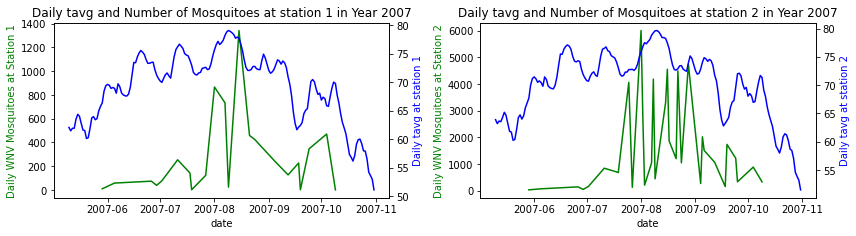

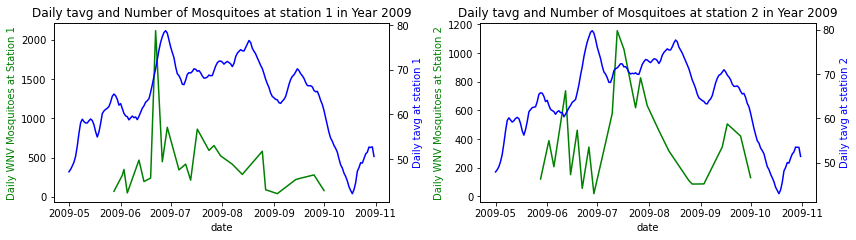

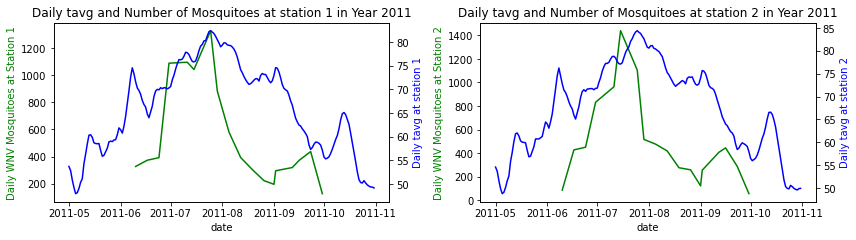

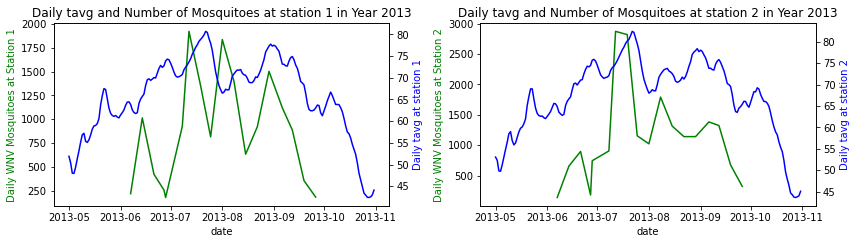

In [29]:
# Plot Daily Temperature Average and Number of West Nile Mosquitoes in years 2007, 2009, 2011 and 2013 at stations 1 & 2
weatherplot('tavg', [2007,2009, 2011, 2013], 4, 2)

In [30]:
# Display summary statistics of tavg across month across year 
sumstatweather('tavg')

Summary statistics of tavg across month over 4 years (2007, 2009, 2011, 2013)
       count    min  median    max       mean
month                                        
5         81  64.55   65.75  67.70  66.012963
6       1337  59.45   69.90  79.20  68.552468
7       2120  67.65   74.10  84.40  75.174858
8       2835  66.45   73.45  80.40  74.263704
9       1973  57.15   69.55  75.85  68.342524
10       264  60.85   66.95  71.35  65.671591
Summary statistics of tavg across month in year 2007
       count    min  median    max       mean
month                                        
5         25  66.35   67.70  67.70  67.322000
6        175  68.90   71.85  74.30  71.883714
7        460  69.95   73.85  76.50  73.806304
8       1321  72.05   75.85  79.60  75.774073
9        655  62.10   69.70  74.85  69.087023
10       201  65.85   66.95  71.35  67.117164
Summary statistics of tavg across month in year 2009
       count    min  median    max       mean
month                             

From the summary statistics of Daily Temperature Average in each month,
- Daily Temperature Average increases from May (mean Daily Temperature Average of 66.0) to July (mean Daily Temperature Average of 75.2), remains high in August (mean Daily Temperature Average of 74.3) and decreases from September onwards till October (mean Daily Temperature Average of 65.7)
- Higher Daily Temperature Average occurs in July and August.

From the plots of Daily Temperature Average and number of mosquitoes (species that can carry WNV) in years 2007, 2009, 2011 and 2013 at stations 1 & 2,
- As the daily average temperature increases, the number of WNV mosquitoes tends to increase.
- There tends to be peaks in number of WNV mosquitoes when the daily average temperature peaks, typically in July and August.

#### Visualise Daily DewPoint and Number of WNV Mosquitoes in Each Year at Each Station

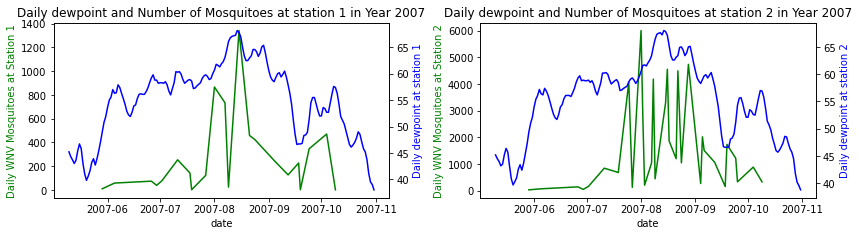

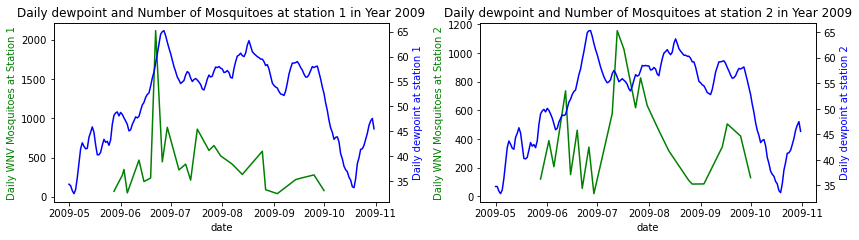

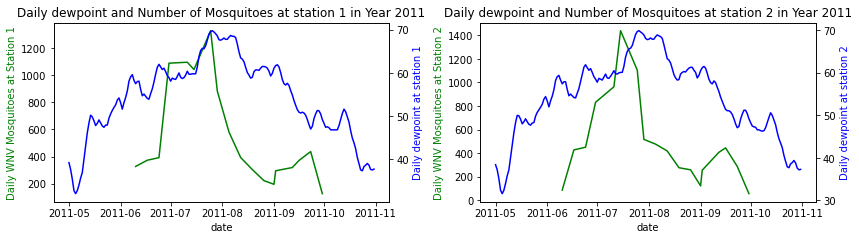

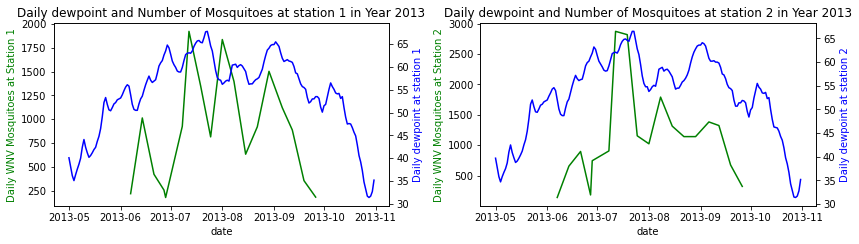

In [31]:
# Plot Daily DewPoint and Number of West Nile Mosquitoes across years 2007 - 2013 at stations 1 & 2
weatherplot('dewpoint', [2007,2009, 2011, 2013], 4, 2)

In [32]:
# Display summary statistics of dewpoint across month of each year
sumstatweather('dewpoint')

Summary statistics of dewpoint across month over 4 years (2007, 2009, 2011, 2013)
       count   min  median   max       mean
month                                      
5         81  48.2    49.0  49.4  48.940741
6       1337  46.4    56.3  65.3  55.899626
7       2120  55.3    59.9  69.7  60.692075
8       2835  53.8    61.5  68.5  61.597672
9       1973  46.6    55.6  61.9  55.092397
10       264  52.6    52.6  57.4  52.979167
Summary statistics of dewpoint across month in year 2007
       count   min  median   max       mean
month                                      
5         25  49.0    49.4  49.4  49.288000
6        175  56.3    58.9  59.3  58.155429
7        460  58.3    59.0  60.3  59.354783
8       1321  60.5    63.4  67.8  63.782513
9        655  46.6    51.3  59.7  53.259695
10       201  52.6    52.6  57.4  53.054229
Summary statistics of dewpoint across month in year 2009
       count   min  median   max       mean
month                                      
5         56



From the summary statistics of daily dewpoint in each month,
- Daily dewpoint increases from May (mean Daily dewpoint of 48.9) to July (mean Daily dewpoint of 60.7), remains high in August (mean Daily dewpoint of 61.6) and decreases from September onwards till October (mean Daily dewpoint of 53.0)
- Higher Daily dewpoint occurs in July and August.

From the plots of daily dewpoint and number of mosquitoes (species that can carry WNV) in years 2007, 2009, 2011 and 2013 at stations 1 & 2,
- As the daily dewpoint increases, the number of WNV mosquitoes tends to increase.
- There tends to be peaks in number of WNV mosquitoes when the daily dewpoint peaks, typically in July and August.


#### Visualise Daily Average Wetbulb and Number of WNV Mosquitoes in Each Year at Each Station

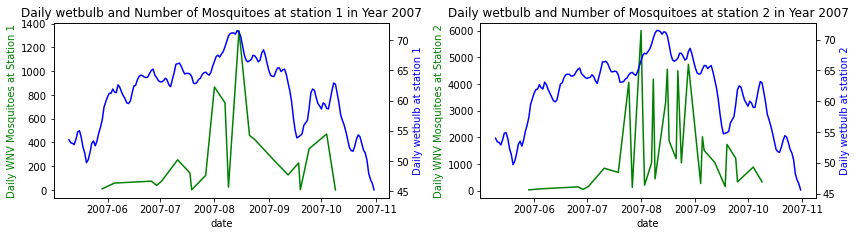

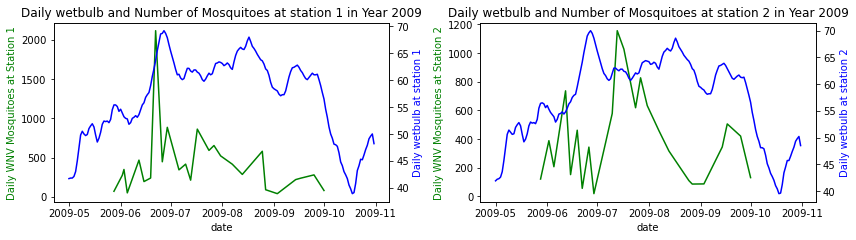

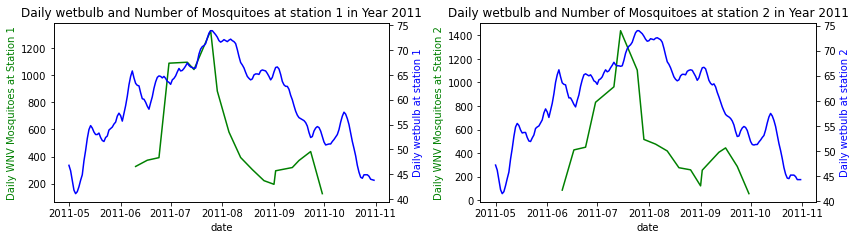

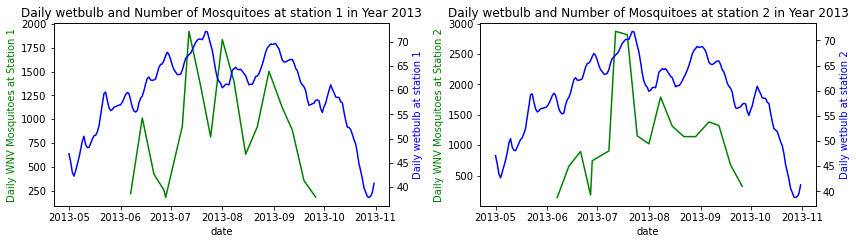

In [33]:
# Plot Daily Average Wetbulb and Number of West Nile Mosquitoes across years 2007 - 2013 at stations 1 & 2
weatherplot('wetbulb', [2007,2009, 2011, 2013], 4, 2)

In [34]:
# Display summary statistics of wetbulb across month of each year
sumstatweather('wetbulb')

Summary statistics of wetbulb across month over 4 years (2007, 2009, 2011, 2013)
       count   min  median   max       mean
month                                      
5         81  55.4    56.4  57.4  56.471605
6       1337  52.8    62.1  69.6  61.102618
7       2120  61.1    66.1  74.0  66.256887
8       2835  59.9    66.6  72.5  66.432063
9       1973  52.4    61.0  66.6  60.722048
10       264  56.5    59.0  63.0  58.667424
Summary statistics of wetbulb across month in year 2007
       count   min  median   max       mean
month                                      
5         25  56.8    57.4  57.4  57.232000
6        175  61.4    64.2  65.2  63.707429
7        460  63.1    64.7  66.4  64.931304
8       1321  66.5    67.5  71.3  68.245042
9        655  54.0    59.5  65.8  60.257405
10       201  58.7    59.0  63.0  59.324876
Summary statistics of wetbulb across month in year 2009
       count   min  median   max       mean
month                                      
5         56  5

From the summary statistics of daily wetbulb in each month,
- Daily wetbulb increases from May (mean daily wetbulb of 56.5) to July (mean daily wetbulb of 66.3), remains high in August (mean daily wetbulb of 66.4) and decreases from September onwards till October (mean daily wetbulb of 58.7)
- Higher daily wetbulb occurs in July and August.

From the plots of daily wetbulb and number of mosquitoes (species that can carry WNV) in years 2007, 2009, 2011 and 2013 at stations 1 & 2,
- As the daily wetbulb increases, the number of WNV mosquitoes tends to increase.
- There tends to be peaks in number of WNV mosquitoes when the daily wetbulb peaks, typically in July and August.


#### Visualise Heating Degree Days and Number of WNV Mosquitoes in Each Year at Each Station

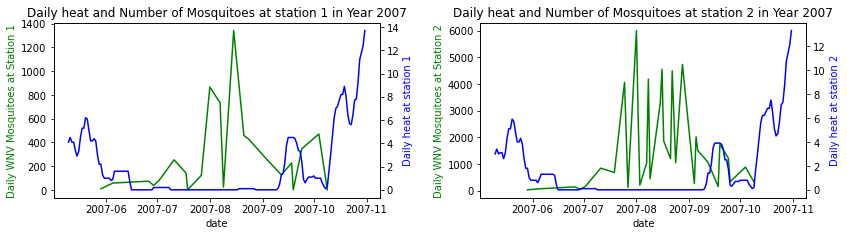

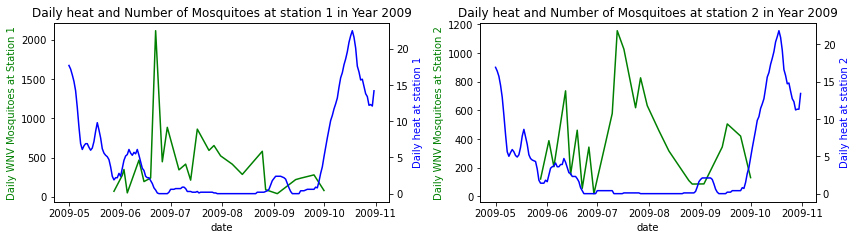

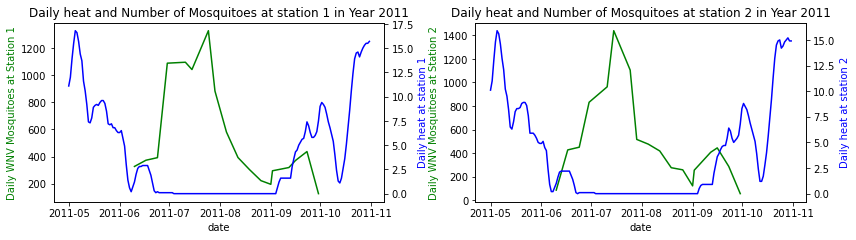

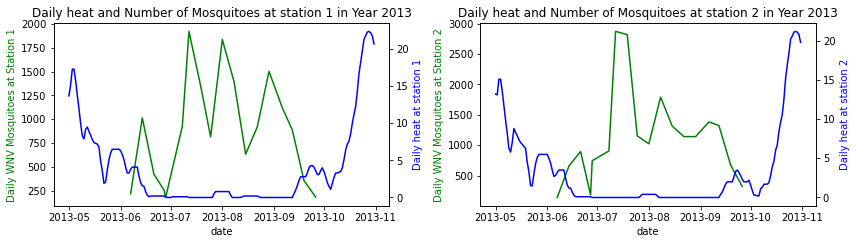

In [35]:
# Plot Heating Degree Days and Number of West Nile Mosquitoes across years 2007 - 2013 at stations 1 & 2
weatherplot('heat', [2007,2009, 2011, 2013], 4, 2)

In [36]:
# Display summary statistics of Heating Degree Days across month of each year
sumstatweather('heat')

Summary statistics of heat across month over 4 years (2007, 2009, 2011, 2013)
       count  min  median  max      mean
month                                   
5         81  1.4     1.4  2.2  1.650617
6       1337  0.0     1.0  5.4  1.459312
7       2120  0.0     0.0  0.7  0.067877
8       2835  0.0     0.0  0.8  0.045291
9       1973  0.0     1.3  7.5  1.779777
10       264  0.2     0.8  5.1  1.767424
Summary statistics of heat across month in year 2007
       count  min  median  max      mean
month                                   
5         25  1.8     1.8  2.2  1.912000
6        175  0.0     0.1  0.9  0.347429
7        460  0.0     0.0  0.2  0.023478
8       1321  0.0     0.0  0.1  0.008176
9        655  0.0     1.7  4.5  1.881679
10       201  0.2     0.8  1.0  0.788557
Summary statistics of heat across month in year 2009
       count  min  median  max      mean
month                                   
5         56  1.4     1.4  1.9  1.533929
6        469  0.0     2.5  5.4  2.557

From the summary statistics of Heating degree days in each month,
- Heating degree days measure of how cold the temperature was on a given day. It compares average tempature to 65 degrees Fahrenheit. E.g. If if the average temperature of one day is 50 degrees Fahrenheit, the day has 15 heating degree days.
- Heating degree days decreases from May (heating degree days of 1.65) to July (heating degree days of 0.0679), remains low in August (heating degree days of 0.0453) and increases from September onwards till October (heating degree days of 1.77)
- Lower heating degree days occur in July and August.
- Previously, we found that that the daily temperature average increases from May to July, remains high in August, and decreases from September onwards till October. Hence we are seeing the above trend in heating degree days across each year.

From the plots of heating degree days and number of mosquitoes (species that can carry WNV) in years 2007, 2009, 2011 and 2013 at stations 1 & 2,
- As the heating degree days decreases, the number of WNV mosquitoes tends to increase.
- There tends to be peaks in number of WNV mosquitoes when the heating degree days dips, typically in July and August.


#### Visualise Cooling Degree Days and Number of WNV Mosquitoes in Each Year at Each Station

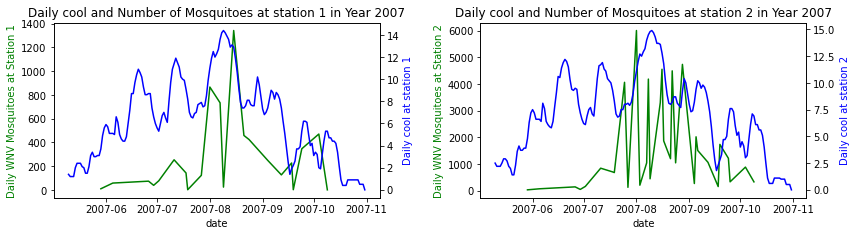

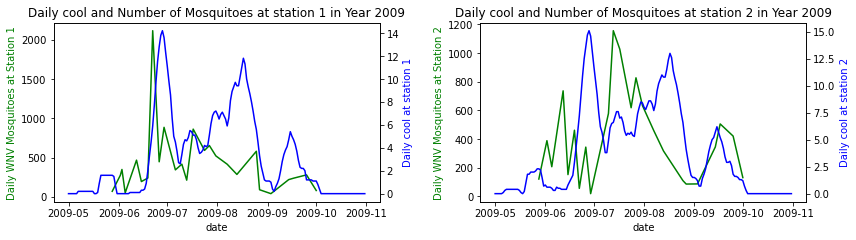

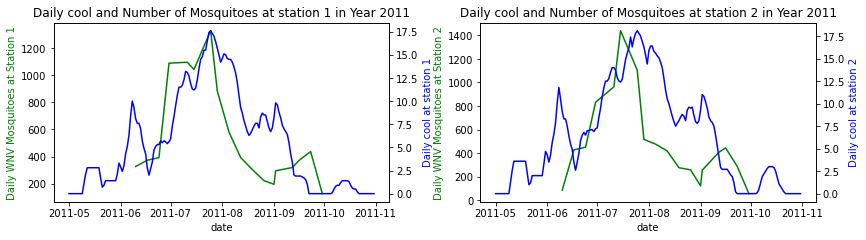

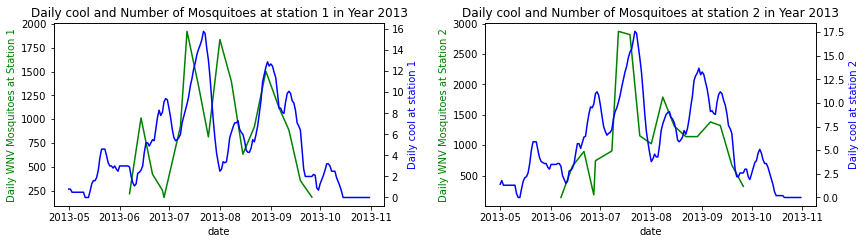

In [37]:
# Plot Cooling Degree Days and Number of West Nile Mosquitoes across years 2007 - 2013 at stations 1 & 2
weatherplot('cool', [2007,2009, 2011, 2013], 4, 2)

In [38]:
# Display summary statistics of Cooling Degree Days across month of each year
sumstatweather('cool')

Summary statistics of cool across month over 4 years (2007, 2009, 2011, 2013)
       count  min  median   max       mean
month                                     
5         81  1.6     2.3   4.8   2.846914
6       1337  0.0     5.3  14.6   5.261780
7       2120  3.4     9.3  18.1  10.339481
8       2835  2.5     8.7  15.6   9.595626
9       1973  0.0     5.3  11.2   5.345058
10       264  1.1     3.0   6.9   2.670833
Summary statistics of cool across month in year 2007
       count  min  median   max       mean
month                                     
5         25  3.7     4.8   4.8   4.492000
6        175  5.1     7.2   9.5   7.465143
7        460  5.3     9.1  11.7   9.059565
8       1321  7.4    11.1  14.8  11.061166
9        655  1.9     6.6  10.2   6.185802
10       201  2.0     3.0   6.9   3.141294
Summary statistics of cool across month in year 2009
       count  min  median   max      mean
month                                    
5         56  1.6     2.3   2.3  2.112500
6 

From the summary statistics of cooling degree days in each month,
- Cooling degree days measure of how hot the temperature was on a given day. It compares average tempature to 65 degrees Fahrenheit. E.g. If if the average temperature of one day is 75 degrees Fahrenheit, the day has 10 cooling degree days.
- Cooling degree days increases from May (cooling degree days days of 2.85) to July (cooling degree days of 10.3), remains high in August (cooling degree days of 9.6) and decreases from September onwards till October (cooling degree days of 2.67)
- Higher cooling degree days occur in July and August.
- Previously, we found that that the daily temperature average increases from May to July, remains high in August, and decreases from September onwards till October. Hence we are seeing the above trend in cooling degree days across each year.

From the plots of cooling degree days and number of mosquitoes (species that can carry WNV) in years 2007, 2009, 2011 and 2013 at stations 1 & 2,
- As the cooling degree days increases, the number of WNV mosquitoes tends to increase.
- There tends to be peaks in number of WNV mosquitoes when the cooling degree days peaks, typically in July and August.

#### Visualise Daily Total Precipitation and Number of WNV Mosquitoes in Each Year at Each Station

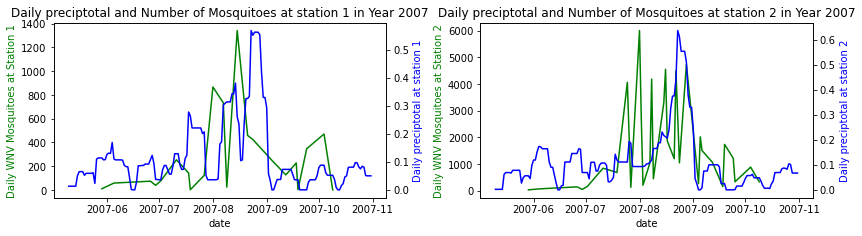

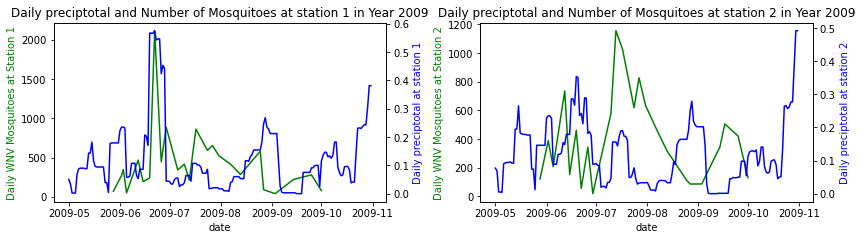

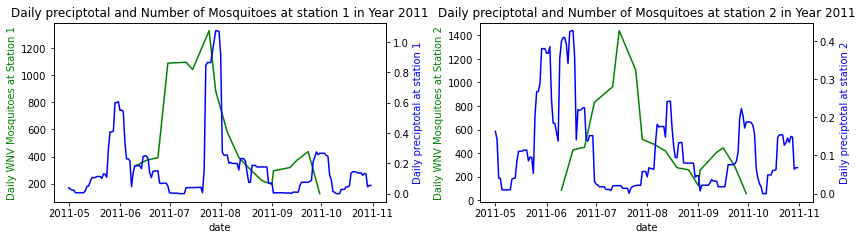

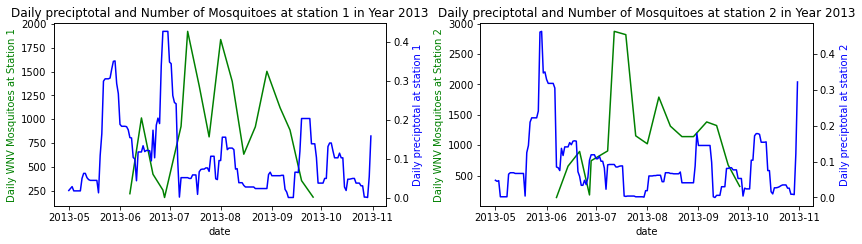

In [39]:
# Plot Daily Precipitaion and Number of West Nile Mosquitoes across years 2007 - 2013 at stations 1 & 2
weatherplot('preciptotal', [2007,2009, 2011, 2013], 4, 2)

In [40]:
# Display summary statistics of preciptotal across month of each year
sumstatweather('preciptotal')

Summary statistics of preciptotal across month over 4 years (2007, 2009, 2011, 2013)
       count    min  median    max      mean
month                                       
5         81  0.056   0.146  0.179  0.129346
6       1337  0.032   0.148  0.575  0.184509
7       2120  0.002   0.058  1.074  0.107981
8       2835  0.019   0.094  0.611  0.165412
9       1973  0.000   0.025  0.266  0.049641
10       264  0.048   0.057  0.114  0.075405
Summary statistics of preciptotal across month in year 2007
       count    min  median    max      mean
month                                       
5         25  0.056   0.056  0.114  0.072240
6        175  0.037   0.110  0.172  0.114634
7        460  0.036   0.129  0.278  0.141304
8       1321  0.036   0.217  0.611  0.263942
9        655  0.000   0.008  0.100  0.026376
10       201  0.048   0.057  0.088  0.063527
Summary statistics of preciptotal across month in year 2009
       count    min  median    max      mean
month                         

From the summary statistics of Daily Total Precipitation in each month across years 2007, 2009, 2011, 2013,
- Typically, Daily Total Precipitation are high in June, July and August (mean Daily Total Precipitation 0.185, 0.107 and 0.165 respectively) and drops from September onwards.

From the plots of Daily Total Precipitation and Number of West Nile Mosquitoes in years 2007, 2009, 2011 and 2013 at stations 1 & 2,
- The months with highest daily total precipitation are June, July and August.
- The months with highest number of WNV mosquitoes are July and August.
- The rise and peaks in number of WNV mosquitoes typically occur approximately one month after peaks in daily total precipitation. 
- Higher precipitation can result in an increase in breeding sites for WNV mosquitoes.

#### Visualise Station Pressure and Number of WNV Mosquitoes in Each Year at Each Statio

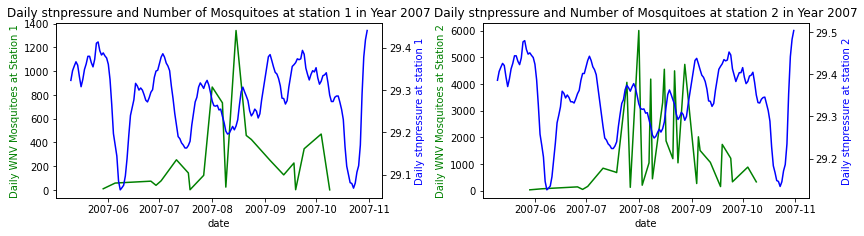

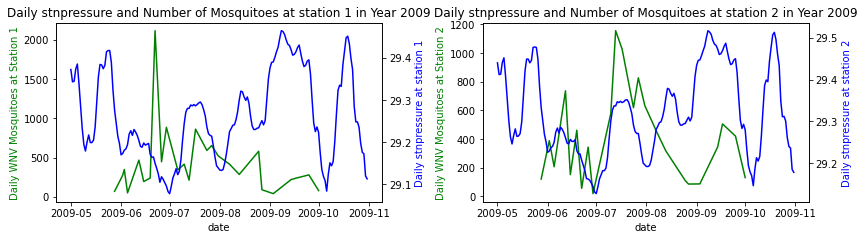

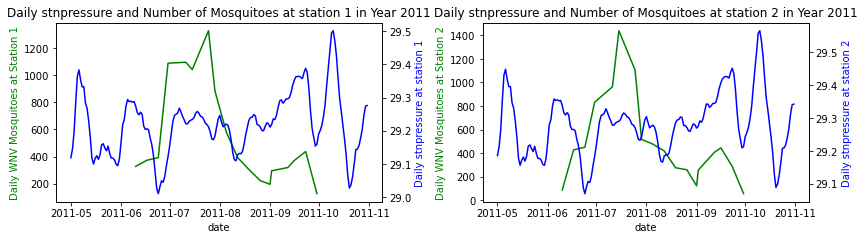

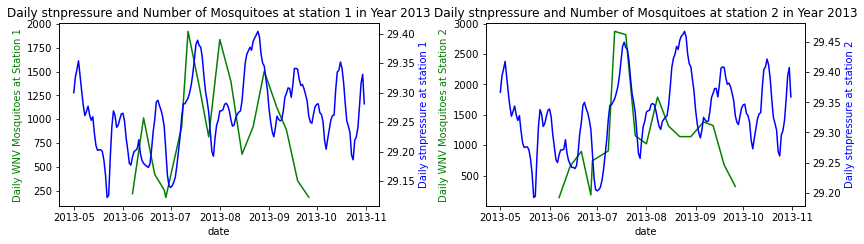

In [41]:
# Plot Daily Station Pressure and Number of West Nile Mosquitoes across years 2007 - 2013 at stations 1 & 2
weatherplot('stnpressure', [2007,2009, 2011, 2013], 4, 2)

In [42]:
# Display summary statistics of Station Pressure across month of each year
sumstatweather('stnpressure')

Summary statistics of stnpressure across month over 4 years (2007, 2009, 2011, 2013)
       count     min  median     max       mean
month                                          
5         81  29.276  29.333  29.451  29.353420
6       1337  29.011  29.242  29.402  29.228533
7       2120  29.123  29.278  29.441  29.282582
8       2835  29.128  29.292  29.453  29.299396
9       1973  29.160  29.390  29.473  29.377127
10       264  29.223  29.383  29.383  29.340383
Summary statistics of stnpressure across month in year 2007
       count     min  median     max       mean
month                                          
5         25  29.388  29.451  29.451  29.433360
6        175  29.171  29.295  29.402  29.298120
7        460  29.169  29.276  29.433  29.283243
8       1321  29.203  29.292  29.340  29.293514
9        655  29.280  29.419  29.446  29.397739
10       201  29.288  29.383  29.383  29.364697
Summary statistics of stnpressure across month in year 2009
       count     min  media

From the summary statistics of Daily Station Pressure in each month across years 2007, 2009, 2011 and 2013,
- The Mean Daily Station Pressure in each month is generally similar with values of between 29.2 to 29.4, hence there is minimal fluctuation in Daily Station Pressure across months.

From the plots of Daily Station Pressure and Number of West Nile Mosquitoes in years 2007, 2009, 2011 and 2013 at stations 1 & 2,
*   Daily Station Pressure tends to peak every month from May to October whereaas the highest number of WNV mosquitoes tends to peak in July and August.
*   The plots seem to show that there is little correlation between Station Pressure and the number of WNV mosquitoes.

#### Visualise Daily Average Sea Level Pressure and Number of WNV Mosquitoes in Each Year at Each Station

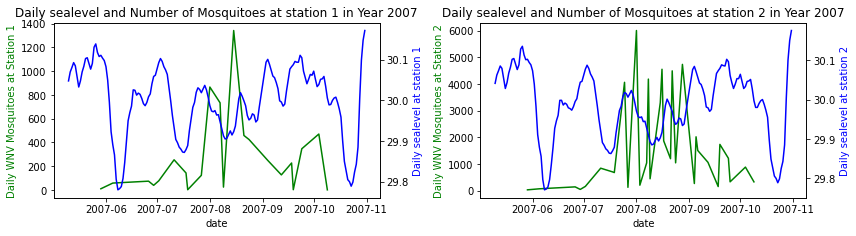

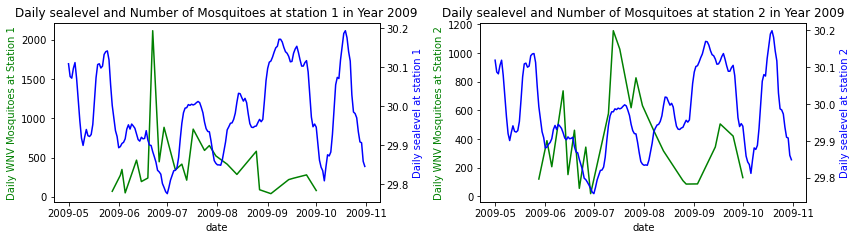

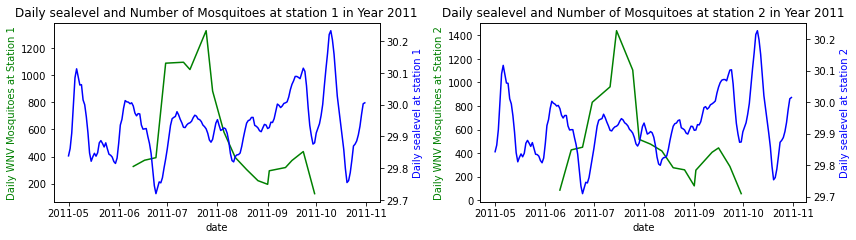

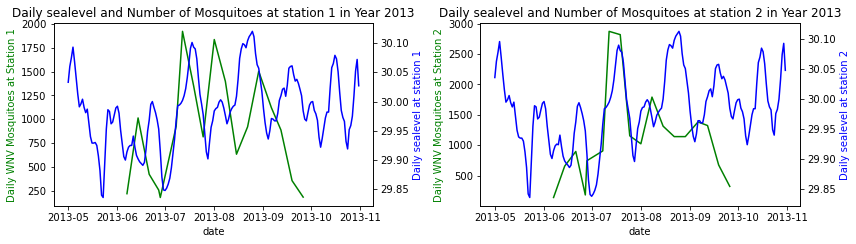

In [43]:
# Plot Daily SeaLevel Pressure and Number of West Nile Mosquitoes across years 2007 - 2013 at stations 1 & 2
weatherplot('sealevel', [2007,2009, 2011, 2013], 4, 2)

In [44]:
# Display summary statistics of sealevel across month of each year
sumstatweather('sealevel')

Summary statistics of sealevel across month over 4 years (2007, 2009, 2011, 2013)
       count     min  median     max       mean
month                                          
5         81  29.993  29.993  30.111  30.029086
6       1337  29.710  29.909  30.059  29.899047
7       2120  29.821  29.942  30.093  29.944400
8       2835  29.818  29.957  30.104  29.959248
9       1973  29.874  30.064  30.136  30.045606
10       264  29.940  30.033  30.039  30.009636
Summary statistics of sealevel across month in year 2007
       count     min  median     max       mean
month                                          
5         25  30.102  30.102  30.111  30.104520
6        175  29.879  29.995  30.059  29.974269
7        460  29.870  29.920  30.093  29.952583
8       1321  29.893  29.952  29.999  29.949238
9        655  29.979  30.079  30.105  30.064773
10       201  29.997  30.033  30.039  30.030896
Summary statistics of sealevel across month in year 2009
       count     min  median     max

From the summary statistics of Daily Sea Level Pressure in each month across years 2007, 2009, 2011 and 2013,
- The Mean Daily Sea Level Pressure in each month is generally similar with values of between 29.9 to 30.0, hence there is minimal fluctuation in Daily Sea Level Pressure across months.

From the plots of Daily Sea Level Pressure and Number of West Nile Mosquitoes in years 2007, 2009, 2011 and 2013 at stations 1 & 2,
*   Daily sea level pressure tends to peak every month from May to October whereaas the highest number of WNV mosquitoes tends to peak in July and August.
*   The plots seem to show that there is little correlation between sea level pressure and the number of WNV mosquitoes.

Visualise Daily Average Wind Speed and Number of WNV Mosquitoes in Each Year at Each Station

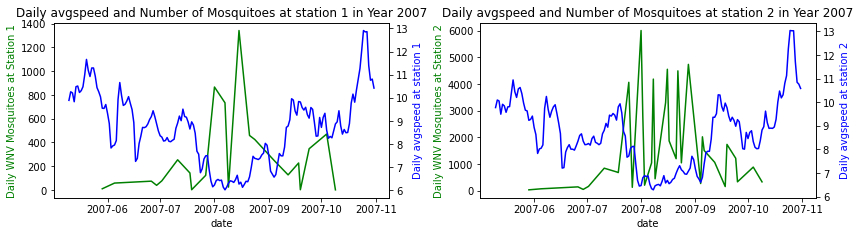

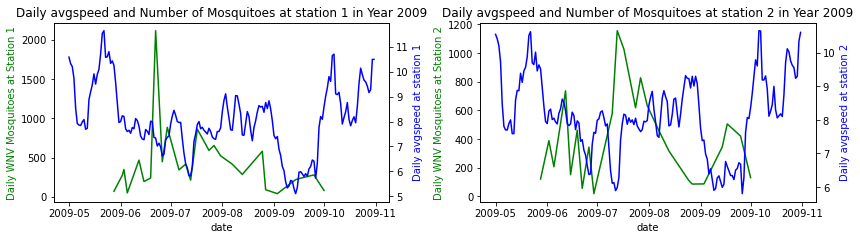

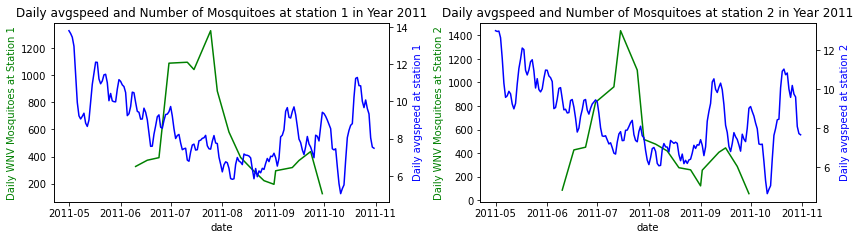

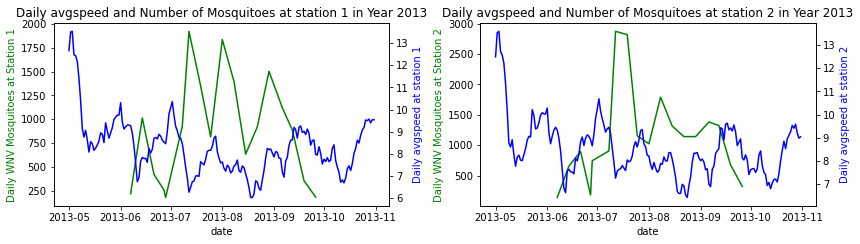

In [45]:
# Plot Daily Average Wind Speed and Number of West Nile Mosquitoes across years 2007 - 2013 at stations 1 & 2
weatherplot('avgspeed', [2007,2009, 2011, 2013], 4, 2)

In [46]:
# Display summary statistics of average wind speed across month of each year
sumstatweather('avgspeed')

Summary statistics of avgspeed across month over 4 years (2007, 2009, 2011, 2013)
       count   min  median    max      mean
month                                      
5         81  9.23    9.52  10.25  9.593333
6       1337  6.37    8.35   9.95  8.450292
7       2120  5.83    7.82   9.80  7.863274
8       2835  6.02    6.92   9.30  7.101520
9       1973  5.11    8.13  10.10  8.075398
10       264  8.33    8.33   8.87  8.439394
Summary statistics of avgspeed across month in year 2007
       count   min  median   max      mean
month                                     
5         25  9.23    9.23  9.55  9.319600
6        175  7.96    8.35  9.19  8.453257
7        460  7.49    8.81  9.80  8.636304
8       1321  6.02    6.58  7.38  6.657456
9        655  6.57    9.12  9.96  8.711634
10       201  8.33    8.33  8.87  8.443483
Summary statistics of avgspeed across month in year 2009
       count   min  median    max      mean
month                                      
5         56  9.52  

From the summary statistics of daily Average Wind Speed in each month across years 2007, 2009, 2011 and 2013,
- The Average Wind Speed decreasese from May (Average Wind Speed of 9.59) to July and August (Average Wind Speed of 7.86 and 7.10 respective) and increases from September to October (Average Wind Speed of 8.08 and 8.44 respectively) 
- Lower Average Wind Speed occurs in July and August.

From the plots of daily Average Wind Speed and number of mosquitoes (species that can carry WNV) in years 2007, 2009, 2011 and 2013 at stations 1 & 2,
- As the daily Average Wind Speed decreases, the number of WNV mosquitoes tends to increase (generally).
- There tends to be peaks in number of WNV mosquitoes when the Average Wind Speed dips, typically in July and August.

#### Visualise Daily Resultant Wind Speed and Number of WNV Mosquitoes in Each Year at Each Station

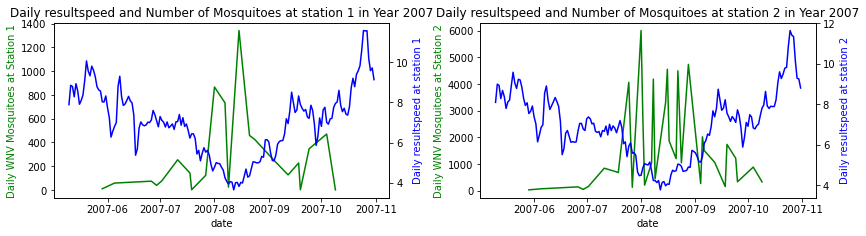

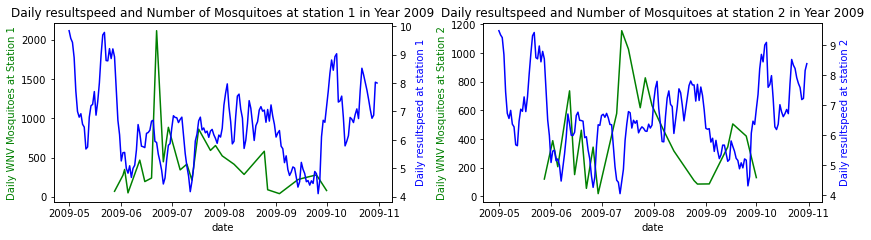

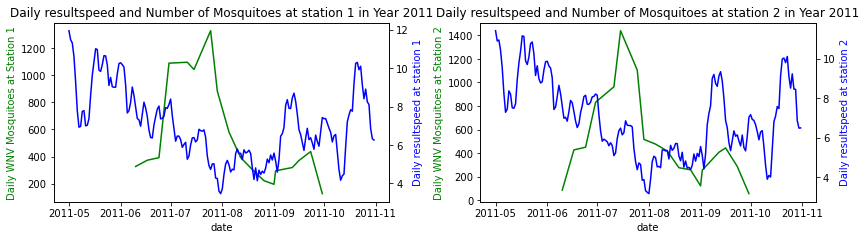

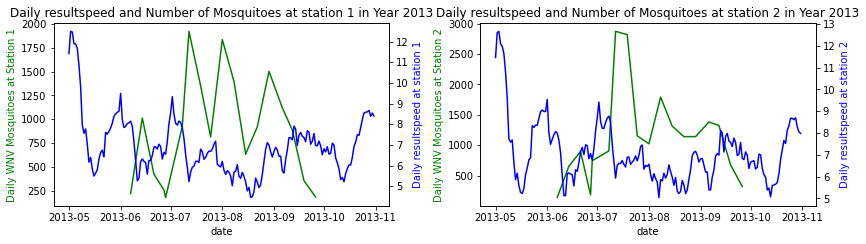

In [47]:
# Plot Daily Resultant Speed and Number of West Nile Mosquitoes across years 2007 - 2013 at stations 1 & 2
weatherplot('resultspeed', [2007,2009, 2011, 2013], 4, 2)

In [48]:
# Display summary statistics of resultant speed across month of each year
sumstatweather('resultspeed')

Summary statistics of resultspeed across month over 4 years (2007, 2009, 2011, 2013)
       count   min  median   max      mean
month                                     
5         81  7.54    8.55  8.92  8.348272
6       1337  4.26    6.75  8.21  6.683882
7       2120  3.89    6.36  8.78  6.098844
8       2835  3.82    5.00  7.70  5.224190
9       1973  4.34    6.88  9.12  6.577851
10       264  6.83    6.83  7.94  6.969167
Summary statistics of resultspeed across month in year 2007
       count   min  median   max      mean
month                                     
5         25  7.54    7.54  8.02  7.674400
6        175  6.66    6.85  7.12  6.870114
7        460  5.52    6.66  7.37  6.530087
8       1321  3.82    4.71  5.07  4.537721
9        655  5.09    7.20  8.31  6.931786
10       201  6.83    6.83  7.94  6.968756
Summary statistics of resultspeed across month in year 2009
       count   min  median   max      mean
month                                     
5         56  8.55   

From the summary statistics of daily Resultant Wind Speed in each month across years 2007, 2009, 2011 and 2013,
- The Resultant Wind Speed decreasese from May (Resultant Wind Speed of 8.35) to July and August (Resultant Wind Speed of 6.10 and 5.22 respective) and increases from September to October (Resultant Wind Speed of 6.97) 
- Lower Resultant Wind Speed occurs in July and August.

From the plots of daily Resultant Wind Speed and number of mosquitoes (species that can carry WNV) in years 2007, 2009, 2011 and 2013 at stations 1 & 2,
- As the daily Resultant Wind Speed decreases, the number of WNV mosquitoes tends to increase (generally).
- There tends to be peaks in number of WNV mosquitoes when the Resultant Wind Speed dips, typically in July and August.

#### Visualise Resultant Wind Direction and Number of WNV Mosquitoes in Each Year at Each Station

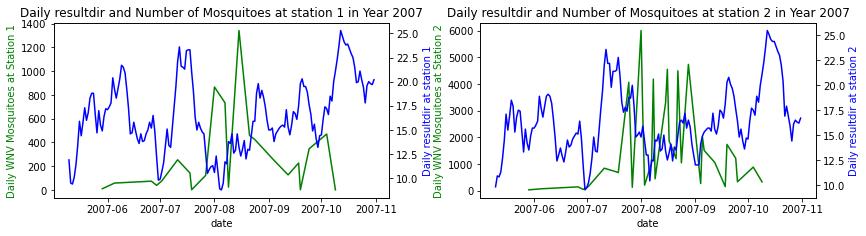

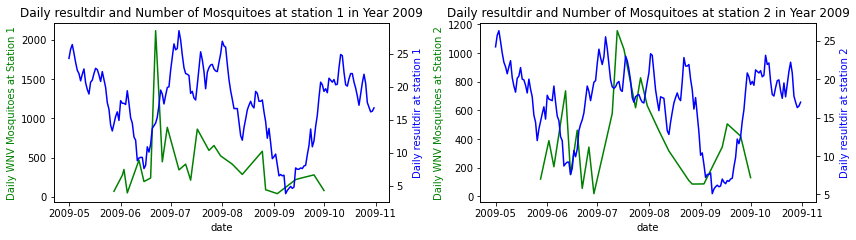

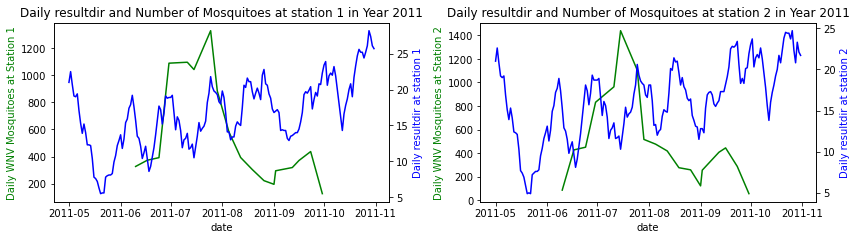

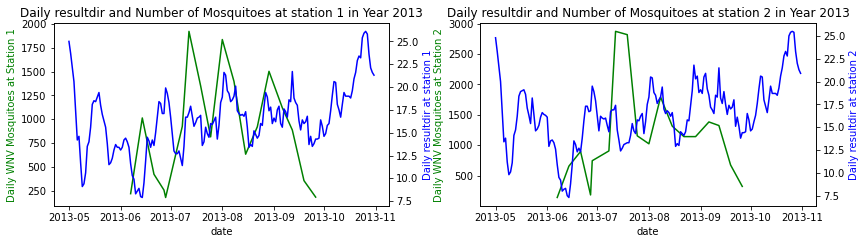

In [49]:
# Plot Daily Resultant Direction and Number of West Nile Mosquitoes across years 2007 - 2013 at stations 1 & 2
weatherplot('resultdir', [2007,2009, 2011, 2013], 4, 2)

In [50]:
# Display summary statistics of resultant direction across month of each year
sumstatweather('resultdir')

Summary statistics of resultdir across month over 4 years (2007, 2009, 2011, 2013)
       count   min  median   max       mean
month                                      
5         81  13.5    14.5  14.9  14.293827
6       1337   7.3    15.2  19.9  14.364697
7       2120  10.2    18.8  28.5  18.044858
8       2835  10.6    14.8  22.8  15.519647
9       1973   6.8    16.2  23.4  15.712418
10       264  17.2    17.5  21.1  18.147727
Summary statistics of resultdir across month in year 2007
       count   min  median   max       mean
month                                      
5         25  13.5    13.5  14.9  13.892000
6        175  11.9    15.2  19.2  15.420571
7        460  10.2    21.5  23.3  19.132174
8       1321  10.6    13.5  16.5  13.992203
9        655  13.8    17.5  20.3  16.754656
10       201  17.2    17.5  21.1  17.786567
Summary statistics of resultdir across month in year 2009
       count   min  median   max       mean
month                                      
5        

From the plots of Resultant Direction and Number of West Nile Mosquitoes in years 2007, 2009, 2011 and 2013 at stations 1 & 2,
*   Resultant Direction tends to peak every month from May to October whereaas the highest number of WNV mosquitoes tends to peak in July and August.
*   The plots seem to show that there is little correlation between Resultant Direction and the number of WNV mosquitoes.

#### Visualise Daily Humidity and Number of WNV Mosquitoes in Each Year at Each Station

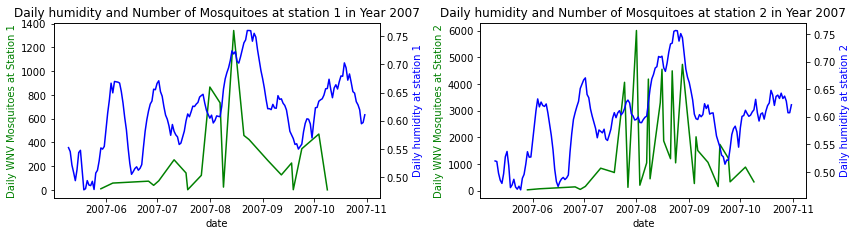

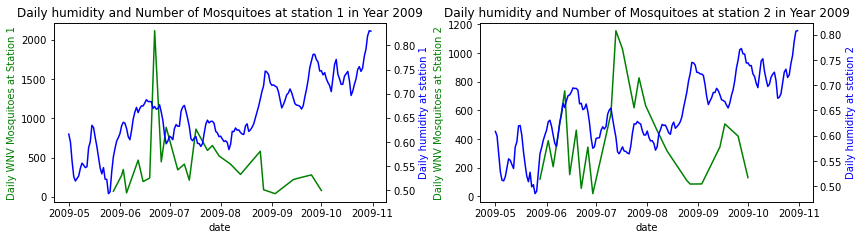

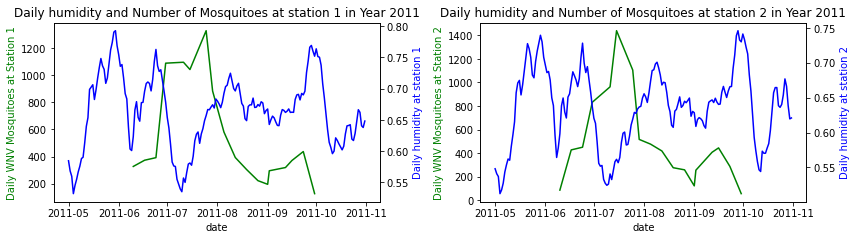

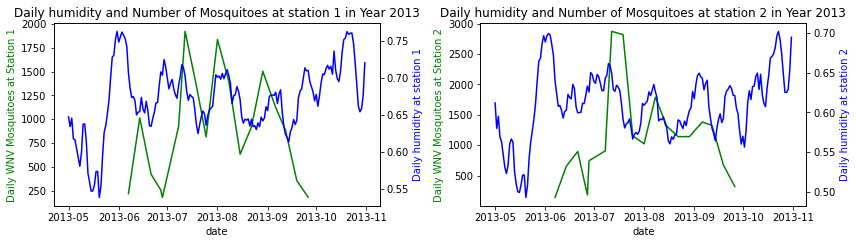

In [51]:
# Plot Daily Humidity and Number of West Nile Mosquitoes across years 2007 - 2013 at stations 1 & 2
weatherplot('humidity', [2007,2009, 2011, 2013], 4, 2)

In [52]:
# Display summary statistics of Humidity across month of each year
sumstatweather('humidity')

Summary statistics of humidity across month over 4 years (2007, 2009, 2011, 2013)
       count       min    median       max      mean
month                                               
5         81  0.536680  0.563913  0.569382  0.557836
6       1337  0.574982  0.639714  0.762772  0.648236
7       2120  0.540702  0.613047  0.702994  0.612867
8       2835  0.578280  0.644624  0.760047  0.654058
9       1973  0.521164  0.640403  0.768209  0.633197
10       264  0.611803  0.611803  0.747659  0.648033
Summary statistics of humidity across month in year 2007
       count       min    median       max      mean
month                                               
5         25  0.536680  0.536680  0.551903  0.540942
6        175  0.607684  0.618009  0.656025  0.629599
7        460  0.573422  0.599678  0.670954  0.611403
8       1321  0.589618  0.707829  0.760047  0.674180
9        655  0.521164  0.574726  0.638956  0.576300
10       201  0.611803  0.611803  0.657300  0.617569
Summary stati

From the plots of Daily Humidity and Number of West Nile Mosquitoes in years 2007, 2009, 2011 and 2013 at stations 1 & 2,
*   Daily humidity tends to peak every month from May to October whereaas the highest number of WNV mosquitoes tends to peak in July and August.
*   The plots seem to show that there is little correlation between daily humidity pressure and the number of WNV mosquitoes.

<div id="spatialeda"></div>

## EDA: Using Spatial Visualisations

We will visualising the presence of WNV in locations of traps.

A shapefile with spatial data on the area of Chicago was obtained from the Chicago Data Portal ([*source*](https://data.cityofchicago.org/browse?tags=gis)).

In [53]:
# Read shapefile containing spatial data on Chicago and return a GeoDataFrame object
chicago_neighbourhoods = gpd.read_file('datasets/geo_export_cc60d8c7-577d-4304-8e81-7a74832799af.shp')

# Initiate Coordinate Reference System to tell Python how coordinates relate to places on Earth
# 'EPSG:4326': WGS74 Latitude/Longitude
crs = {'init': 'EPSG:4326'}

In [54]:
# Transform latitude and longitude from train1 dataframe into a list of shapely.Point objects, set as a geometry and
# create a GeoDataFrame
trap_geometry = [Point(xy) for xy in zip(train1['longitude'], train1['latitude'])]
train1_gdf = gpd.GeoDataFrame(train1, crs = crs,  geometry = trap_geometry)
train1_gdf.head()

,date,species,trap,latitude,longitude,wnvpresent,dayofmonth,month,year,species_encode,...,cool,preciptotal,stnpressure,sealevel,resultspeed,resultdir,avgspeed,humidity,year_month,geometry
0,2007-05-29,CULEX PIPIENS,T096,41.731922,-87.677512,0,29,5,2007,1,...,4.8,0.056,29.451,30.102,7.54,13.5,9.23,0.53668,2007-05,POINT (-87.67751 41.73192)
1,2007-05-29,CULEX PIPIENS/RESTUANS,T048,41.867108,-87.654224,0,29,5,2007,3,...,4.8,0.056,29.451,30.102,7.54,13.5,9.23,0.53668,2007-05,POINT (-87.65422 41.86711)
2,2007-05-29,CULEX PIPIENS/RESTUANS,T050,41.919343,-87.694259,0,29,5,2007,3,...,4.8,0.056,29.451,30.102,7.54,13.5,9.23,0.53668,2007-05,POINT (-87.69426 41.91934)
3,2007-05-29,CULEX PIPIENS/RESTUANS,T054,41.921965,-87.632085,0,29,5,2007,3,...,4.8,0.056,29.451,30.102,7.54,13.5,9.23,0.53668,2007-05,POINT (-87.63209 41.92197)
4,2007-05-29,CULEX PIPIENS/RESTUANS,T086,41.688324,-87.676709,0,29,5,2007,3,...,4.8,0.056,29.451,30.102,7.54,13.5,9.23,0.53668,2007-05,POINT (-87.67671 41.68832)


In [55]:
# Create a list station_long containing the longitudes of stations 1 and 2 and
# another list station_lat containing the latitudes of stations 1 and 2.
# Station 1: Chicago O'Hare International Airport (Lat: 41.995, Lon: -87.933)
# Station 2: Chicago Midway International Airport (Lat: 41.786, Lon: -87.752)
station_long = [-87.933, -87.752]
station_lat = [41.995, 41.786]

# Transform latitude and longitude of stations into a list of shapely.Point
# objects, set as a geometry and create a GeoDataFrame
station_geometry = [Point(xy) for xy in zip(station_long, station_lat)]

station_df = {'station': ['1', '2'],
         'long': [-87.933, -87.752], # list of longitudes of stations 1 and 2
         'lat': [41.995, 41.786]} # list of latitudes of stations 1 and 2

station_gdf = gpd.GeoDataFrame(station_df, crs = crs, geometry = station_geometry)
station_gdf.head()

,station,long,lat,geometry
0,1,-87.933,41.995,POINT (-87.93300 41.99500)
1,2,-87.752,41.786,POINT (-87.75200 41.78600)


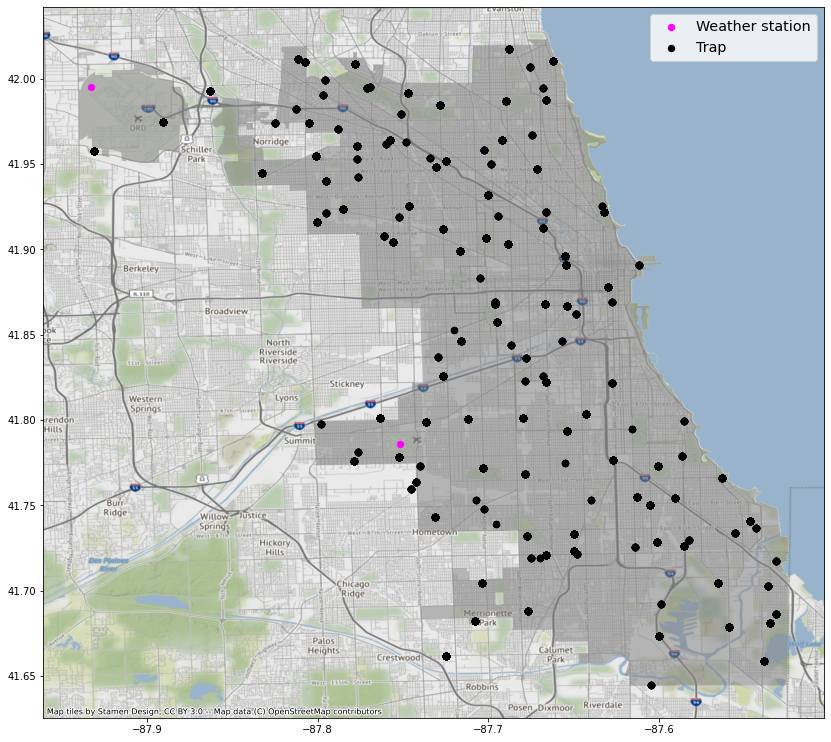

In [56]:
# Display location of traps and weather station locations in years 2007, 2009, 2011 and 2013
fig, ax = plt.subplots(figsize = (14, 14))
# Map the neighbourhoods of Chicago as grey area
chicago_neighbourhoods.plot(ax = ax, alpha = 0.5, color = 'grey')
# Map the location of weather stations 1 and 2 depicted by magenta dots
station_gdf.plot(ax = ax, markersize = 40, marker = 'o', color = 'magenta', label = 'Weather station')
# Map the location of traps in years 2007, 2009, 2011 and 2013 depicted by black dots
train1_gdf.plot(ax = ax, markersize = 40, marker = 'o', color = 'black', label = 'Trap')
# Add background map to the plot
cx.add_basemap(ax, crs = crs, zoom = 12)
plt.legend(loc = 1, fontsize = 'x-large')
plt.show()

<div id="trapfreq"></div>

### Visualise Frequency (in Days) of Each Trap Trapping At Least One Mosquito in 4 years (Years 2007, 2009, 2011 and 2013)

We will visualise the frequency (in days) of each trap trapping at least one mosquito over 4 years (Years 2007, 2009, 2011 and 2013), represented by the cyan circles. The bigger the cyan circles, the more days that the trap has trapped at least one mosquito over the 4 years.


In [57]:
# Create a dataframe to contain id of trap, the number of days where at least one mosquito 
# (any species) was found, and latitude and longitude of trap
# Create lists to store number of days where at least one mosquito 
# (any species) was found, latitude and longitude of trap
trapfreq_list = []
traplat_list = []
traplong_list = []
trapmosqallspec_list = []

for i in list(train1['trap'].unique()):
    trap_freq = train1[train1['trap']==i]['date'].nunique()
    trap_mosqallspec = train1[train1['trap']==i]['nummosquitos'].sum()
    trap_lat = train1[train1['trap']==i]['latitude'].iloc[0]
    trap_long = train1[train1['trap']==i]['longitude'].iloc[0]
    trapfreq_list.append(trap_freq)
    traplat_list.append(trap_lat)
    traplong_list.append(trap_long)
    trapmosqallspec_list.append(trap_mosqallspec)
    
# Create a dataframe to contain id of trap, the number of days where at least one mosquito 
# (any species) was found, and latitude and longitude of trap
trapfreqdf = pd.DataFrame({
    'trap': list(train1['trap'].unique()),
    'frequency_days': trapfreq_list,
    'nummosquitos_allspec': trapmosqallspec_list,
    'longitude': traplong_list,
    'latitude': traplat_list
})

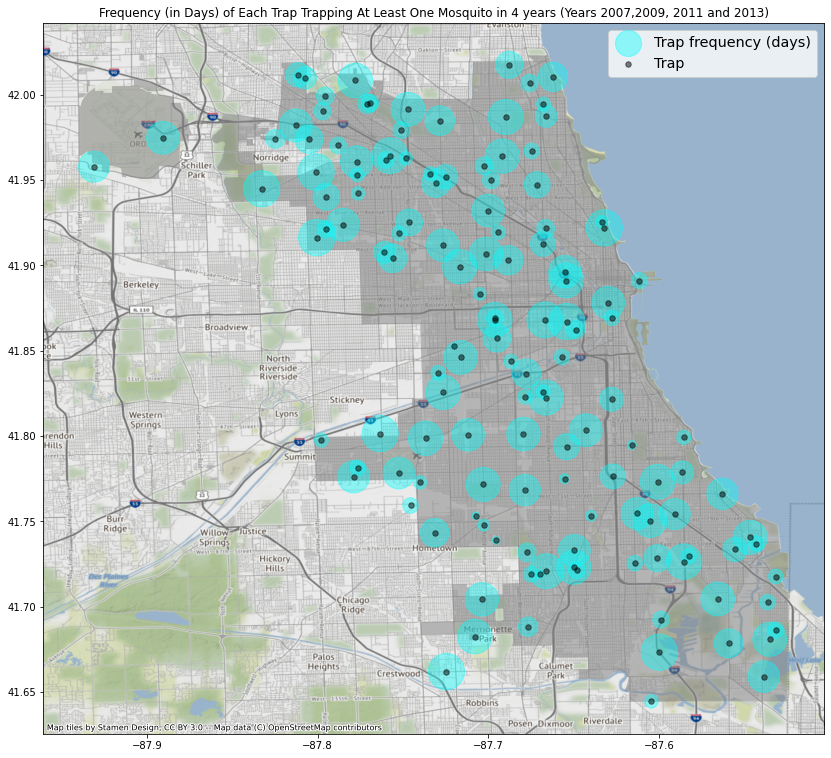

In [58]:
trapfreq_geometry = [Point(xy) for xy in zip(trapfreqdf['longitude'], trapfreqdf['latitude'])]
trapfreq_gdf = gpd.GeoDataFrame(trapfreqdf, crs = crs,  geometry = trapfreq_geometry)

# Display Frequency (in Days) of Each Trap Trapping At Least One Mosquito in 4 years (Years 2007,
# 2009, 2011 and 2013)
fig, ax = plt.subplots(figsize = (14, 14))
chicago_neighbourhoods.plot(ax = ax, alpha = 0.5, color = 'grey')

trapfreq_gdf.plot(ax = ax, markersize = (trapfreq_gdf['frequency_days']*20), marker = "o", 
                  color = 'cyan', alpha = 0.4, label = 'Trap frequency (days)')
trapfreq_gdf.plot(ax = ax, markersize = 30, marker = "o", color = 'black', alpha = 0.5, label = 'Trap')
cx.add_basemap(ax, crs = crs, zoom = 12)
plt.legend(loc = 1, fontsize = 'x-large')
plt.title('Frequency (in Days) of Each Trap Trapping At Least One Mosquito in 4 years (Years 2007,\
2009, 2011 and 2013)')
plt.show()

In [59]:
# Display the number of unique traps
print(f"Total number of traps: {train1['trap'].nunique()}")

# Display traps with the highest and lowest frequency (in days) of trapping at least one 
# mosquito in years 2007, 2009, 2011 and 2013
print(f"Traps with the highest frequency (in days) of trapping at least one mosquito")
print(f"in years 2007, 2009, 2011 and 2013:")
display(trapfreqdf.sort_values(by='frequency_days', ascending = False).head(5))

print(f"Traps with the lowest frequency (in days) of trapping at least one mosquito")
print(f"in years 2007, 2009, 2011 and 2013:")
display(trapfreqdf.sort_values(by='frequency_days', ascending= True).head(5))

# Display mean frequency (in days) of trapping at least one mosquito by a trap in a year
# (averaging from 2007, 2009, 2011 and 2013)

print(f"Summary Statistics for  frequency (in days) of trapping at least one mosquito")
print(f"in years 2007, 2009, 2011 and 2013")
print(trapfreqdf['frequency_days'].describe())

Total number of traps: 136
Traps with the highest frequency (in days) of trapping at least one mosquito
in years 2007, 2009, 2011 and 2013:


,trap,frequency_days,nummosquitos_allspec,longitude,latitude,geometry
13,T002,67,3710,-87.800991,41.954690,POINT (-87.80099 41.95469)
22,T151,67,1969,-87.800515,41.916265,POINT (-87.80052 41.91627)
101,T115,66,21668,-87.599862,41.673408,POINT (-87.59986 41.67341)
1,T048,66,1796,-87.654224,41.867108,POINT (-87.65422 41.86711)
3,T054,66,1062,-87.632085,41.921965,POINT (-87.63209 41.92197)


Traps with the lowest frequency (in days) of trapping at least one mosquito
in years 2007, 2009, 2011 and 2013:


,trap,frequency_days,nummosquitos_allspec,longitude,latitude,geometry
45,T040,1,6,-87.719887,41.852652,POINT (-87.71989 41.85265)
133,T238,3,34,-87.707394,41.753391,POINT (-87.70739 41.75339)
132,T237,3,18,-87.695443,41.738903,POINT (-87.69544 41.73890)
134,T094B,3,41,-87.669539,41.719140,POINT (-87.66954 41.71914)
92,T076,4,25,-87.615989,41.794781,POINT (-87.61599 41.79478)


Summary Statistics for  frequency (in days) of trapping at least one mosquito
in years 2007, 2009, 2011 and 2013
count    136.000000
mean      33.941176
std       21.472382
min        1.000000
25%       12.000000
50%       34.000000
75%       55.250000
max       67.000000
Name: frequency_days, dtype: float64


Observations regarding frequency (in days) of trapping at least one mosquito
in years 2007, 2009, 2011 and 2013:
- There are 136 traps that trapping at least one mosquito
in years 2007, 2009, 2011 and 2013.
- One trap has a frequency of trapping at least one mosquito
of 34 days in 4 years (namely 2007, 2009, 2011 and 2013). Half of the 136 traps has a frequency of trapping at least one mosquito
of 34 days in the 4 years that is higher than the mean frequency (as shown that the mean (33.9) and median (34) are almost equal).
- The traps with a higher frequency of trapping at least one mosquito
in the 4 years are evenly spread across Chicago. It is the same for traps with lower frequency of trapping at least one mosquito
in the 4 years.

<div id="trapnum4years"></div>

### Visualise Number of Mosquitoes (All Species) Trapped by Each Trap over 4 Years (Years 2007, 2009, 2011 and 2013)

We will visualise the number of mosquitoes (all species) that each trap has trapped over 4 years (Years 2007, 2009, 2011 and 2013), represented by the cyan circles. The bigger the cyan circles, the higher the number of mosquitoes (all species) that the trap has trapped over the 4 years.


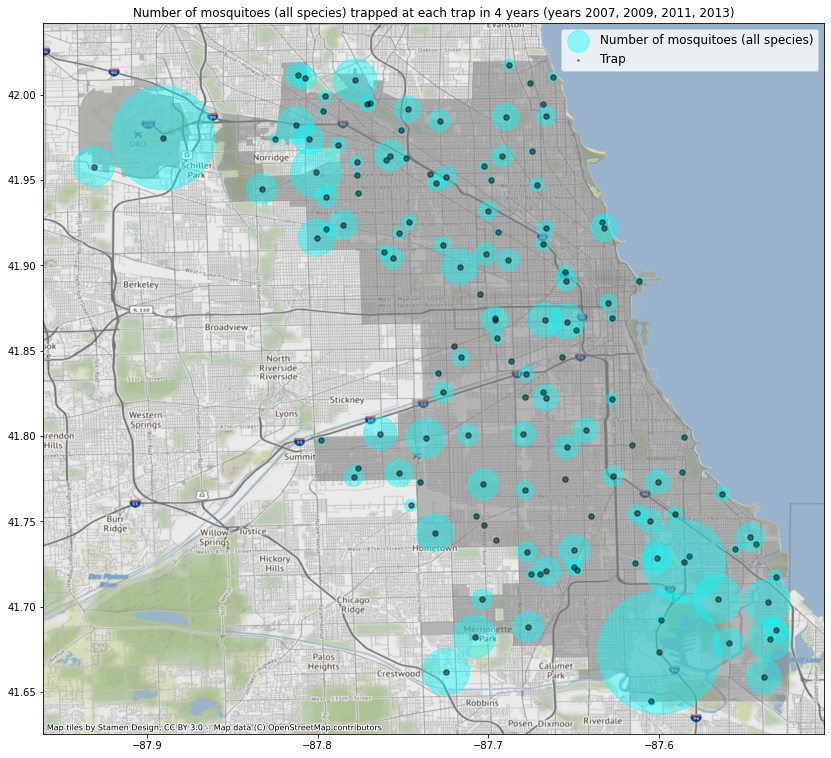

In [60]:
# Display traps and the number of mosquitoes (all species) trapped at each trap in 4 years (years 2007,
# 2009, 2011, 2013
fig, ax = plt.subplots(figsize = (14, 14))
chicago_neighbourhoods.plot(ax = ax, alpha = 0.5, color = 'grey')
trapfreq_gdf.plot(ax = ax, markersize = (trapfreq_gdf['nummosquitos_allspec']*0.7), marker = "o", 
                  color = 'cyan', alpha = 0.4, label = 'Number of mosquitoes (all species)')
trapfreq_gdf.plot(ax = ax, markersize = 30, marker = "o", color = 'black', alpha = 0.5, label = 'Trap')
cx.add_basemap(ax, crs = crs, zoom = 12)
plt.legend(loc = 1, markerscale = 0.25, fontsize = 'large')
plt.title('Number of mosquitoes (all species) trapped at each trap in 4 years (years 2007, 2009, 2011, 2013)')
plt.show()

In [61]:
# Display traps with the highest number of mosquitoes (all species) trapped
# in 4 years (years 2007, 2009, 2011, 2013
print(f"Traps with the highest frequency (in days) of trapping at least one mosquito")
print(f"in years 2007, 2009, 2011 and 2013:")
display(trapfreqdf.sort_values(by='nummosquitos_allspec', ascending = False).head(5))

# Display traps with the lowest number of mosquitoes (all species) trapped
# in 4 years (years 2007, 2009, 2011, 2013
print(f"Traps with the lowest frequency (in days) of trapping at least one mosquito")
print(f"in years 2007, 2009, 2011 and 2013:")
display(trapfreqdf.sort_values(by='nummosquitos_allspec', ascending= True).head(5))

# Display summary statistics on number of mosquitoes (all species) trapped in 4 years
# (years 2007, 2009, 2011, 2013)

print(f"Summary statistics on number of mosquitoes (all species) trapped in 4 years")
print(f"(years 2007, 2009, 2011, 2013)")
print(trapfreqdf['nummosquitos_allspec'].describe())

Traps with the highest frequency (in days) of trapping at least one mosquito
in years 2007, 2009, 2011 and 2013:


,trap,frequency_days,nummosquitos_allspec,longitude,latitude,geometry
101,T115,66,21668,-87.599862,41.673408,POINT (-87.59986 41.67341)
116,T900,54,15386,-87.890615,41.974689,POINT (-87.89061 41.97469)
102,T138,63,9936,-87.585413,41.726465,POINT (-87.58541 41.72646)
13,T002,67,3710,-87.800991,41.954690,POINT (-87.80099 41.95469)
104,T128,57,3315,-87.565666,41.704572,POINT (-87.56567 41.70457)


Traps with the lowest frequency (in days) of trapping at least one mosquito
in years 2007, 2009, 2011 and 2013:


,trap,frequency_days,nummosquitos_allspec,longitude,latitude,geometry
45,T040,1,6,-87.719887,41.852652,POINT (-87.71989 41.85265)
21,T149,10,15,-87.667736,41.994469,POINT (-87.66774 41.99447)
113,T078,5,17,-87.655356,41.775051,POINT (-87.65536 41.77505)
132,T237,3,18,-87.695443,41.738903,POINT (-87.69544 41.73890)
105,T072,7,19,-87.702716,41.747850,POINT (-87.70272 41.74785)


Summary statistics on number of mosquitoes (all species) trapped in 4 years
(years 2007, 2009, 2011, 2013)
count      136.000000
mean       992.933824
std       2449.304020
min          6.000000
25%         89.000000
50%        374.500000
75%       1002.750000
max      21668.000000
Name: nummosquitos_allspec, dtype: float64


Observations on number of mosquitoes (all species) trapped in 4 years
(years 2007, 2009, 2011, 2013):
- The number of mosquitoes (all species) trapped in 4 years
(years 2007, 2009, 2011, 2013) ranged from 6 (trap T040) to 21668 (trap T115).
- The mean number of mosquitoes (all species) trapped in 4 years
(years 2007, 2009, 2011, 2013) by a trap is 993.
- The traps that trapped the higher number of mosquitoes (all species) trapped in the 4 years are located in north-west tip of Chicago and south-east tip of Chicago.


<div id="wnv4years"></div>

### Visualise Locations of Traps with WNV Presence/Absence over Years 2007, 2009, 2011 and 2013

We will map out the locations of traps with WNV presence and absence over 4 years (years 2007, 2009, 2011 and 2013).

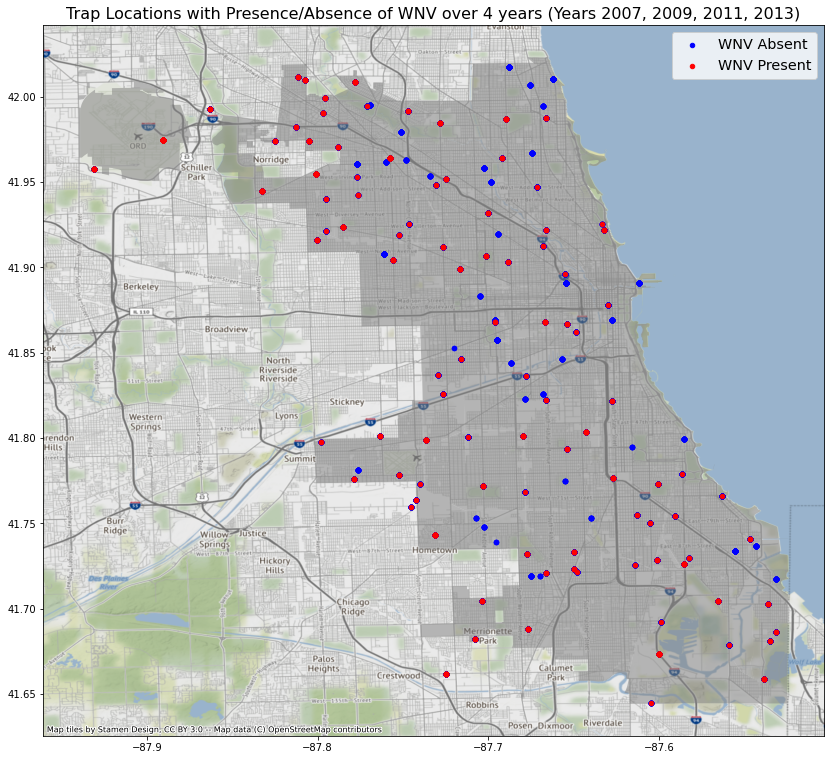

In [62]:
# Map trap locations with absence of WNV in blue dots
# Map trap locations with presence of WNV in red dots
fig, ax = plt.subplots(figsize = (14, 14))
chicago_neighbourhoods.plot(ax = ax, alpha = 0.5, color = 'grey')
train1_gdf[train1_gdf['wnvpresent'] == 0].plot(ax = ax, markersize = 20, marker = "o", color = 'blue', label = 'WNV Absent')
train1_gdf[train1_gdf['wnvpresent'] == 1].plot(ax = ax, markersize = 20, marker = "o", color = 'red', label = 'WNV Present')
cx.add_basemap(ax, crs = crs, zoom = 12)
plt.title('Trap Locations with Presence/Absence of WNV over 4 years (Years 2007, 2009, 2011, 2013)', fontsize = 16)
plt.legend(loc = 1, fontsize = 'x-large')
plt.show()

In [63]:
# pres4years list contains all traps that have an occurrence of wnvpresent as 1 over the 4 years
# abs4years list contains all traps that have an occurrence of wnvpresent as 0 over the 4 years
pres4years = list(train1[train1['wnvpresent']==1]['trap'].unique())
abs4years = list(train1[train1['wnvpresent']==0]['trap'].unique())

# Find traps that have an occurrence of wnvpresent as 1 but did not have an occurrence of 
# wnvpresenta as 0 over the 4 years 
# i.e. elements in pres4years list but not in abs4years list
print(list(set(pres4years).difference(abs4years)))
print(len(list(set(pres4years).difference(abs4years))))
# Find traps that have an occurrence of wnvpresent as 0 but did not have an occurrence of 
# wnvpresenta as 1 over the 4 years 
# i.e. elements in abs4years list but not in pres4years list
print(list(set(abs4years).difference(pres4years)))
print(len(list(set(abs4years).difference(pres4years))))

[]
0
['T206', 'T094B', 'T237', 'T034', 'T149', 'T129', 'T238', 'T153', 'T040', 'T046', 'T229', 'T088', 'T076', 'T071', 'T146', 'T044', 'T060', 'T007', 'T075', 'T051', 'T141', 'T025', 'T148', 'T099', 'T043', 'T219', 'T092', 'T078', 'T072', 'T019', 'T050', 'T017', 'T018', 'T161', 'T001', 'T150', 'T004', 'T100', 'T157']
39


The red points are traps that have detected WNV presence at at least one occurence over all 4 years (years 2007, 2009, 2011 and 2013). The blue points are traps that have never detected WNV presence over all 4 years (years 2007, 2009, 2011 and 2013).


From the map of trap locations with presence/absence of WNV over 4 years (years 2007, 2009, 2011, 2013):
- The trap locations with presence of WNV (represented by red dots) and those with absence of WNV (represented by blue dots) over the 4 years are generally scattered evenly in Chicago
- The north-west tip of Chicago and south-east tip of Chicago tend to have traps with presence of WNV over the 4 years. 
- There are 39 traps with only absence of WNV over the 4 years (years 2007, 2009, 2011, 2013). The remaining 97 traps had detected at least one occurence of WNV presence over all 4 years (years 2007, 2009, 2011 and 2013).

<div id="wnv2007"></div>

### Visualise Trap Locations with Presence/Absence of WNV and Number of Mosquitoes from Species that Carry/Do Not Carry WNV in Year 2007

We will visualise Trap Locations with Presence/Absence of WNV and Number of Mosquitoes from Species that Carry/Do Not Carry WNV in Year 2007.
- 1st map for number of mosquitoes (from species that can carry the WNV) trapped by each trap in 2007 (represented by yellow circles) & the trap locations with presence/absence of WNV). The larger the size of yellow circles, the higher the number of mosquitoes (from species that can carry the WNV) trapped by each trap in 2007.
- 2nd map for number of mosquitoes (from species that do not carry the WNV) trapped by each trap in 2007 (represented by green circles) & the trap locations with presence/absence of WNV). The larger the size of green circles, the higher the number of mosquitoes (from species that do not carry the WNV) trapped by each trap in 2007.

In [64]:
# Create a function that will create a dataframe to contain id of trap, the number of
#  WNV mosquitoes, number of non-WNVV mosquitoes, and latitude and longitude of trap
# Create lists to store the number of WNV mosquitoes, number of non-WNVV
# mosquitoes, and latitude and longitude of trap
def nummosquitotrap(yr):
    trainyr = train1[train1['year'] == yr]
    wnvmosq_list = []
    nonwnvmosq_list = []
    traplat_list = []
    traplong_list = []
    
    for i in list(trainyr['trap'].unique()):
        wnvmosq = trainyr[((trainyr['trap']==i) & (trainyr['species_encode']!=0))]['nummosquitos'].sum()
        nonwnvmosq = trainyr[((trainyr['trap']==i) & (trainyr['species_encode']==0))]['nummosquitos'].sum()
        trap_lat = trainyr[trainyr['trap']==i]['latitude'].iloc[0]
        trap_long = trainyr[train1['trap']==i]['longitude'].iloc[0]
        wnvmosq_list.append(wnvmosq)
        nonwnvmosq_list.append(nonwnvmosq)
        traplat_list.append(trap_lat)
        traplong_list.append(trap_long)
        
    # Create a dataframe to contain id of trap, the number of WNV mosquitoes, number of non-WNVV
    # mosquitoes, and latitude and longitude of trap
    mosqtrapdf = pd.DataFrame({
        'trap': list(trainyr['trap'].unique()),
        'num_wnvmosquitos': wnvmosq_list,
        'num_nonwnvmosquitos': nonwnvmosq_list,
        'longitude': traplong_list,
        'latitude': traplat_list
    })
    return mosqtrapdf

In [65]:
# Create a function to display the 5 observations with the highest number in the feature 
# and the 5 observations with the highest value in the same feature in a dataframe
def topbottom5mosquitos(dataframe, feature, featurename, yr):
  # Display traps with the highest number of mosquitoes (species that can carry WNV) trapped
  # in the input year
    year =  yr
    featurenaming = featurename
    print(f"Traps with the highest number of {featurenaming} trapped")
    print(f"in Year {year}:")
    display(dataframe.sort_values(by = feature, ascending = False).head())
    
    # Display traps with the lowest number of mosquitoes (species that can carry WNV) trapped
    # in specified year
    print(f"Traps with the lowest number of {featurenaming} trapped")
    print(f"in Year {year}:")
    display(dataframe.sort_values(by = feature, ascending = True).head())

In [66]:
# Create a function to find number of traps set up in a year,
# find number of traps which had at least one occurence of wnvpresent = 1 in the year
# find number of traps which had no occurrences of wnvpresent = 1 in the year
# function takes input year
def trapwnvpresence(yr):
    # pres list contains all traps that have an occurrence of wnvpresent as 1 over the 4 years
    # abs list contains all traps that have an occurrence of wnvpresent as 0 over the 4 years
    pres = list(train1[((train1['wnvpresent']==1) & (train1['year']== yr))]['trap'].unique())
    abs = list(train1[((train1['wnvpresent']==0) & (train1['year']== yr))]['trap'].unique())
    alltrap = len(train1[train1['year']== yr]['trap'].unique())
    
    # Find traps that have an occurrence of wnvpresent as 0 but did not have an occurrence of 
    # wnvpresent as 1 in the year
    # i.e. elements in abs4years list but not in pres list
    allabs = len(list(set(abs).difference(pres)))
    print(f"Total number of traps in year {str(yr)}: {alltrap}")
    print(f"Number of traps with at least one occurence of WNV present in year {str(yr)}: {alltrap - allabs}")
    print(f"Number of traps with no occurence of WNV present in year {str(yr)}: {allabs}")

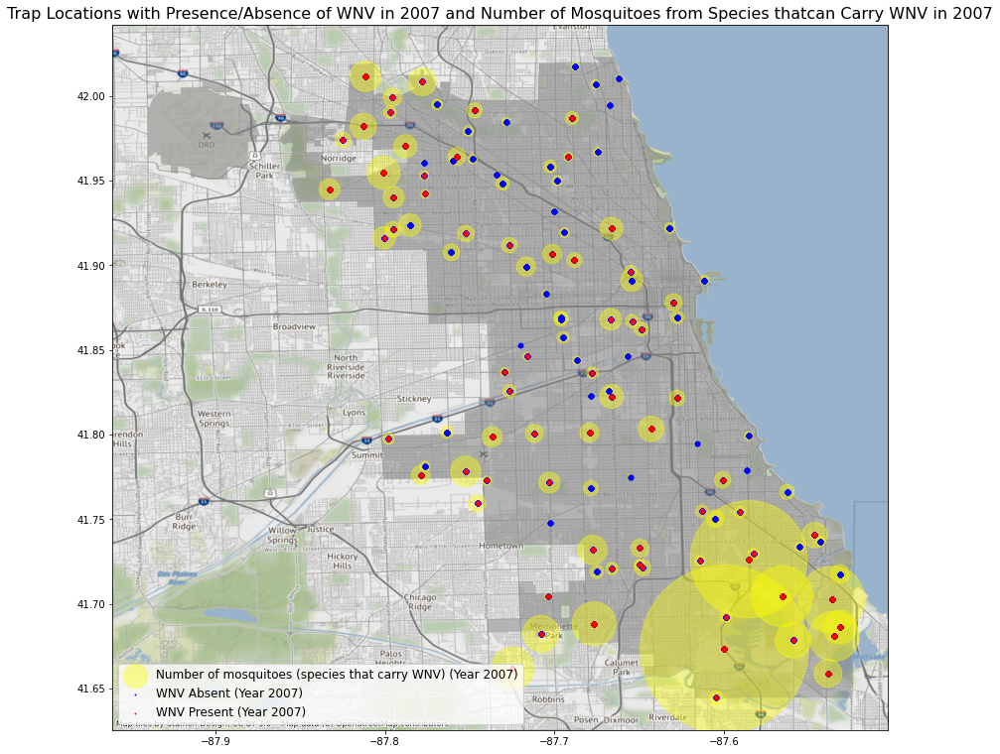

In [67]:
nummosq2007 = nummosquitotrap(2007)
nummosq2007_geometry = [Point(xy) for xy in zip(nummosq2007['longitude'], nummosq2007['latitude'])]
nummosq2007_gdf = gpd.GeoDataFrame(nummosq2007, crs = crs,  geometry = nummosq2007_geometry)

# Display number of WNV mosquitoes at each trap in year 2007
fig, ax = plt.subplots(figsize = (14, 14))
chicago_neighbourhoods.plot(ax = ax, alpha = 0.5, color = 'grey')
nummosq2007_gdf.plot(ax = ax, markersize = (nummosq2007_gdf['num_wnvmosquitos']*1.5), marker = "o", 
                     color = 'yellow', alpha = 0.4, label = 'Number of mosquitoes (species that carry WNV) (Year 2007)')
# Map trap locations with absence of WNV in 2007 in blue dots
# Map trap locations with presence of WNV in 2007 in red dots
train1_gdf[(train1_gdf['wnvpresent'] == 0) & (train1_gdf['year'] == 2007)].plot(ax = ax, 
                                                               markersize = 20, 
                                                               marker = "o", 
                                                               color = 'blue', 
                                                               label = 'WNV Absent (Year 2007)')

train1_gdf[(train1_gdf['wnvpresent'] == 1) & (train1_gdf['year'] == 2007)].plot(ax = ax, 
                                                               markersize = 20, 
                                                               marker = "o", 
                                                               color = 'red', 
                                                               label = 'WNV Present (Year 2007)')
cx.add_basemap(ax, crs = crs, zoom = 12)
plt.title('Trap Locations with Presence/Absence of WNV in 2007 and Number of Mosquitoes from Species that\
can Carry WNV in 2007', fontsize = 16)
plt.legend(loc = 3, markerscale = 0.2, fontsize = 'large')
plt.show()

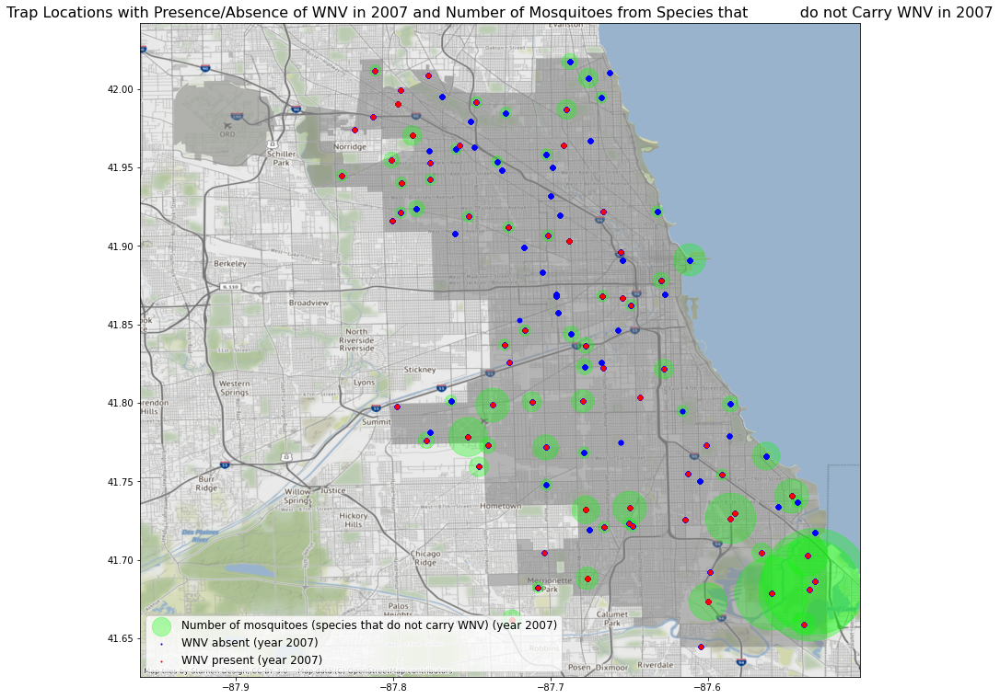

In [68]:
nummosq2007 = nummosquitotrap(2007)
nummosq2007_geometry = [Point(xy) for xy in zip(nummosq2007['longitude'], nummosq2007['latitude'])]
nummosq2007_gdf = gpd.GeoDataFrame(nummosq2007, crs = crs,  geometry = nummosq2007_geometry)

# Display number of Non-WNV mosquitoes at each trap in year 2007
# Marker_size is amplified due to the small number of Non-WNV mosquitoes
fig, ax = plt.subplots(figsize = (14, 14))
chicago_neighbourhoods.plot(ax = ax, alpha = 0.5, color = 'grey')
nummosq2007_gdf.plot(ax = ax, markersize = (nummosq2007_gdf['num_nonwnvmosquitos']*150), marker = "o", 
                     color = 'lime', alpha = 0.3, label = 'Number of mosquitoes (species that do not carry WNV) (year 2007)')
# Map trap locations with absence of WNV in 2007 in blue dots
# Map trap locations with presence of WNV in 2007 in red dots
train1_gdf[(train1_gdf['wnvpresent'] == 0) & (train1_gdf['year'] == 2007)].plot(ax = ax, 
                                                               markersize = 20, 
                                                               marker = "o", 
                                                               color = 'blue', 
                                                               label = 'WNV absent (year 2007)')

train1_gdf[(train1_gdf['wnvpresent'] == 1) & (train1_gdf['year'] == 2007)].plot(ax = ax, 
                                                               markersize = 20, 
                                                               marker = "o", 
                                                               color = 'red', 
                                                               label = 'WNV present (year 2007)')
cx.add_basemap(ax, crs = crs, zoom = 12)
plt.title('Trap Locations with Presence/Absence of WNV in 2007 and Number of Mosquitoes from Species that \
          do not Carry WNV in 2007', fontsize = 16)
plt.legend(loc = 3, markerscale = 0.25, fontsize = 'large')
plt.show()

The markersize of the green circles were amplified to make the traps with higher number of mosquitoes (from species that do not carry WNV) more visible due to small amount of these mosquitoes.

In [69]:
# Display number of traps set up in year 2007,
# find number of traps which had at least one occurence of wnvpresent = 1 in year 2007
# find number of traps which had no occurrences of wnvpresent = 1 in year 2007
trapwnvpresence(2007)

Total number of traps in year 2007: 116
Number of traps with at least one occurence of WNV present in year 2007: 69
Number of traps with no occurence of WNV present in year 2007: 47


In [70]:
# Display traps with the highest and lowest number of mosquitoes (species that can carry WNV) trapped
# in year 2007
topbottom5mosquitos(nummosq2007, 'num_wnvmosquitos', 'mosquitoes (species that can carry WNV)', 2007)

Traps with the highest number of mosquitoes (species that can carry WNV) trapped
in Year 2007:


,trap,num_wnvmosquitos,num_nonwnvmosquitos,longitude,latitude,geometry
101,T115,19123,11,-87.599862,41.673408,POINT (-87.59986 41.67341)
102,T138,9301,20,-87.585413,41.726465,POINT (-87.58541 41.72646)
110,T103,2975,13,-87.536497,41.702724,POINT (-87.53650 41.70272)
104,T128,2529,3,-87.565666,41.704572,POINT (-87.56567 41.70457)
99,T212,1703,82,-87.535198,41.680946,POINT (-87.53520 41.68095)


Traps with the lowest number of mosquitoes (species that can carry WNV) trapped
in Year 2007:


,trap,num_wnvmosquitos,num_nonwnvmosquitos,longitude,latitude,geometry
45,T040,6,0,-87.719887,41.852652,POINT (-87.71989 41.85265)
21,T149,14,1,-87.667736,41.994469,POINT (-87.66774 41.99447)
113,T078,17,0,-87.655356,41.775051,POINT (-87.65536 41.77505)
105,T072,18,1,-87.702716,41.747850,POINT (-87.70272 41.74785)
71,T060,21,2,-87.678378,41.823065,POINT (-87.67838 41.82306)


In [71]:
# Display traps with the highest and lowest number of mosquitoes (species that do not carry WNV) trapped
# in year 2007
topbottom5mosquitos(nummosq2007, 'num_nonwnvmosquitos', 'mosquitoes (species that do not carry WNV)', 2007)

Traps with the highest number of mosquitoes (species that do not carry WNV) trapped
in Year 2007:


,trap,num_wnvmosquitos,num_nonwnvmosquitos,longitude,latitude,geometry
100,T215,764,88,-87.531635,41.686398,POINT (-87.53163 41.68640)
99,T212,1703,82,-87.535198,41.680946,POINT (-87.53520 41.68095)
96,T200,857,42,-87.559308,41.678618,POINT (-87.55931 41.67862)
102,T138,9301,20,-87.585413,41.726465,POINT (-87.58541 41.72646)
110,T103,2975,13,-87.536497,41.702724,POINT (-87.53650 41.70272)


Traps with the lowest number of mosquitoes (species that do not carry WNV) trapped
in Year 2007:


,trap,num_wnvmosquitos,num_nonwnvmosquitos,longitude,latitude,geometry
57,T008,526,0,-87.777921,42.008314,POINT (-87.77792 42.00831)
37,T019,72,0,-87.698457,41.949830,POINT (-87.69846 41.94983)
41,T147,27,0,-87.700117,41.932094,POINT (-87.70012 41.93209)
44,T088,125,0,-87.696293,41.869107,POINT (-87.69629 41.86911)
45,T040,6,0,-87.719887,41.852652,POINT (-87.71989 41.85265)


Out of 116 traps that caught at least one mosquito in year 2007, 69 traps (59.5% of traps) had at least one occurence of WNV present and 47 traps (40.5% of traps) had no occurence of WNV present in year 2007.

From the 1st map showing the number of mosquitoes (species that can carry WNV) trapped by each trap in 2007:
- The south-east tip of Chicago has a much higher number of mosquitoes (species that can carry WNV) than the rest of Chicago. The north-west tip of Chicago has the next highest number of mosquitoes (species that can carry WNV).
- The 5 traps with the highest number of mosquitoes (species that can carry WNV), namely T115, T138, T103, T128 and T212 trapped are all located in the south-east tip of Chicago.

From the 2nd map showing the number of mosquitoes (species that do not carry WNV) trapped by each trap in 2007:
- The south-east tip of Chicago has a much higher number of mosquitoes (species that do not carry WNV) than the rest of Chicago. The south-west edge of Chicago has the next highest number of mosquitoes (species that do not carry WNV).
- The 5 traps with the highest number of mosquitoes (species that do not carry WNV), namely T215, T212, T200, T138 and T103 trapped are all located in the south-east tip of Chicago.

<div id="wnv2009"></div>

### Visualise Trap Locations with Presence/Absence of WNV and Number of Mosquitoes from Species that Carry/Do Not Carry WNV in Year 2009

We will visualise Trap Locations with Presence/Absence of WNV and Number of Mosquitoes from Species that Carry/Do Not Carry WNV in Year 2009.
- 1st map for number of mosquitoes (from species that can carry the WNV) trapped by each trap in 2009 (represented by yellow circles) & the trap locations with presence/absence of WNV). The larger the size of yellow circles, the higher the number of mosquitoes (from species that can carry the WNV) trapped by each trap in 2009.
- 2nd map for number of mosquitoes (from species that do not carry the WNV) trapped by each trap in 2009 (represented by green circles) & the trap locations with presence/absence of WNV). The larger the size of green circles, the higher the number of mosquitoes (from species that do not carry the WNV) trapped by each trap in 2009.

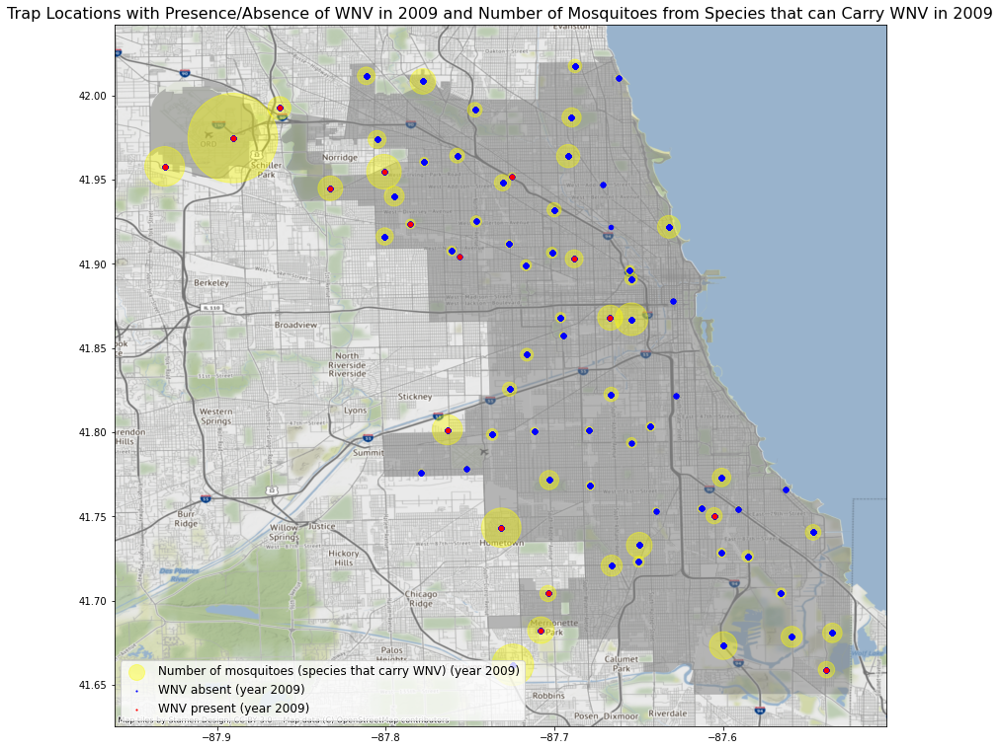

In [72]:
# Map Trap Locations with Presence/Absence of WNV and Number of Mosquitoes from Species that Carry/Do Not Carry WNV in Year 2009
nummosq2009 = nummosquitotrap(2009)
nummosq2009_geometry = [Point(xy) for xy in zip(nummosq2009['longitude'], nummosq2009['latitude'])]
nummosq2009_gdf = gpd.GeoDataFrame(nummosq2009, crs = crs,  geometry = nummosq2009_geometry)

# Display number of WNV mosquitoes at each trap in year 2009
fig, ax = plt.subplots(figsize = (14, 14))
chicago_neighbourhoods.plot(ax = ax, alpha = 0.5, color = 'grey')
nummosq2009_gdf.plot(ax = ax, markersize = (nummosq2009_gdf['num_wnvmosquitos']*1.5), marker = "o", 
                     color = 'yellow', alpha = 0.4, label = 'Number of mosquitoes (species that carry WNV) (year 2009)')
# Map trap locations with absence of WNV in 2009 in blue dots
# Map trap locations with presence of WNV in 2009 in red dots
train1_gdf[(train1_gdf['wnvpresent'] == 0) & (train1_gdf['year'] == 2009)].plot(ax = ax, 
                                                               markersize = 20, 
                                                               marker = "o", 
                                                               color = 'blue', 
                                                               label = 'WNV absent (year 2009)')

train1_gdf[(train1_gdf['wnvpresent'] == 1) & (train1_gdf['year'] == 2009)].plot(ax = ax, 
                                                               markersize = 20, 
                                                               marker = "o", 
                                                               color = 'red', 
                                                               label = 'WNV present (year 2009)')
cx.add_basemap(ax, crs = crs, zoom = 12)
plt.title('Trap Locations with Presence/Absence of WNV in 2009 and Number of Mosquitoes from Species that \
can Carry WNV in 2009', fontsize = 16)
plt.legend(loc = 3, markerscale = 0.25, fontsize = 'large')
plt.show()

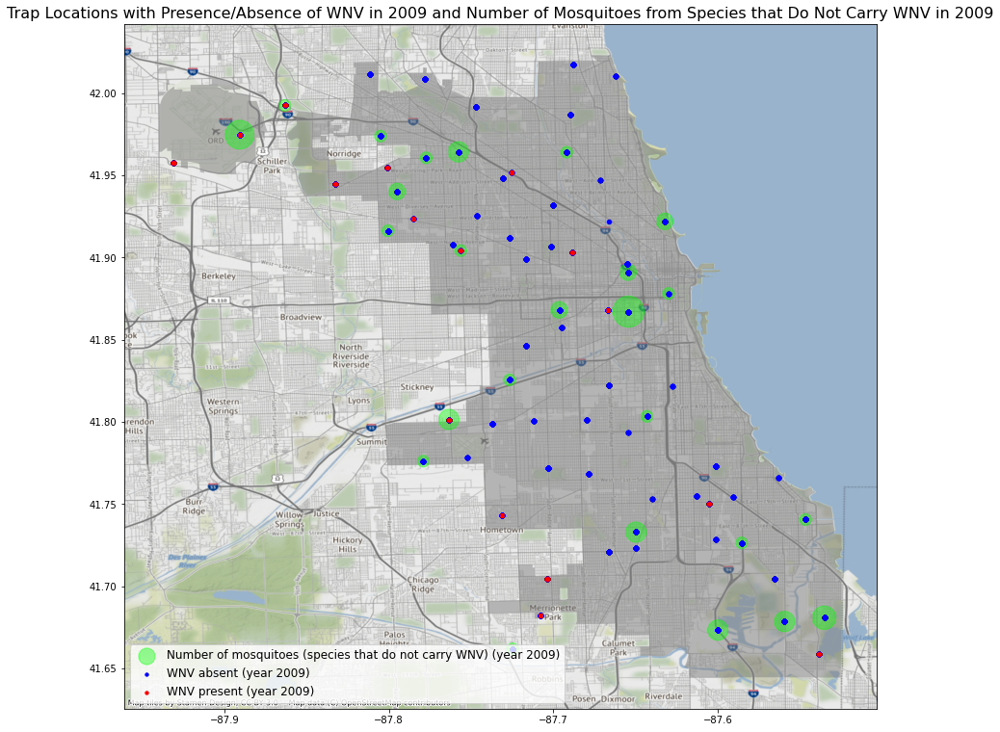

In [73]:
# Map Trap Locations with Presence/Absence of WNV and Number of Mosquitoes from Species that do not carry WNV in Year 2009
nummosq2009 = nummosquitotrap(2009)
nummosq2009_geometry = [Point(xy) for xy in zip(nummosq2009['longitude'], nummosq2009['latitude'])]
nummosq2009_gdf = gpd.GeoDataFrame(nummosq2009, crs = crs,  geometry = nummosq2009_geometry)

# Display number of non-WNV mosquitoes at each trap in year 2009
fig, ax = plt.subplots(figsize = (14, 14))
chicago_neighbourhoods.plot(ax = ax, alpha = 0.5, color = 'grey')
nummosq2009_gdf.plot(ax = ax, markersize = (nummosq2009_gdf['num_nonwnvmosquitos']*150), marker = "o", 
                     color = 'lime', alpha = 0.4, label = 'Number of mosquitoes (species that do not carry WNV) (year 2009)')
# Map trap locations with absence of WNV in 2009 in blue dots
# Map trap locations with presence of WNV in 2009 in red dots
train1_gdf[(train1_gdf['wnvpresent'] == 0) & (train1_gdf['year'] == 2009)].plot(ax = ax, 
                                                               markersize = 20, 
                                                               marker = "o", 
                                                               color = 'blue', 
                                                               label = 'WNV absent (year 2009)')

train1_gdf[(train1_gdf['wnvpresent'] == 1) & (train1_gdf['year'] == 2009)].plot(ax = ax, 
                                                               markersize = 20, 
                                                               marker = "o", 
                                                               color = 'red', 
                                                               label = 'WNV present (year 2009)')
cx.add_basemap(ax, crs = crs, zoom = 12)
plt.title('Trap Locations with Presence/Absence of WNV in 2009 and Number of Mosquitoes from Species that \
Do Not Carry WNV in 2009', fontsize = 16)
plt.legend(loc = 3, markerscale = 0.75, fontsize = 'large')
plt.show()

In [74]:
# Display number of traps set up in year 2009,
# find number of traps which had at least one occurence of wnvpresent = 1 in year 2009
# find number of traps which had no occurrences of wnvpresent = 1 in year 2009
trapwnvpresence(2009)

Total number of traps in year 2009: 73
Number of traps with at least one occurence of WNV present in year 2009: 16
Number of traps with no occurence of WNV present in year 2009: 57


In [75]:
# Display traps with the highest and lowest number of mosquitoes (species that can carry WNV) trapped
# in year 2009
topbottom5mosquitos(nummosq2009, 'num_wnvmosquitos', 'mosquitoes (species that can carry WNV)', 2009)

# Display traps with the highest and lowest number of mosquitoes (species that do not carry WNV) trapped
# in year 2009
topbottom5mosquitos(nummosq2009, 'num_nonwnvmosquitos', 'mosquitoes (species that do not carry WNV)', 2009)

Traps with the highest number of mosquitoes (species that can carry WNV) trapped
in Year 2009:


,trap,num_wnvmosquitos,num_nonwnvmosquitos,longitude,latitude,geometry
40,T900,5482,6,-87.890615,41.974689,POINT (-87.89061 41.97469)
1,T135,1177,1,-87.724608,41.662014,POINT (-87.72461 41.66201)
55,T903,1079,0,-87.930995,41.957799,POINT (-87.93099 41.95780)
65,T225,1060,0,-87.731435,41.743402,POINT (-87.73144 41.74340)
29,T002,818,0,-87.800991,41.954690,POINT (-87.80099 41.95469)


Traps with the lowest number of mosquitoes (species that can carry WNV) trapped
in Year 2009:


,trap,num_wnvmosquitos,num_nonwnvmosquitos,longitude,latitude,geometry
6,T045,1,0,-87.666455,41.921600,POINT (-87.66645 41.92160)
62,T145,10,1,-87.629798,41.878114,POINT (-87.62980 41.87811)
68,T224,11,0,-87.671457,41.947227,POINT (-87.67146 41.94723)
60,T081,13,0,-87.627796,41.821582,POINT (-87.62780 41.82158)
12,T079,14,0,-87.562889,41.766202,POINT (-87.56289 41.76620)


Traps with the highest number of mosquitoes (species that do not carry WNV) trapped
in Year 2009:


,trap,num_wnvmosquitos,num_nonwnvmosquitos,longitude,latitude,geometry
43,T048,732,7,-87.654224,41.867108,POINT (-87.65422 41.86711)
40,T900,5482,6,-87.890615,41.974689,POINT (-87.89061 41.97469)
23,T212,259,4,-87.535198,41.680946,POINT (-87.53520 41.68095)
19,T159,453,3,-87.649642,41.732984,POINT (-87.64964 41.73298)
30,T003,150,3,-87.757639,41.964242,POINT (-87.75764 41.96424)


Traps with the lowest number of mosquitoes (species that do not carry WNV) trapped
in Year 2009:


,trap,num_wnvmosquitos,num_nonwnvmosquitos,longitude,latitude,geometry
72,T228,39,0,-87.725057,41.951866,POINT (-87.72506 41.95187)
27,T114,92,0,-87.736812,41.798697,POINT (-87.73681 41.79870)
60,T081,13,0,-87.627796,41.821582,POINT (-87.62780 41.82158)
29,T002,818,0,-87.800991,41.954690,POINT (-87.80099 41.95469)
59,T080,36,0,-87.612922,41.754676,POINT (-87.61292 41.75468)


Out of 73 traps that caught at least one mosquito in year 2009, 16 traps (21.9% of traps) had at least one occurence of WNV present and 57 traps (78.1% of traps) had no occurence of WNV present in year 2009.

From the 1st map showing the number of mosquitoes (species that can carry WNV) trapped by each trap in 2009:
- The north-west tip of Chicago has a higher number of mosquitoes (species that can carry WNV) than the rest of Chicago. The south of Chicago has the next highest number of mosquitoes (species that can carry WNV).
- 3 of the 5 traps with the highest number of mosquitoes (species that can carry WNV), namely T900, T903, T002, are located in the north-west tip of Chicago.
- 2 of the 5 traps with the highest number of mosquitoes (species that can carry WNV), namely T135, T225, are located in the south-east tip of Chicago.

From the 2nd map showing the number of mosquitoes (species that do not carry WNV) trapped by each trap in 2009:
- The north-west, south-east tip and centre of Chicago has small concentrations of a higher number of mosquitoes (species that do not carry WNV) than the rest of Chicago. 


<div id="wnv2011"></div>

### Visualise Trap Locations with Presence/Absence of WNV and Number of Mosquitoes from Species that Carry/Do Not Carry WNV in Year 2011

We will visualise Trap Locations with Presence/Absence of WNV and Number of Mosquitoes from Species that Carry/Do Not Carry WNV in Year 2011.
- 1st map for number of mosquitoes (from species that can carry the WNV) trapped by each trap in 2011 (represented by yellow circles) & the trap locations with presence/absence of WNV). The larger the size of yellow circles, the higher the number of mosquitoes (from species that can carry the WNV) trapped by each trap in 2011.
- 2nd map for number of mosquitoes (from species that do not carry the WNV) trapped by each trap in 2011 (represented by green circles) & the trap locations with presence/absence of WNV). The larger the size of green circles, the higher the number of mosquitoes (from species that do not carry the WNV) trapped by each trap in 2011.

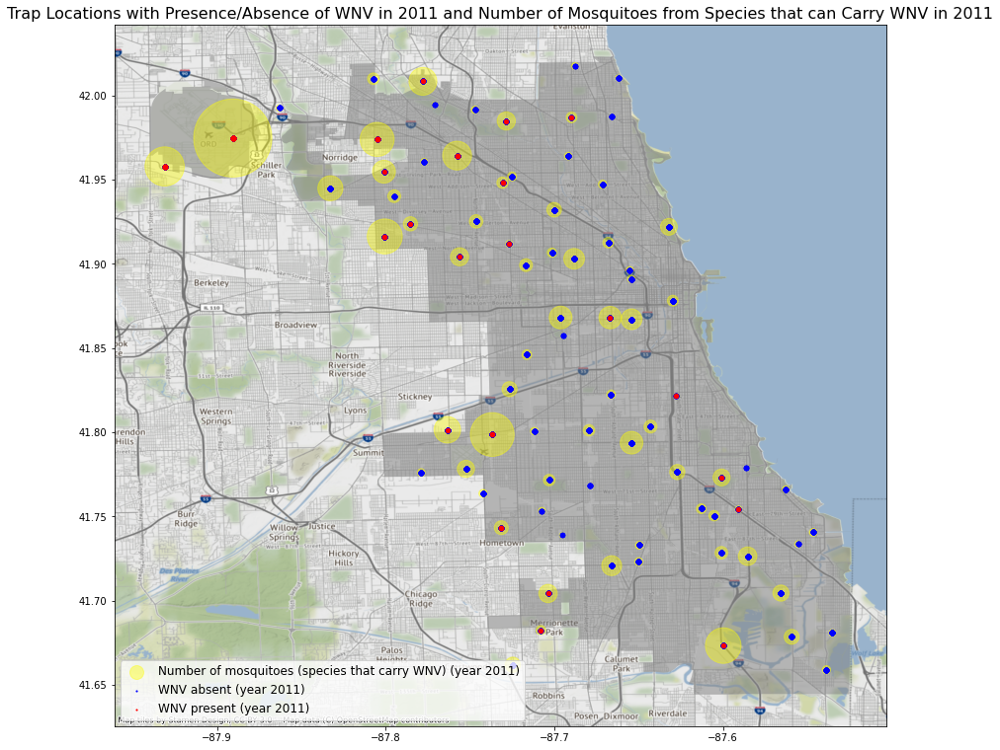

In [76]:
# Map Trap Locations with Presence/Absence of WNV and Number of Mosquitoes from Species that Carry/
# Do Not Carry WNV in Year 2011
nummosq2011 = nummosquitotrap(2011)
nummosq2011_geometry = [Point(xy) for xy in zip(nummosq2011['longitude'], nummosq2011['latitude'])]
nummosq2011_gdf = gpd.GeoDataFrame(nummosq2011, crs = crs,  geometry = nummosq2011_geometry)

# Display number of WNV mosquitoes at each trap in year 2011
fig, ax = plt.subplots(figsize = (14, 14))
chicago_neighbourhoods.plot(ax = ax, alpha = 0.5, color = 'grey')
nummosq2011_gdf.plot(ax = ax, markersize = (nummosq2011_gdf['num_wnvmosquitos']*1.5), marker = "o", 
                     color = 'yellow', alpha = 0.4, label = 'Number of mosquitoes (species that carry WNV) (year 2011)')
# Map trap locations with absence of WNV in 2011 in blue dots
# Map trap locations with presence of WNV in 2011 in red dots
train1_gdf[(train1_gdf['wnvpresent'] == 0) & (train1_gdf['year'] == 2011)].plot(ax = ax, 
                                                               markersize = 20, 
                                                               marker = "o", 
                                                               color = 'blue', 
                                                               label = 'WNV absent (year 2011)')

train1_gdf[(train1_gdf['wnvpresent'] == 1) & (train1_gdf['year'] == 2011)].plot(ax = ax, 
                                                               markersize = 20, 
                                                               marker = "o", 
                                                               color = 'red', 
                                                               label = 'WNV present (year 2011)')
cx.add_basemap(ax, crs = crs, zoom = 12)
plt.title('Trap Locations with Presence/Absence of WNV in 2011 and Number of Mosquitoes from Species \
that can Carry WNV in 2011', fontsize = 16)
plt.legend(loc = 3, markerscale = 0.25, fontsize = 'large')
plt.show()

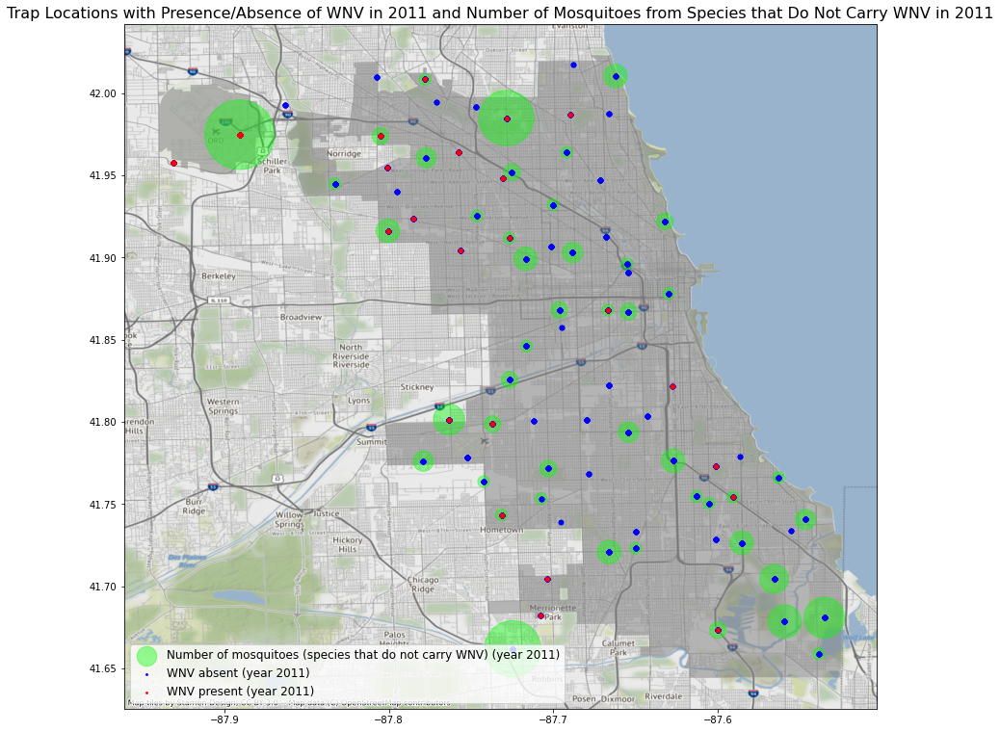

In [77]:
# Map Trap Locations with Presence/Absence of WNV and Number of Mosquitoes from Species that do not carry WNV in Year 2011
nummosq2011 = nummosquitotrap(2011)
nummosq2011_geometry = [Point(xy) for xy in zip(nummosq2011['longitude'], nummosq2011['latitude'])]
nummosq2011_gdf = gpd.GeoDataFrame(nummosq2011, crs = crs,  geometry = nummosq2011_geometry)

# Display number of non-WNV mosquitoes at each trap in year 2011
fig, ax = plt.subplots(figsize = (14, 14))
chicago_neighbourhoods.plot(ax = ax, alpha = 0.5, color = 'grey')
nummosq2011_gdf.plot(ax = ax, markersize = (nummosq2011_gdf['num_nonwnvmosquitos']*150), marker = "o", 
                     color = 'lime', alpha = 0.4, label = 'Number of mosquitoes (species that do not carry WNV) (year 2011)')
# Map trap locations with absence of WNV in 2011 in blue dots
# Map trap locations with presence of WNV in 2011 in red dots
train1_gdf[(train1_gdf['wnvpresent'] == 0) & (train1_gdf['year'] == 2011)].plot(ax = ax, 
                                                               markersize = 20, 
                                                               marker = "o", 
                                                               color = 'blue', 
                                                               label = 'WNV absent (year 2011)')

train1_gdf[(train1_gdf['wnvpresent'] == 1) & (train1_gdf['year'] == 2011)].plot(ax = ax, 
                                                               markersize = 20, 
                                                               marker = "o", 
                                                               color = 'red', 
                                                               label = 'WNV present (year 2011)')
cx.add_basemap(ax, crs = crs, zoom = 12)
plt.title('Trap Locations with Presence/Absence of WNV in 2011 and Number of Mosquitoes from Species that \
Do Not Carry WNV in 2011', fontsize = 16)
plt.legend(loc = 3, markerscale = 0.4, fontsize = 'large')
plt.show()

In [78]:
# Display number of traps set up in year 2011,
# find number of traps which had at least one occurence of wnvpresent = 1 in year 2011
# find number of traps which had no occurrences of wnvpresent = 1 in year 2011
trapwnvpresence(2011)

Total number of traps in year 2011: 80
Number of traps with at least one occurence of WNV present in year 2011: 23
Number of traps with no occurence of WNV present in year 2011: 57


In [79]:
# Display traps with the highest and lowest number of mosquitoes (species that can carry WNV) trapped
# in year 2011
topbottom5mosquitos(nummosq2011, 'num_wnvmosquitos', 'mosquitoes (species that can carry WNV)', 2011)

# Display traps with the highest and lowest number of mosquitoes (species that do not carry WNV) trapped
# in year 2011
topbottom5mosquitos(nummosq2011, 'num_nonwnvmosquitos', 'mosquitoes (species that do not carry WNV)', 2011)

Traps with the highest number of mosquitoes (species that can carry WNV) trapped
in Year 2011:


,trap,num_wnvmosquitos,num_nonwnvmosquitos,longitude,latitude,geometry
0,T900,4174,35,-87.890615,41.974689,POINT (-87.89061 41.97469)
38,T114,1311,2,-87.736812,41.798697,POINT (-87.73681 41.79870)
1,T903,1054,0,-87.930995,41.957799,POINT (-87.93099 41.95780)
19,T115,869,2,-87.599862,41.673408,POINT (-87.59986 41.67341)
11,T151,841,4,-87.800515,41.916265,POINT (-87.80052 41.91627)


Traps with the lowest number of mosquitoes (species that can carry WNV) trapped
in Year 2011:


,trap,num_wnvmosquitos,num_nonwnvmosquitos,longitude,latitude,geometry
75,T043,5,0,-87.694991,41.857402,POINT (-87.69499 41.85740)
65,T077,9,0,-87.586427,41.778748,POINT (-87.58643 41.77875)
36,T069,14,0,-87.678649,41.768388,POINT (-87.67865 41.76839)
59,T231,15,0,-87.666066,41.987280,POINT (-87.66607 41.98728)
77,T236,17,0,-87.770899,41.994679,POINT (-87.77090 41.99468)


Traps with the highest number of mosquitoes (species that do not carry WNV) trapped
in Year 2011:


,trap,num_wnvmosquitos,num_nonwnvmosquitos,longitude,latitude,geometry
0,T900,4174,35,-87.890615,41.974689,POINT (-87.89061 41.97469)
40,T135,162,23,-87.724608,41.662014,POINT (-87.72461 41.66201)
9,T027,228,22,-87.728492,41.984809,POINT (-87.72849 41.98481)
25,T212,32,12,-87.535198,41.680946,POINT (-87.53520 41.68095)
43,T200,154,8,-87.559308,41.678618,POINT (-87.55931 41.67862)


Traps with the lowest number of mosquitoes (species that do not carry WNV) trapped
in Year 2011:


,trap,num_wnvmosquitos,num_nonwnvmosquitos,longitude,latitude,geometry
36,T069,14,0,-87.678649,41.768388,POINT (-87.67865 41.76839)
75,T043,5,0,-87.694991,41.857402,POINT (-87.69499 41.85740)
26,T230,227,0,-87.756155,41.904194,POINT (-87.75616 41.90419)
31,T046,38,0,-87.654491,41.891118,POINT (-87.65449 41.89112)
34,T061,92,0,-87.679447,41.801179,POINT (-87.67945 41.80118)


Out of 80 traps that caught at least one mosquito in year 2011, 23 traps (28.8% of traps) had at least one occurence of WNV present and 57 traps (71.2% of traps) had no occurence of WNV present in year 2011.

From the 1st map showing the number of mosquitoes (species that can carry WNV) trapped by each trap in 2011:
- The north-west tip of Chicago has a higher concentrations of higher number of mosquitoes (species that can carry WNV). The central of Chicago has the next highest number of mosquitoes (species that can carry WNV), followed by south-east Chicago.
- 3 of the 5 traps with the highest number of mosquitoes (species that can carry WNV), namely T900, T903, T151, are located in the north-west tip of Chicago.
- 1 of the 5 traps with the highest number of mosquitoes (species that can carry WNV), namely T114, is located in central of Chicago.
- 1 of the 5 traps with the highest number of mosquitoes (species that can carry WNV), namely T115, is located in the south-east tip of Chicago.


From the 2nd map showing the number of mosquitoes (species that do not carry WNV) trapped by each trap in 2011:
- The north and south of Chicago have concentrations of higher number of mosquitoes (species that do not carry WNV) than the rest of Chicago. 

<div id="wnv2013"></div>

### Visualise Trap Locations with Presence/Absence of WNV and Number of Mosquitoes from Species that Carry/Do Not Carry WNV in Year 2013

We will visualise Trap Locations with Presence/Absence of WNV and Number of Mosquitoes from Species that Carry/Do Not Carry WNV in Year 2013.
- 1st map for number of mosquitoes (from species that can carry the WNV) trapped by each trap in 2013 (represented by yellow circles) & the trap locations with presence/absence of WNV). The larger the size of yellow circles, the higher the number of mosquitoes (from species that can carry the WNV) trapped by each trap in 2013.
- 2nd map for number of mosquitoes (from species that do not carry the WNV) trapped by each trap in 2013 (represented by green circles) & the trap locations with presence/absence of WNV). The larger the size of green circles, the higher the number of mosquitoes (from species that do not carry the WNV) trapped by each trap in 2013.

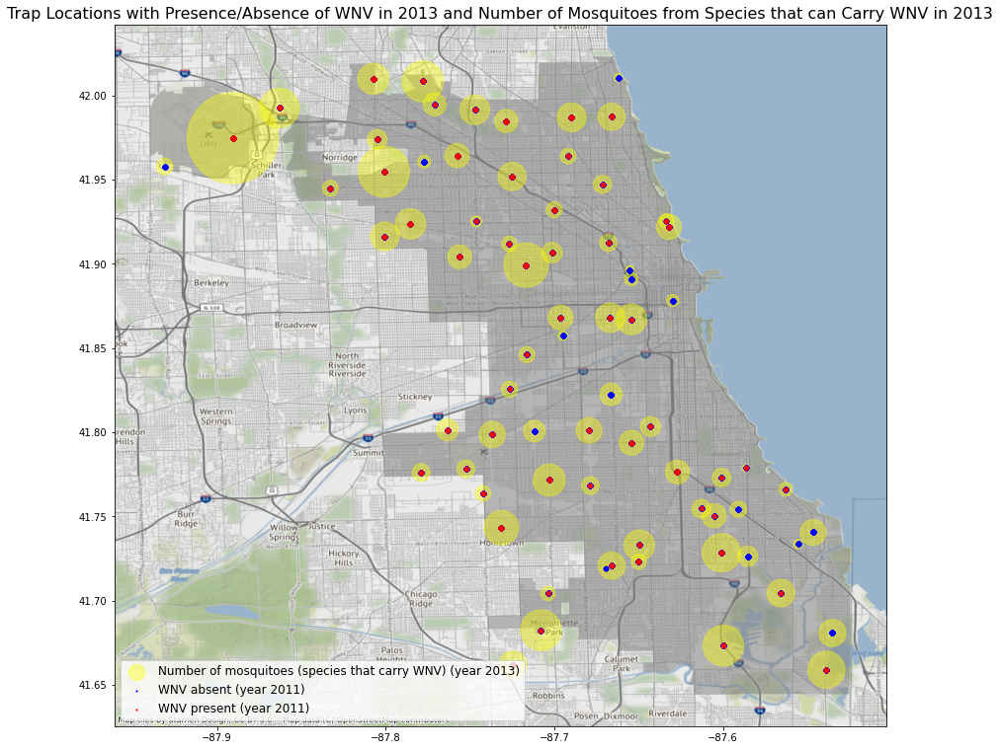

In [80]:
# Map Trap Locations with Presence/Absence of WNV and Number of Mosquitoes from Species that 
# Carry/Do Not Carry WNV in Year 2013
nummosq2013 = nummosquitotrap(2013)
nummosq2013_geometry = [Point(xy) for xy in zip(nummosq2013['longitude'], nummosq2013['latitude'])]
nummosq2013_gdf = gpd.GeoDataFrame(nummosq2013, crs = crs,  geometry = nummosq2013_geometry)

# Display number of WNV mosquitoes at each trap in year 2013
fig, ax = plt.subplots(figsize = (14, 14))
chicago_neighbourhoods.plot(ax = ax, alpha = 0.5, color = 'grey')
nummosq2013_gdf.plot(ax = ax, markersize = (nummosq2013_gdf['num_wnvmosquitos']*1.5), marker = "o", 
                     color = 'yellow', alpha = 0.4, label = 'Number of mosquitoes (species that carry WNV) (year 2013)')
# Map trap locations with absence of WNV in 2013 in blue dots
# Map trap locations with presence of WNV in 2013 in red dots
train1_gdf[(train1_gdf['wnvpresent'] == 0) & (train1_gdf['year'] == 2013)].plot(ax = ax, 
                                                               markersize = 20, 
                                                               marker = "o", 
                                                               color = 'blue', 
                                                               label = 'WNV absent (year 2011)')

train1_gdf[(train1_gdf['wnvpresent'] == 1) & (train1_gdf['year'] == 2013)].plot(ax = ax, 
                                                               markersize = 20, 
                                                               marker = "o", 
                                                               color = 'red', 
                                                               label = 'WNV present (year 2011)')
cx.add_basemap(ax, crs = crs, zoom = 12)
plt.title('Trap Locations with Presence/Absence of WNV in 2013 and Number of Mosquitoes from \
Species that can Carry WNV in 2013', fontsize = 16)
plt.legend(loc = 3, markerscale = 0.25, fontsize = 'large')
plt.show()

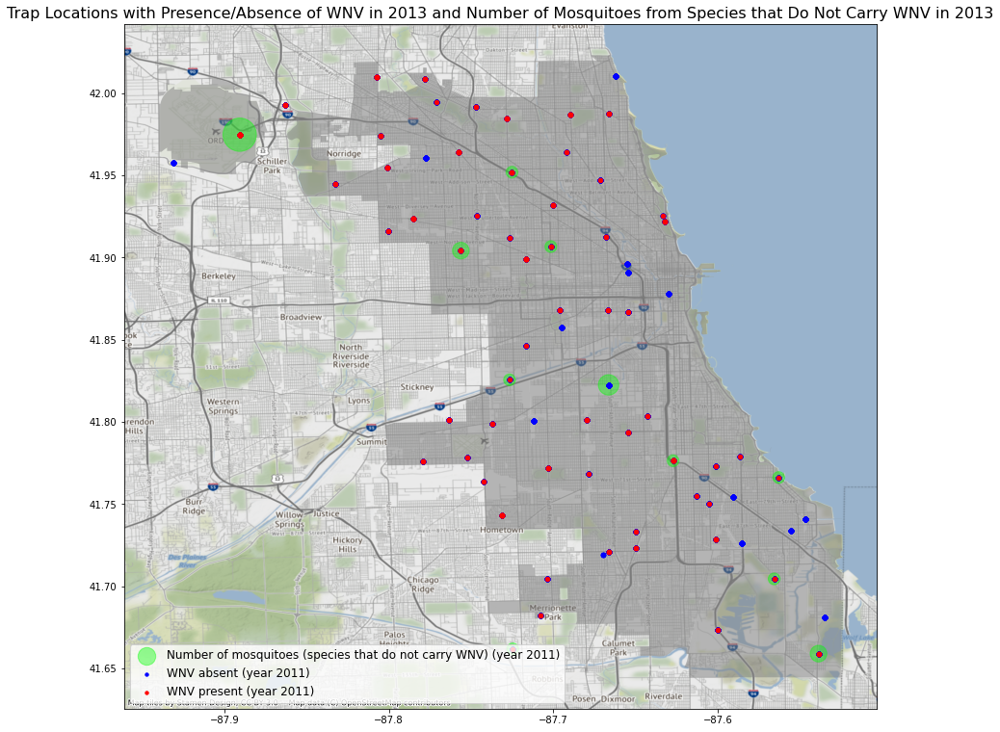

In [81]:
# Map Trap Locations with Presence/Absence of WNV and Number of Mosquitoes from Species that do not carry WNV in Year 2013
nummosq2013 = nummosquitotrap(2013)
nummosq2013_geometry = [Point(xy) for xy in zip(nummosq2013['longitude'], nummosq2013['latitude'])]
nummosq2013_gdf = gpd.GeoDataFrame(nummosq2013, crs = crs,  geometry = nummosq2013_geometry)

# Display number of non-WNV mosquitoes at each trap in year 2013
fig, ax = plt.subplots(figsize = (14, 14))
chicago_neighbourhoods.plot(ax = ax, alpha = 0.5, color = 'grey')
nummosq2013_gdf.plot(ax = ax, markersize = (nummosq2013_gdf['num_nonwnvmosquitos']*150), marker = "o", 
                     color = 'lime', alpha = 0.4, label = 'Number of mosquitoes (species that do not carry WNV) (year 2011)')
# Map trap locations with absence of WNV in 2013 in blue dots
# Map trap locations with presence of WNV in 2013 in red dots
train1_gdf[(train1_gdf['wnvpresent'] == 0) & (train1_gdf['year'] == 2013)].plot(ax = ax, 
                                                               markersize = 20, 
                                                               marker = "o", 
                                                               color = 'blue', 
                                                               label = 'WNV absent (year 2011)')

train1_gdf[(train1_gdf['wnvpresent'] == 1) & (train1_gdf['year'] == 2013)].plot(ax = ax, 
                                                               markersize = 20, 
                                                               marker = "o", 
                                                               color = 'red', 
                                                               label = 'WNV present (year 2011)')
cx.add_basemap(ax, crs = crs, zoom = 12)
plt.title('Trap Locations with Presence/Absence of WNV in 2013 and Number of Mosquitoes from Species that \
Do Not Carry WNV in 2013', fontsize = 16)
plt.legend(loc = 3, markerscale = 0.75, fontsize = 'large')
plt.show()

In [82]:
# Display number of traps set up in year 2013,
# find number of traps which had at least one occurence of wnvpresent = 1 in year 2013
# find number of traps which had no occurrences of wnvpresent = 1 in year 2013
trapwnvpresence(2013)

Total number of traps in year 2013: 74
Number of traps with at least one occurence of WNV present in year 2013: 59
Number of traps with no occurence of WNV present in year 2013: 15


In [83]:
# Display traps with the highest and lowest number of mosquitoes (species that can carry WNV) trapped
# in year 2013
topbottom5mosquitos(nummosq2013, 'num_wnvmosquitos', 'mosquitoes (species that can carry WNV)', 2013)

# Display traps with the highest and lowest number of mosquitoes (species that do not carry WNV) trapped
# in year 2013
topbottom5mosquitos(nummosq2013, 'num_nonwnvmosquitos', 'mosquitoes (species that do not carry WNV)', 2013)

Traps with the highest number of mosquitoes (species that can carry WNV) trapped
in Year 2013:


,trap,num_wnvmosquitos,num_nonwnvmosquitos,longitude,latitude,geometry
6,T900,5681,8,-87.890615,41.974689,POINT (-87.89061 41.97469)
8,T002,1792,0,-87.800991,41.954690,POINT (-87.80099 41.95469)
32,T030,1355,0,-87.716788,41.899230,POINT (-87.71679 41.89923)
9,T008,1162,0,-87.777921,42.008314,POINT (-87.77792 42.00831)
49,T158,1140,0,-87.707973,41.682587,POINT (-87.70797 41.68259)


Traps with the lowest number of mosquitoes (species that can carry WNV) trapped
in Year 2013:


,trap,num_wnvmosquitos,num_nonwnvmosquitos,longitude,latitude,geometry
71,T077,38,0,-87.586427,41.778748,POINT (-87.58643 41.77875)
72,T094B,41,0,-87.669539,41.719140,POINT (-87.66954 41.71914)
2,T018,50,0,-87.662140,42.010412,POINT (-87.66214 42.01041)
70,T049,57,0,-87.655232,41.896282,POINT (-87.65523 41.89628)
43,T099,58,0,-87.555510,41.733643,POINT (-87.55551 41.73364)


Traps with the highest number of mosquitoes (species that do not carry WNV) trapped
in Year 2013:


,trap,num_wnvmosquitos,num_nonwnvmosquitos,longitude,latitude,geometry
6,T900,5681,8,-87.890615,41.974689,POINT (-87.89061 41.97469)
19,T074,340,3,-87.666343,41.822536,POINT (-87.66634 41.82254)
64,T221,932,2,-87.538693,41.659112,POINT (-87.53869 41.65911)
30,T230,391,2,-87.756155,41.904194,POINT (-87.75616 41.90419)
31,T235,394,1,-87.627096,41.776428,POINT (-87.62710 41.77643)


Traps with the lowest number of mosquitoes (species that do not carry WNV) trapped
in Year 2013:


,trap,num_wnvmosquitos,num_nonwnvmosquitos,longitude,latitude,geometry
0,T009,1085,0,-87.862995,41.992478,POINT (-87.86299 41.99248)
72,T094B,41,0,-87.669539,41.719140,POINT (-87.66954 41.71914)
37,T061,453,0,-87.679447,41.801179,POINT (-87.67945 41.80118)
38,T066,706,0,-87.703047,41.771660,POINT (-87.70305 41.77166)
39,T080,242,0,-87.612922,41.754676,POINT (-87.61292 41.75468)


Out of 74 traps that caught at least one mosquito in year 2013, 59 traps (79.7% of traps) had at least one occurence of WNV present and 15 traps (20.3% of traps) had no occurence of WNV present in year 2013.


From the 1st map showing the number of mosquitoes (species that can carry WNV) trapped by each trap in 2013:
- The north of Chicago has the highest concentration of higher number of mosquitoes (species that can carry WNV) than the rest of Chicago. The south of Chicago has the next highest concentraion of higher number of mosquitoes (species that can carry WNV).
- 4 out of the 5 traps with the highest number of mosquitoes (species that can carry WNV), namely T900, T002, T030 and T008, are located in the north tip of Chicago.
- 1 out of the 5 traps with the highest number of mosquitoes (species that can carry WNV), namely T158, is located in the south-east tip of Chicago.



From the 2nd map showing the number of mosquitoes (species that do not carry WNV) trapped by each trap in 2013:
- The northwest tip of Chicago has the highest concentration of higher number of mosquitoes (species that do not carry WNV) than the rest of Chicago. The central and south-east of Chicago have the next highest concentration of number of mosquitoes (species that do not carry WNV).

<div id="multicoll"></div>

## Check for Multicollinearity between Predictor Variables

Look at correlation between predictor variables in the weather1 dataframe and remove predictor variables that have high multicollinearity.

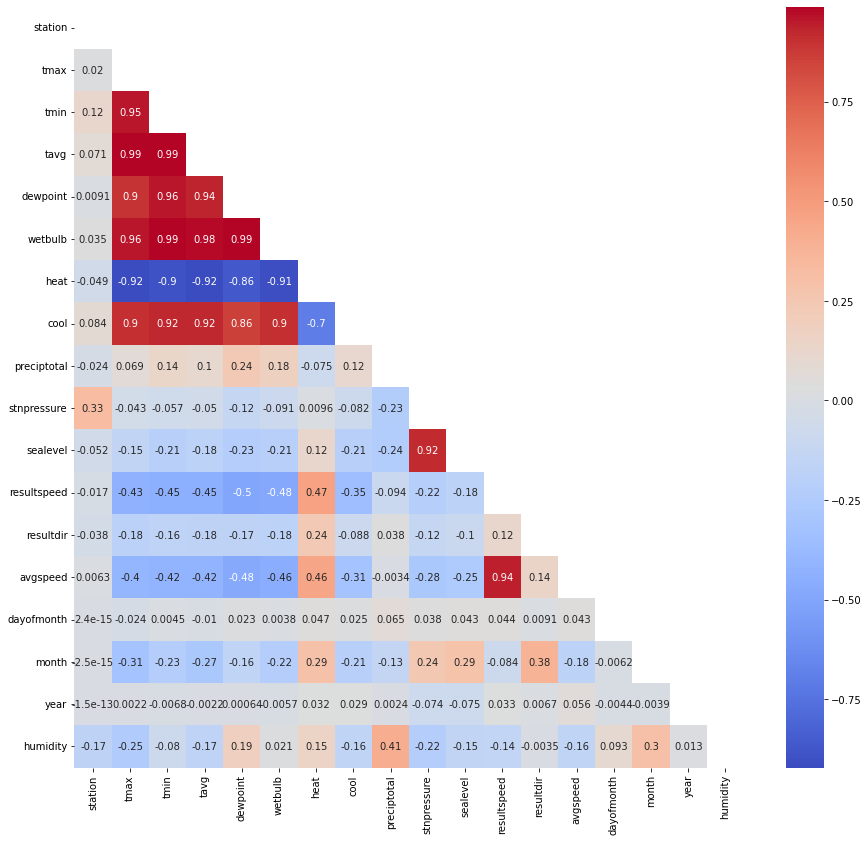

In [84]:
# Create mask to hide the upper triangle of correlation matrix
mask = np.zeros_like(weather1.corr())
mask[np.triu_indices_from(mask)] = True

# Plot correlation matrix of weather dataframe
plt.figure(figsize=(15,14))
sns.heatmap(weather1.corr(), cmap='coolwarm', annot=True, mask=mask);

From the correlation matrix:
- Thre is a high multicollinearity between variables tmax (maximum temperature), tmin (minimum temperature), tavg (average temperature), dewpoint, wetbulb, heat (heating degree days) and cool (cooling degree days).
- Of note, tavg has a high correlation with tmax (correlation of 0.99), tmin (correlation of 0.99), dewpoint (correlation of 0.94), wetbulb (correlation of 0.98), heat (correlation of -0.92) and cool (correlation of 0.92). Hence we will keep tavg and drop tmax, tmin, dewpoint, wetbulb, heat and cool due to multicollinearity.
- There is a high correlation between sealevel (average sea level pressure) and stnpressure (average station pressure) of 0.92. We will keep variable sealevel and drop stnpressure as sealevel estimates the pressure that would exist at sea level at a point directly below the station whereas stnpressure estimates the pressure that is observed at a specific elevation.
- There is a high correlation between avgspeed (average wind speed) and resultspeed (resultant wind speed) of 0.94. Hence, we will keep avgspeed and drop resultspeed as we assume that wind direction is not relevant in predicting the absence/presence of WNV.  

We will also drop drop resultdir (resultant wind speed) as it takes the wind direction and speed in consideration and we assume that wind direction is not relevant in predicting the absence/presence of WNV.  

In the next step, we will drop the columns tmax, tmin, dewpoint, wetbulb, heat, cool, resultspeed and resultdir from the dataframe before performing classification modelling of WNV Presence and Absence in Notebook 3.

In [85]:
# Create a copy of train, weather, spray and test datasets to make changes (if any)
# in dropping of multi-collinear and resultdir variables 
train2 = train.copy()
weather2 = weather.copy()
spray2 = spray.copy()
test2 = test.copy()

In [86]:
# Display columns in weather2 dataframe
weather2.columns

Index(['date', 'station', 'tmax', 'tmin', 'tavg', 'dewpoint', 'wetbulb',
       'heat', 'cool', 'preciptotal', 'stnpressure', 'sealevel', 'resultspeed',
       'resultdir', 'avgspeed', 'dayofmonth', 'month', 'year', 'humidity',
       'date_station'],
      dtype='object')

In [87]:
# Drop multi-collinear and resultdir variables from weather2, train2 and test2 dataframes 
drop_cols = ['tmax', 'tmin', 'heat', 'wetbulb', 'cool', 'stnpressure', 'resultspeed', 'resultdir']
weather2.drop(columns = drop_cols, inplace = True)
train2.drop(columns = drop_cols, inplace = True)
test2.drop(columns = drop_cols, inplace = True)

# Display weather2 dataframe and columns after dropping columns
print(f"Dataframe weather2 after dropping columns")
display(weather2.head())
print(weather2.columns)

# Display train2 dataframe and columns after dropping columns
print(f"Dataframe train2 after dropping columns")
display(train2.head())
print(train2.columns)

# Display test2 dataframe and columns after dropping columns
print(f"Dataframe test2 after dropping columns")
display(test2.head())
print(test2.columns)

Dataframe weather2 after dropping columns


,date,station,tavg,dewpoint,preciptotal,sealevel,avgspeed,dayofmonth,month,year,humidity,date_station
0,2007-05-10,1,62.05,45.2,0.013,30.048,9.89,5.5,5.0,2007.0,0.552441,2007-05-10_1
1,2007-05-11,1,61.45,44.3,0.013,30.070,10.26,6.5,5.0,2007.0,0.545472,2007-05-11_1
2,2007-05-12,1,61.90,43.7,0.013,30.081,10.21,7.5,5.0,2007.0,0.521589,2007-05-12_1
3,2007-05-13,1,61.90,43.0,0.013,30.093,9.83,8.5,5.0,2007.0,0.508340,2007-05-13_1
4,2007-05-14,1,63.45,43.6,0.013,30.085,10.48,9.5,5.0,2007.0,0.493916,2007-05-14_1


Index(['date', 'station', 'tavg', 'dewpoint', 'preciptotal', 'sealevel',
       'avgspeed', 'dayofmonth', 'month', 'year', 'humidity', 'date_station'],
      dtype='object')
Dataframe train2 after dropping columns


,date,species,trap,latitude,longitude,wnvpresent,dayofmonth,month,year,species_encode,nummosquitos,date_station,station,tavg,dewpoint,preciptotal,sealevel,avgspeed,humidity
0,2007-05-29,CULEX PIPIENS,T096,41.731922,-87.677512,0,29,5,2007,1,1,2007-05-29_2,2,67.7,49.4,0.056,30.102,9.23,0.53668
1,2007-05-29,CULEX PIPIENS/RESTUANS,T048,41.867108,-87.654224,0,29,5,2007,3,1,2007-05-29_2,2,67.7,49.4,0.056,30.102,9.23,0.53668
2,2007-05-29,CULEX PIPIENS/RESTUANS,T050,41.919343,-87.694259,0,29,5,2007,3,1,2007-05-29_2,2,67.7,49.4,0.056,30.102,9.23,0.53668
3,2007-05-29,CULEX PIPIENS/RESTUANS,T054,41.921965,-87.632085,0,29,5,2007,3,2,2007-05-29_2,2,67.7,49.4,0.056,30.102,9.23,0.53668
4,2007-05-29,CULEX PIPIENS/RESTUANS,T086,41.688324,-87.676709,0,29,5,2007,3,1,2007-05-29_2,2,67.7,49.4,0.056,30.102,9.23,0.53668


Index(['date', 'species', 'trap', 'latitude', 'longitude', 'wnvpresent',
       'dayofmonth', 'month', 'year', 'species_encode', 'nummosquitos',
       'date_station', 'station', 'tavg', 'dewpoint', 'preciptotal',
       'sealevel', 'avgspeed', 'humidity'],
      dtype='object')
Dataframe test2 after dropping columns


,id,date,species,trap,latitude,longitude,dayofmonth,month,year,species_encode,date_station,station,tavg,dewpoint,preciptotal,sealevel,avgspeed,humidity
0,1,2008-06-11,CULEX PIPIENS/RESTUANS,T002,41.95469,-87.800991,11,6,2008,3,2008-06-11_1,1,71.6,61.7,0.265,29.803,10.74,0.719088
1,2,2008-06-11,CULEX RESTUANS,T002,41.95469,-87.800991,11,6,2008,2,2008-06-11_1,1,71.6,61.7,0.265,29.803,10.74,0.719088
2,3,2008-06-11,CULEX PIPIENS,T002,41.95469,-87.800991,11,6,2008,1,2008-06-11_1,1,71.6,61.7,0.265,29.803,10.74,0.719088
3,4,2008-06-11,CULEX SALINARIUS,T002,41.95469,-87.800991,11,6,2008,0,2008-06-11_1,1,71.6,61.7,0.265,29.803,10.74,0.719088
4,5,2008-06-11,CULEX TERRITANS,T002,41.95469,-87.800991,11,6,2008,0,2008-06-11_1,1,71.6,61.7,0.265,29.803,10.74,0.719088


Index(['id', 'date', 'species', 'trap', 'latitude', 'longitude', 'dayofmonth',
       'month', 'year', 'species_encode', 'date_station', 'station', 'tavg',
       'dewpoint', 'preciptotal', 'sealevel', 'avgspeed', 'humidity'],
      dtype='object')


<div id="p2sum"></div>

## Summary

After conducting exploratory data analysis and checking for multicollinearity between predictor variables, we will  export the dataframes to be used in Part 3 (Notebook 3) for classification modelling of the absence/presence of WNV.

In [88]:
# Export dataframes to be used in classification modelling of 
# presence and absence of WNV in notebook 3
train2.to_csv('datasets/train_featureeng.csv', index = False)
test2.to_csv('datasets/test_featureeng.csv', index = False)
weather2.to_csv('datasets/weather_featureeng.csv', index = False)
spray2.to_csv('datasets/spray_featureeng.csv', index = False)